<a href="https://colab.research.google.com/github/saziaa/Benthic-Macroinvertebrate-Diversity-Analysis/blob/main/Codes_NPRI_Project_V2_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.impute import KNNImputer
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics


**Loading LungCancer Data**

In [ ]:
# Upload the data
lung_cancer_df = pd.read_csv('/content/cleaned_lung_cancer_data.csv')
#lung_cancer_df.head()

In [ ]:
# Define the values to remove
exclude_values = ["Canada", "Canada (excluding Quebec) "]

# Filter out the rows
lung_cancer_df = lung_cancer_df[~lung_cancer_df["Province"].isin(exclude_values)]

# Reset index
lung_cancer_df = lung_cancer_df.reset_index(drop=True)

lung_cancer_df['Province'] = lung_cancer_df['Province'].str.strip()


# Verify the changes
print(lung_cancer_df["Province"].unique())



['Newfoundland and Labrador' 'Prince Edward Island' 'Nova Scotia'
 'New Brunswick' 'Quebec' 'Ontario' 'Manitoba' 'Saskatchewan' 'Alberta'
 'British Columbia' 'Yukon' 'Northwest Territories' 'Nunavut']


In [ ]:
lung_cancer_df.shape

(273, 4)

In [ ]:
lung_cancer_df.replace("..", np.nan, inplace=True)

In [ ]:
# Get a summary of the data
print(lung_cancer_df.info())

# Check for missing values
print(lung_cancer_df.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 273 entries, 0 to 272
Data columns (total 4 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Province                    273 non-null    object
 1   Year                        273 non-null    int64 
 2   Number of new cancer cases  265 non-null    object
 3   Cancer incidence rate       265 non-null    object
dtypes: int64(1), object(3)
memory usage: 8.7+ KB
None
Province                      0
Year                          0
Number of new cancer cases    8
Cancer incidence rate         8
dtype: int64


In [ ]:
lung_cancer_df["Number of new cancer cases"] = lung_cancer_df["Number of new cancer cases"].str.replace(',', '').astype(float)
lung_cancer_df["Cancer incidence rate"] = lung_cancer_df["Cancer incidence rate"].str.replace(',', '').astype(float)
lung_cancer_df.head()

,Province,Year,Number of new cancer cases,Cancer incidence rate
0,Newfoundland and Labrador,2002,245.0,47.2
1,Newfoundland and Labrador,2003,260.0,50.2
2,Newfoundland and Labrador,2004,260.0,50.3
3,Newfoundland and Labrador,2005,310.0,60.3
4,Newfoundland and Labrador,2006,405.0,79.3


**Loading Release Data**

In [ ]:
import pandas as pd

# Upload the data
data = pd.read_csv('/content/NPRI-INRP_ReleasesRejets_1993-present.csv', encoding='latin1')

# Check the first few rows
#data.head()

In [ ]:
data.shape

(1013223, 18)

**Cleaning Dataset**

In [ ]:
# Reset column names
data.columns = [col.split('/')[0].strip() for col in data.columns]

# Check the updated column names
print(data.columns)

Index(['Reporting_Year', 'NPRI_ID', 'Company_Name', 'Facility_Name', 'NAICS',
       'NAICS Title EN', 'NAICS Title FR', 'PROVINCE', 'CAS_Number',
       'Substance Name (English)', 'Substance Name (French)',
       'Group (English)', 'Group (French)', 'Category (English)',
       'Category (French)', 'Quantity', 'Units', 'Estimation_Method'],
      dtype='object')


In [ ]:
# List of columns with French names to drop
french_columns = [
    'NAICS Title FR',
    'Substance Name (French)',
    'Group (French)',
    'Category (French)'
]

# Drop French columns
data = data.drop(columns=french_columns)

# Verify the remaining columns
print(data.columns)

Index(['Reporting_Year', 'NPRI_ID', 'Company_Name', 'Facility_Name', 'NAICS',
       'NAICS Title EN', 'PROVINCE', 'CAS_Number', 'Substance Name (English)',
       'Group (English)', 'Category (English)', 'Quantity', 'Units',
       'Estimation_Method'],
      dtype='object')


In [ ]:
# Reanaming Columns
data = data.rename(columns={
    "NAICS Title EN": "NAICS_Title",
    "Substance Name (English)": "Substance_Name",
    "Group (English)": "Group",
    "Category (English)": "Category",
    "PROVINCE": "Province"
})

In [ ]:
# Convert to lowercase to merge all similar entries
data['Company_Name'] = data['Company_Name'].str.lower()
data['Facility_Name'] = data['Facility_Name'].str.lower()
data['NAICS_Title'] = data['NAICS_Title'].str.lower()
data['Substance_Name'] = data['Substance_Name'].str.lower()
data['Group'] = data['Group'].str.lower()
data['Category'] = data['Category'].str.lower()
data['Units'] = data['Units'].str.lower()
data['Estimation_Method'] = data['Estimation_Method'].str.lower()

In [ ]:
# Mapping Provinces
province_mapping = {
    "AB": "Alberta",
    "BC": "British Columbia",
    "MB": "Manitoba",
    "NB": "New Brunswick",
    "NL": "Newfoundland and Labrador",
    "NS": "Nova Scotia",
    "NT": "Northwest Territories",
    "NU": "Nunavut",
    "ON": "Ontario",
    "PE": "Prince Edward Island",
    "QC": "Quebec",
    "SK": "Saskatchewan",
    "YT": "Yukon"
}

# Convert Provinces to full names
data.loc[:, "Province"] = data["Province"].map(province_mapping)

In [ ]:
# Standardize VOC names
data.loc[:,"Substance_Name"] = data["Substance_Name"].replace({
    "volatile organic compounds (vocs)": "volatile organic compounds (VOCs)",
    "volatile organic compounds (total)": "volatile organic compounds (VOCs)"
})

In [ ]:
#data['Substance_Name'].unique()

In [ ]:
# Create a new column 'Quantity_tonnes' while keeping the original 'Quantity' column
data['Quantity_tonnes'] = data.apply(lambda row:
    row['Quantity'] / 1000 if row['Units'] == 'kg' else
    row['Quantity'] / 1_000_000 if row['Units'] in ['grams', 'g TEQ'] else
    row['Quantity'], axis=1
)

In [ ]:
updated_data = data[data['Reporting_Year'] >= 2002]

In [ ]:
updated_data.to_csv("updated_data.csv", index=False)

In [ ]:
# Define lung cancer-associated pollutants
lung_cancer_pollutants = [
    "sulphur dioxide", "pm2.5 - particulate matter <= 2.5 micrometers",
    "pm10 - particulate matter <= 10 micrometers", "nitrogen oxides (expressed as nitrogen dioxide)", "carbon monoxide",
     "ammonia (total)","volatile organic compounds (VOCs)"
]

# Filter dataset for these pollutants
updated_df = data[data["Substance_Name"].isin(lung_cancer_pollutants)]

In [ ]:
# Filter dataset from 2002 onwards
updated_df = updated_df[updated_df['Reporting_Year'] >= 2002]

# Check year range
print(updated_df['Reporting_Year'].unique())

[2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015
 2016 2017 2018 2019 2020 2021 2022 2023]


In [ ]:
updated_df.shape

(512226, 15)

In [ ]:
# Replace string "nan" with actual NaN
updated_df["Facility_Name"] = updated_df["Facility_Name"].replace("nan", np.nan)

In [ ]:
# Get a summary of the updated_df
print(updated_df.info())

# Check for missing values
print(updated_df.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
Index: 512226 entries, 78404 to 1013222
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Reporting_Year     512226 non-null  int64  
 1   NPRI_ID            512226 non-null  int64  
 2   Company_Name       512226 non-null  object 
 3   Facility_Name      508822 non-null  object 
 4   NAICS              512226 non-null  int64  
 5   NAICS_Title        510756 non-null  object 
 6   Province           512066 non-null  object 
 7   CAS_Number         512226 non-null  object 
 8   Substance_Name     512226 non-null  object 
 9   Group              512226 non-null  object 
 10  Category           512226 non-null  object 
 11  Quantity           512226 non-null  float64
 12  Units              512226 non-null  object 
 13  Estimation_Method  507971 non-null  object 
 14  Quantity_tonnes    512226 non-null  float64
dtypes: float64(2), int64(3), object(10)
memory usage: 6

Update Missing Values

In [ ]:
# Updating Missing Provinces
missing_province_rows = updated_df[updated_df["Province"].isna()]
print(missing_province_rows[["Facility_Name", "Province"]])

            Facility_Name Province
129120  hibernia platform      NaN
129123  hibernia platform      NaN
129130  hibernia platform      NaN
129134  hibernia platform      NaN
129135  hibernia platform      NaN
...                   ...      ...
974273  hibernia platform      NaN
974276  hibernia platform      NaN
974277  hibernia platform      NaN
974278  hibernia platform      NaN
974279  hibernia platform      NaN

[160 rows x 2 columns]


In [ ]:
# Fill in missing Province to matching rows
updated_df.loc[updated_df["Facility_Name"] == "hibernia platform", "Province"] = "Newfoundland and Labrador"

In [ ]:
# Updating Missing NAICS_Title
# Convert NAICS column to string to avoid datatype issues
updated_df["NAICS"] = updated_df["NAICS"].astype(str).str.strip()

# Create a mapping dictionary
naics_mapping = {
    "211110": "Oil and gas extraction (except oil sands)",
    "311320": "Chocolate and Confectionery Manufacturing from Cacao Beans",
    "211113": "Natural Gas Extraction",
    "211114": "Non-conventional oil extraction"
}

# Fill in missing NAICS_Title where NAICS matches the mapping
updated_df["NAICS_Title"] = updated_df["NAICS_Title"].fillna(updated_df["NAICS"].map(naics_mapping))


In [ ]:
# Updating Missing Facility_Name
updated_df["Facility_Name"] = updated_df["Facility_Name"].astype(str).str.strip()

# Create a mapping dictionary
facility_name_mapping = {
    "alberta pacific forest industries": "kraft pulp mill – edmonton",
    "conrad brothers limited": "conrad brothers quarry – dartmouth",
    "j.d.j. trailer manufacturers inc.": "trailer manufacturing facility – Hamilton"
}

# Fill in missing NAICS_Title where NAICS matches the mapping
updated_df["Facility_Name"] = updated_df["Facility_Name"].fillna(updated_df["Facility_Name"].map(facility_name_mapping))


In [ ]:
updated_df.loc[
    updated_df["Company_Name"].str.strip().str.lower() == "alberta pacific forest industries",
    "Facility_Name"
] = "kraft pulp mill – edmonton"

In [ ]:
print(updated_df.isnull().sum())

Reporting_Year          0
NPRI_ID                 0
Company_Name            0
Facility_Name           0
NAICS                   0
NAICS_Title             0
Province                0
CAS_Number              0
Substance_Name          0
Group                   0
Category                0
Quantity                0
Units                   0
Estimation_Method    4255
Quantity_tonnes         0
dtype: int64


In [ ]:
# Replacing NAICS_Title for Clarification

updated_df = updated_df.copy()

# Strip spaces from NAICS_Title before replacement
updated_df.loc[:, "NAICS_Title_Updated"] = updated_df["NAICS_Title"].astype(str).str.strip()

# Replace industry names
updated_df.loc[:, "NAICS_Title_Updated"] = updated_df["NAICS_Title_Updated"].replace({
    "in-situ oil sands extraction": "non-conventional oil extraction",
    "mined oil sands extraction": "non-conventional oil extraction",
    "oil and gas extraction (except oil sands)": "conventional oil and gas extraction"
})

# Show unique industry names that contain "oil"
oil_related_industries = updated_df[updated_df["NAICS_Title_Updated"].str.contains("oil", case=False, na=False)]
print(oil_related_industries["NAICS_Title_Updated"].unique())


['conventional oil and gas extraction' 'oilseed processing'
 'non-conventional oil extraction' 'services to oil and gas extraction'
 'oilseed (except soybean) farming' 'toilet preparation manufacturing'
 'power boiler and heat exchanger manufacturing'
 'pipeline transportation of crude oil'
 'mining and oil and gas field machinery manufacturing'
 'Oil and gas extraction (except oil sands)'
 'oilseed and grain wholesaler-distributors'
 'fat and oil refining and blending'
 'oilseed and grain merchant wholesalers'
 'broiler and other meat-type chicken production'
 'Non-conventional oil extraction']


In [ ]:
updated_df.head()

,Reporting_Year,NPRI_ID,Company_Name,Facility_Name,NAICS,NAICS_Title,Province,CAS_Number,Substance_Name,Group,Category,Quantity,Units,Estimation_Method,Quantity_tonnes,NAICS_Title_Updated
78404,2002,1,alberta pacific forest industries,kraft pulp mill – edmonton,322112,chemical pulp mills,Alberta,11104-93-1,nitrogen oxides (expressed as nitrogen dioxide),releases to air,stack / point,1376.830,tonnes,m - monitoring or direct measurement,1376.830,chemical pulp mills
78407,2002,1,alberta pacific forest industries,kraft pulp mill – edmonton,322112,chemical pulp mills,Alberta,630-08-0,carbon monoxide,releases to air,stack / point,1763.150,tonnes,m - monitoring or direct measurement,1763.150,chemical pulp mills
78411,2002,1,alberta pacific forest industries,kraft pulp mill – edmonton,322112,chemical pulp mills,Alberta,7446-09-05,sulphur dioxide,releases to air,stack / point,461.000,tonnes,m - monitoring or direct measurement,461.000,chemical pulp mills
78428,2002,1,alberta pacific forest industries,kraft pulp mill – edmonton,322112,chemical pulp mills,Alberta,NA - 16,ammonia (total),releases to air,stack / point,4.034,tonnes,m - monitoring or direct measurement,4.034,chemical pulp mills
78429,2002,1,alberta pacific forest industries,kraft pulp mill – edmonton,322112,chemical pulp mills,Alberta,NA - 16,ammonia (total),releases to air,storage / handling,30.666,tonnes,e - emission factor,30.666,chemical pulp mills


In [ ]:
updated_df.columns

Index(['Reporting_Year', 'NPRI_ID', 'Company_Name', 'Facility_Name', 'NAICS',
       'NAICS_Title', 'Province', 'CAS_Number', 'Substance_Name', 'Group',
       'Category', 'Quantity', 'Units', 'Estimation_Method', 'Quantity_tonnes',
       'NAICS_Title_Updated'],
      dtype='object')

In [ ]:
# Save to a CSV file in the current working directory
updated_df.to_csv("updated_NPRI.csv", index=False)


### Exploratory Data Analysis

🟩**a)Trend Analysis of Total Pollutants vs. Lung Cancer-Related Pollutants (2002–2023)**

   Year  Total Emissions (Tonnes)  Lung Cancer Pollutants (Tonnes)
0  2002              4.273883e+06                     3.897039e+06
1  2003              4.628066e+06                     4.267845e+06
2  2004              4.726993e+06                     4.372974e+06
3  2005              4.574203e+06                     4.232560e+06
4  2006              4.520581e+06                     4.161416e+06


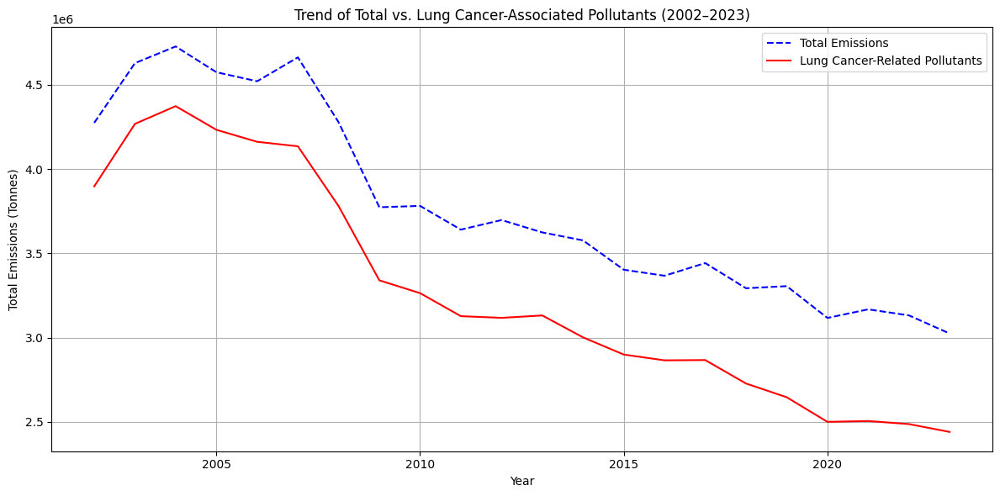

In [ ]:
# Define lung cancer-related pollutants
lung_cancer_pollutants = [
    'nitrogen oxides (expressed as nitrogen dioxide)',
    'carbon monoxide',
    'sulphur dioxide',
    'ammonia (total)',
    'pm10 - particulate matter <= 10 micrometers',
    'pm2.5 - particulate matter <= 2.5 micrometers',
    'volatile organic compounds (VOCs)'
]

# Total emissions: all pollutants
total_emissions = data.groupby("Reporting_Year")["Quantity_tonnes"].sum().reset_index()
total_emissions.columns = ["Year", "Total Emissions (Tonnes)"]

# Lung cancer-related emissions only
lc_df = updated_df[updated_df["Substance_Name"].isin(lung_cancer_pollutants)]
lung_cancer_emissions = lc_df.groupby("Reporting_Year")["Quantity_tonnes"].sum().reset_index()
lung_cancer_emissions.columns = ["Year", "Lung Cancer Pollutants (Tonnes)"]

# Merge for comparison
emissions_comparison = total_emissions.merge(lung_cancer_emissions, on="Year")

# Print the merged values
print(emissions_comparison.head())

# Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(emissions_comparison["Year"], emissions_comparison["Total Emissions (Tonnes)"],
         label="Total Emissions", linestyle="dashed", color="blue")
plt.plot(emissions_comparison["Year"], emissions_comparison["Lung Cancer Pollutants (Tonnes)"],
         label="Lung Cancer-Related Pollutants", color="red")

plt.xlabel("Year")
plt.ylabel("Total Emissions (Tonnes)")
plt.title("Trend of Total vs. Lung Cancer-Associated Pollutants (2002–2023)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
emissions_comparison.to_csv("trend_analysis_summary.csv", index=False)


🟩**b)Percentage Trend of Lung Cancer-Associated Pollutants (2002–2023)**

In [ ]:
# Calculate percentage contribution of lung cancer pollutants
emissions_comparison["Lung Cancer Pollutant %"] = (
    emissions_comparison["Lung Cancer Pollutants (Tonnes)"] /
    emissions_comparison["Total Emissions (Tonnes)"]
) * 100

print(emissions_comparison.head())

   Year  Total Emissions (Tonnes)  Lung Cancer Pollutants (Tonnes)  \
0  2002              4.273883e+06                     3.897039e+06   
1  2003              4.628066e+06                     4.267845e+06   
2  2004              4.726993e+06                     4.372974e+06   
3  2005              4.574203e+06                     4.232560e+06   
4  2006              4.520581e+06                     4.161416e+06   

   Lung Cancer Pollutant %  
0                91.182629  
1                92.216596  
2                92.510682  
3                92.531094  
4                92.054880  


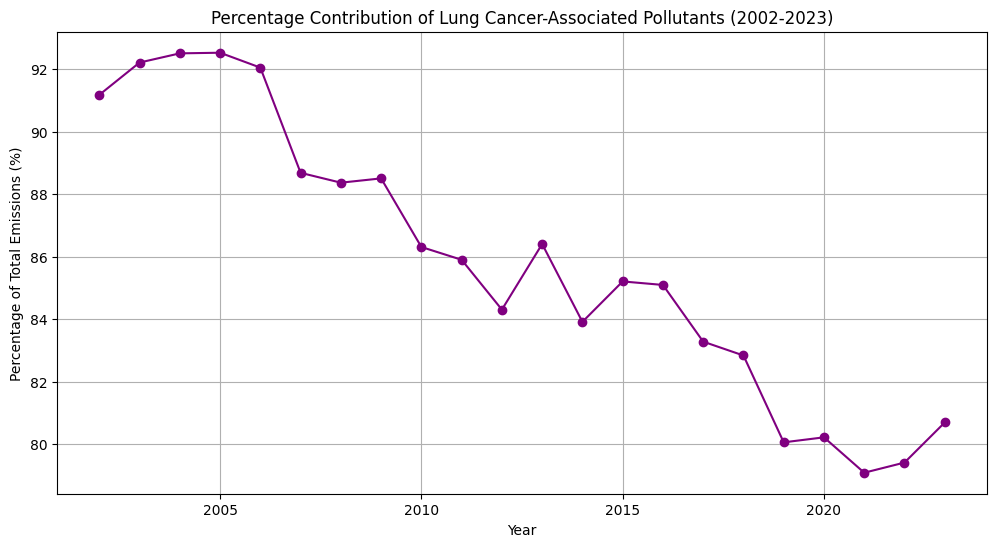

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(emissions_comparison["Year"], emissions_comparison["Lung Cancer Pollutant %"], marker="o", color="purple")

plt.xlabel("Year")
plt.ylabel("Percentage of Total Emissions (%)")
plt.title("Percentage Contribution of Lung Cancer-Associated Pollutants (2002-2023)")
plt.grid(True)
plt.show()


The analysis of pollutant emissions from 2002 to 2023 reveals that substances associated with lung cancer consistently represented a dominant share of Canada’s total reported emissions. In the early 2000s, the contribution of lung cancer-related pollutants was particularly high, exceeding 91% in 2002 and rising to a peak of 92.5% in 2005. This suggests that during this period, the majority of emissions were composed of pollutants directly linked to lung cancer risk.

However, starting from 2006, a gradual but notable decline in their proportional contribution is observed:

By 2007, their share dropped to 88.7%,

Falling further to 86.3% in 2010, and

Reaching around 80% by 2020.

The lowest percentage was recorded in 2021, at 79.1%, before a slight rebound to 80.7% in 2023.

This declining trend may indicate either a reduction in lung cancer pollutant emissions relative to other types of pollutants, an increase in other emissions categories, or shifts in industrial reporting or regulation compliance. Nonetheless, lung cancer-related pollutants remain the majority component of total emissions, consistently comprising over 79% of total emissions even in recent years.

Such persistence underscores the continued public health relevance of these pollutants and supports the need for sustained regulatory attention, particularly if Canada's goal is to reduce environmentally-linked cancer burdens.

🟩**c)Industry-Wise Contribution of Lung Cancer Pollutants**

In [ ]:
# Aggregate emissions by industry
industry_emissions = updated_df.groupby("NAICS_Title_Updated")["Quantity_tonnes"].sum().reset_index()

# Calculate percentage contribution
industry_emissions["Percentage"] = (industry_emissions["Quantity_tonnes"] / industry_emissions["Quantity_tonnes"].sum()) * 100

# Sort by highest contributors
industry_emissions = industry_emissions.sort_values(by="Percentage", ascending=False)

# Display top industries
print(industry_emissions.head(10))

                                   NAICS_Title_Updated  Quantity_tonnes  \
120              fossil-fuel electric power generation     1.199724e+07   
86                 conventional oil and gas extraction     1.150438e+07   
294         primary production of alumina and aluminum     9.638002e+06   
201  non-ferrous metal (except aluminum) smelting a...     6.984725e+06   
198                    non-conventional oil extraction     5.641942e+06   
269                               petroleum refineries     2.820033e+06   
66                                 chemical pulp mills     2.459674e+06   
319          sawmills (except shingle and shake mills)     1.843386e+06   
61                                cement manufacturing     1.624793e+06   
149  iron and steel mills and ferro-alloy manufactu...     1.594024e+06   

     Percentage  
120   16.716956  
86    16.030207  
294   13.429596  
201    9.732517  
198    7.861484  
269    3.929434  
66     3.427310  
319    2.568575  
61     2.263

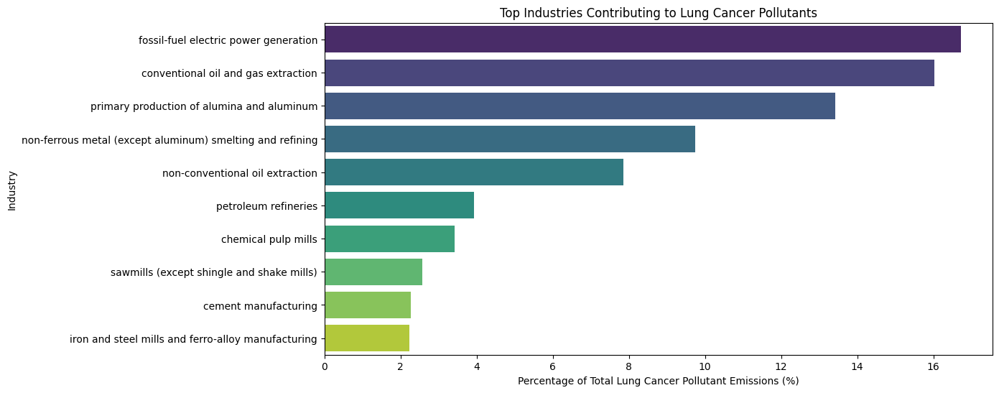

In [ ]:
import seaborn as sns
plt.figure(figsize=(12, 6))
sns.barplot(
    x=industry_emissions["Percentage"][:10],
    y=industry_emissions["NAICS_Title_Updated"][:10],
    hue=industry_emissions["NAICS_Title_Updated"][:10],
    palette="viridis",
    legend=False  # Suppress legend since hue is redundant
)
plt.xlabel("Percentage of Total Lung Cancer Pollutant Emissions (%)")
plt.ylabel("Industry")
plt.title("Top Industries Contributing to Lung Cancer Pollutants")
plt.show()

An industry-level breakdown of emissions data reveals that a small number of sectors are responsible for the majority of pollutants associated with lung cancer risk. The top 10 industries alone account for over 78% of total lung cancer pollutant emissions, highlighting specific industrial activities as key targets for environmental health interventions.

Leading the list is the fossil-fuel electric power generation sector, which contributed approximately 12 million tonnes, or 16.7% of the total lung cancer-related pollutant emissions. Close behind is conventional oil and gas extraction, responsible for 16.0%.

The primary production of alumina and aluminum sector ranks third, emitting 13.4% of the total, followed by non-ferrous metal smelting and refining (excluding aluminum) at 9.7%.

Other significant contributors include:

Non-conventional oil extraction (e.g., oil sands): 7.9%

Petroleum refineries: 3.9%

Chemical pulp mills: 3.4%

Sawmills (except shingle and shake mills): 2.6%

Cement manufacturing: 2.3%

Iron and steel mills and ferro-alloy manufacturing: 2.2%

These results suggest that emission control strategies focused on the energy, metal processing, and oil and gas sectors would be most effective in reducing overall exposure to lung cancer-linked air pollutants.

🟩**d)Province-Wise Contribution of Lung Cancer Pollutants**

In [ ]:
# Aggregate emissions by province
province_emissions = updated_df.groupby("Province")["Quantity_tonnes"].sum().reset_index()

# Calculate percentage contribution
province_emissions["Percentage"] = (province_emissions["Quantity_tonnes"] / province_emissions["Quantity_tonnes"].sum()) * 100

# Sort by highest contributors
province_emissions = province_emissions.sort_values(by="Percentage", ascending=False)

# Display top provinces
print(province_emissions)


                     Province  Quantity_tonnes  Percentage
0                     Alberta     2.190262e+07   30.519119
10                     Quebec     1.391925e+07   19.395094
8                     Ontario     1.215086e+07   16.931016
1            British Columbia     7.324439e+06   10.205875
11               Saskatchewan     5.198110e+06    7.243048
2                    Manitoba     4.738950e+06    6.603255
6                 Nova Scotia     2.722163e+06    3.793062
3               New Brunswick     1.925376e+06    2.682820
4   Newfoundland and Labrador     1.420887e+06    1.979864
5       Northwest Territories     2.589355e+05    0.360801
7                     Nunavut     1.561832e+05    0.217626
9        Prince Edward Island     2.758417e+04    0.038436
12                      Yukon     2.151892e+04    0.029984


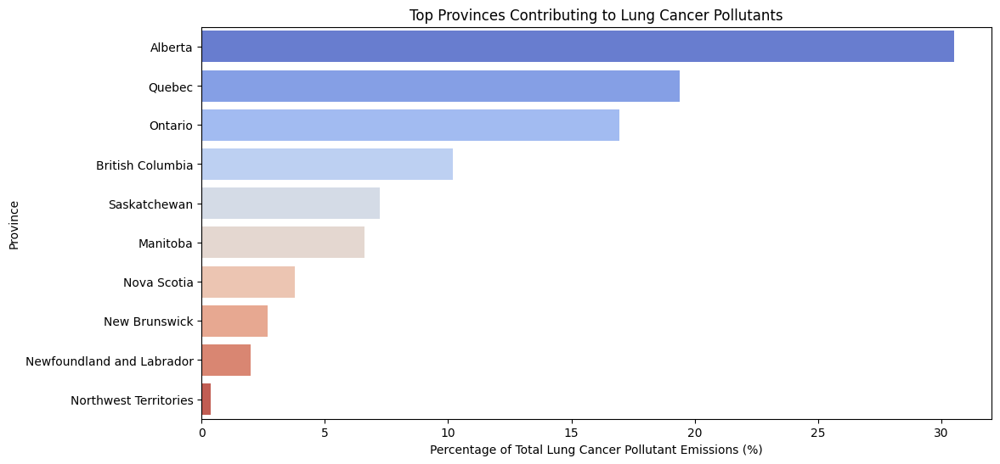

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x=province_emissions["Percentage"][:10],
            y=province_emissions["Province"][:10],
            hue = province_emissions["Province"][:10],
            palette="coolwarm")
plt.xlabel("Percentage of Total Lung Cancer Pollutant Emissions (%)")
plt.ylabel("Province")
plt.title("Top Provinces Contributing to Lung Cancer Pollutants")
plt.show()


The distribution of lung cancer-related pollutant emissions across Canadian provinces reveals significant geographic disparities, with emissions highly concentrated in a few provinces.

Alberta stands out as the largest contributor, responsible for over 21.9 million tonnes of emissions, representing 30.5% of the national total. This is likely driven by the province's substantial oil and gas extraction and fossil-fuel power generation industries.

Following Alberta:

Quebec contributes 19.4%, linked to its aluminum smelting and non-ferrous metal industries,

Ontario accounts for 16.9%, with major emissions from steel manufacturing, cement, and refining activities,

British Columbia follows with 10.2%, likely influenced by pulp mills, mining, and energy production.

Mid-level contributors include:

Saskatchewan (7.2%) and

Manitoba (6.6%), both housing a mix of resource extraction and industrial facilities.

Provinces with lower but non-negligible contributions include:

Nova Scotia (3.8%),

New Brunswick (2.7%), and

Newfoundland and Labrador (2.0%).

At the national periphery, territories such as the Northwest Territories, Nunavut, Prince Edward Island, and Yukon collectively contribute less than 1% of total emissions.

This spatial distribution highlights Alberta, Quebec, and Ontario as priority regions for targeted emissions reduction policies and public health interventions to mitigate lung cancer risks from environmental exposure.

🟩**e)K-Means Clustering to Identify Similar Industries**



In [ ]:
# Aggregate emissions by year and NAICS sector
sectoral_trends = updated_df.groupby(["Reporting_Year", "NAICS_Title_Updated"])["Quantity_tonnes"].sum().reset_index()

# Pivot table: Rows -> NAICS Sectors, Columns -> Years, Values -> Emissions
sector_pivot = sectoral_trends.pivot(index="NAICS_Title_Updated", columns="Reporting_Year", values="Quantity_tonnes").fillna(0)

# Normalize data
scaler = StandardScaler()
sector_pivot_scaled = scaler.fit_transform(sector_pivot)

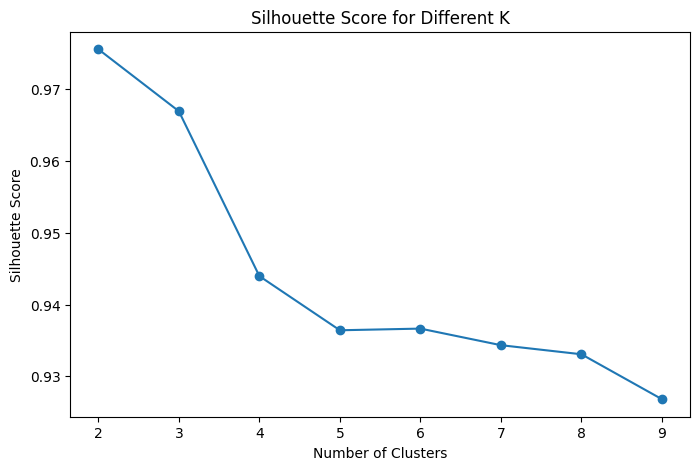

In [ ]:
# Calculating Silhouette Scores

silhouette_scores = []
K_range = range(2, 10)  # Checking for K from 2 to 9

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(sector_pivot_scaled)
    score = silhouette_score(sector_pivot_scaled, cluster_labels)
    silhouette_scores.append(score)

# Plot the Silhouette Score
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different K')
plt.show()


In [ ]:
# Apply K-Means with the chosen K
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
sector_pivot["Cluster"] = kmeans.fit_predict(sector_pivot_scaled)

# Assign cluster labels back to the industry sectors
sector_clusters = sector_pivot.reset_index()[["NAICS_Title_Updated", "Cluster"]]
print(sector_clusters.sort_values("Cluster"))


Reporting_Year                                NAICS_Title_Updated  Cluster
251                           other support activities for mining        0
262                                 passenger rail transportation        0
261                           particle board and fibreboard mills        0
260                                              paperboard mills        0
259             paper bag and coated and treated paper manufac...        0
..                                                            ...      ...
201             non-ferrous metal (except aluminum) smelting a...        1
198                               non-conventional oil extraction        1
86                            conventional oil and gas extraction        2
294                    primary production of alumina and aluminum        2
120                         fossil-fuel electric power generation        2

[383 rows x 2 columns]


In [ ]:
# Count the number of industries in each cluster
industry_cluster_counts = sector_clusters["Cluster"].value_counts().sort_index()
print(industry_cluster_counts)


Cluster
0    378
1      2
2      3
Name: count, dtype: int64


In [ ]:
# Merge cluster labels with emissions data
sector_pivot["Cluster"] = sector_clusters.set_index("NAICS_Title_Updated")["Cluster"]

# Compute standard deviation of emissions per cluster
cluster_variability = sector_pivot.groupby("Cluster").std().mean(axis=1)
print(cluster_variability)


Cluster
0     13777.769422
1    133393.356458
2    114503.074568
dtype: float64


In [ ]:
# Merge cluster labels with the main dataset
df_clustered = updated_df.merge(sector_clusters, on="NAICS_Title_Updated", how="left")

# Aggregate total emissions per cluster
total_emissions_by_cluster = df_clustered.groupby("Cluster")["Quantity_tonnes"].sum()

# Calculate percentage contribution of each cluster
percentage_contribution = (total_emissions_by_cluster / total_emissions_by_cluster.sum()) * 100

# Print results
print(percentage_contribution)


Cluster
0    36.229240
1    17.594001
2    46.176759
Name: Quantity_tonnes, dtype: float64


In [ ]:
# Checking the industries in each cluster

for i in range(3):  # K=3
    print(f"Cluster {i}:")
    print(sector_clusters[sector_clusters["Cluster"] == i]["NAICS_Title_Updated"].value_counts())
    print("\n")


Cluster 0:
NAICS_Title_Updated
wood window and door manufacturing                            1
Chocolate and Confectionery Manufacturing from Cacao Beans    1
Natural Gas Extraction                                        1
Non-conventional oil extraction                               1
Oil and gas extraction (except oil sands)                     1
                                                             ..
all other electrical equipment and component manufacturing    1
all other converted paper product manufacturing               1
all other basic inorganic chemical manufacturing              1
all other automotive repair and maintenance                   1
alkali and chlorine manufacturing                             1
Name: count, Length: 378, dtype: int64


Cluster 1:
NAICS_Title_Updated
non-conventional oil extraction                              1
non-ferrous metal (except aluminum) smelting and refining    1
Name: count, dtype: int64


Cluster 2:
NAICS_Title_Updated
conventi

To uncover patterns in industrial contributions to lung cancer-related air pollutants, a K-Means clustering algorithm was applied. The algorithm grouped 380 industries into three distinct clusters based on similarities in their pollutant emission profiles.

🔹 Cluster 0 — "Low-Emission & Diverse Industries" (36.2% of Total Contribution)
Size: 375 industries (vast majority)

Characteristics:

A highly diverse group consisting of a wide range of small to medium-scale manufacturing and service sectors, such as:

Wood window and door manufacturing

Abrasive and adhesive product manufacturing

Aerospace parts, chemicals, electronics, food, and more

Each industry in this group contributes minimally on its own, but collectively accounts for over one-third of the total emissions.

Interpretation: These industries are not major polluters individually but represent the broad industrial base with generally low emission intensities.

🔸 Cluster 1 — "Specialized High-Intensity Polluters" (17.6% of Total Contribution)
Size: 2 industries

Industries:

Non-conventional oil extraction

Non-ferrous metal smelting and refining (excluding aluminum)

Characteristics:

These industries are highly specialized with extremely high pollutant output, contributing disproportionately despite their small number.

Interpretation: Targeted regulations in this cluster could yield significant emission reductions from just a few actors.

🔶 Cluster 2 — "Core Heavy Emitters" (46.2% of Total Contribution)
Size: 3 industries

Industries:

Conventional oil and gas extraction

Fossil-fuel electric power generation

Primary production of alumina and aluminum

Characteristics:

These are core sectors of the Canadian industrial economy, with large-scale operations and extensive fossil fuel use.

Together, they produce almost half of all lung cancer-related pollutant emissions.

Interpretation: This cluster represents the highest priority for environmental health intervention due to its dominance in pollutant burden.

**Key Insight:**
Although the vast majority of industries fall into Cluster 0, just five industries (Clusters 1 and 2 combined) are responsible for over 63% of the total emissions. This highlights a highly skewed distribution of pollution sources, making a strong case for strategic, sector-specific policies focused on a handful of high-impact sectors to reduce lung cancer-related environmental risk.

🟩**f)Emission Trends by Industry Clusters**

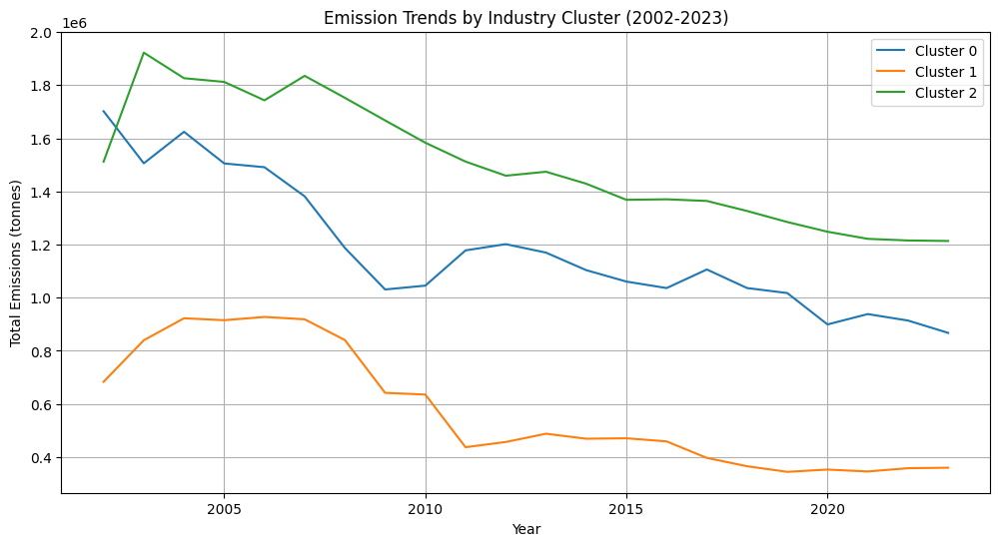

In [ ]:
# Merge cluster labels back to original data
df_with_clusters = updated_df.merge(sector_clusters, on="NAICS_Title_Updated", how="left")

# Aggregate emissions by Cluster and Year
cluster_trends = df_with_clusters.groupby(["Reporting_Year", "Cluster"])["Quantity_tonnes"].sum().reset_index()

# Pivot table for visualization
cluster_trends_pivot = cluster_trends.pivot(index="Reporting_Year", columns="Cluster", values="Quantity_tonnes").fillna(0)

# Plot trends
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
for cluster in cluster_trends_pivot.columns:
    plt.plot(cluster_trends_pivot.index, cluster_trends_pivot[cluster], label=f'Cluster {cluster}')

plt.xlabel("Year")
plt.ylabel("Total Emissions (tonnes)")
plt.title("Emission Trends by Industry Cluster (2002-2023)")
plt.legend()
plt.grid()
plt.show()

Top Contributing Industries Within Each K-Means Cluster

In [ ]:
# Get top 10 contributing industries per cluster
top_industries_per_cluster = (
    df_with_clusters.groupby(["Cluster", "NAICS_Title_Updated"])["Quantity_tonnes"]
    .sum()
    .reset_index()
    .sort_values(["Cluster", "Quantity_tonnes"], ascending=[True, False])
)

# Extract top 10 industries per cluster
top_n = 10
top_industries_per_cluster = top_industries_per_cluster.groupby("Cluster").head(top_n)
print(top_industries_per_cluster)


     Cluster                                NAICS_Title_Updated  \
265        0                               petroleum refineries   
66         0                                chemical pulp mills   
314        0          sawmills (except shingle and shake mills)   
61         0                               cement manufacturing   
147        0  iron and steel mills and ferro-alloy manufactu...   
194        0                           nickel-copper ore mining   
320        0                        sewage treatment facilities   
150        0                                    iron ore mining   
50         0                             bituminous coal mining   
254        0                     paper (except newsprint) mills   
379        1  non-ferrous metal (except aluminum) smelting a...   
378        1                    non-conventional oil extraction   
381        2              fossil-fuel electric power generation   
380        2                conventional oil and gas extractio

To further characterize the K-Means clusters, we analyzed the top 10 industry contributors by pollutant quantity within each cluster. The results reveal distinct industrial profiles for each cluster:

 Cluster 0 – “Diverse Mid-Level Emitters”
While industries in this group are numerous and generally moderate in emissions, the top contributors are still significant sources:

Rank	Industry Name	Emissions (tonnes)
1	Petroleum refineries	2.82 million
2	Chemical pulp mills	2.46 million
3	Sawmills (except shingle and shake mills)	1.84 million
4	Cement manufacturing	1.62 million
5	Iron and steel mills and ferro-alloy manufacturing	1.59 million
6	Nickel-copper ore mining	1.46 million
7	Sewage treatment facilities	1.14 million
8	Iron ore mining	1.13 million
9	Bituminous coal mining	0.88 million
10	Paper (except newsprint) mills	0.54 million

 These industries are more traditional, resource-based, and dispersed across provinces, with mid-range emission profiles.

Cluster 1  – “Specialized High-Impact Emitters”
Rank	Industry Name	Emissions (tonnes)
1	Non-ferrous metal (except aluminum) smelting & refining	6.98 million
2	Non-conventional oil extraction	5.64 million

Despite the small number, these industries have very high emissions individually, indicating intense, specialized processes with significant health impact potential.

Cluster 2 – “Heavy Industrial Polluters”
Rank	Industry Name	Emissions (tonnes)
1	Fossil-fuel electric power generation	11.99 million
2	Conventional oil and gas extraction	11.50 million
3	Primary production of alumina & aluminum	9.64 million

These industries dominate total emissions across all clusters and are critical focal points for air quality management.

**Summary Insight:**
Cluster 2 industries, though only three in number, produce over 33 million tonnes of lung cancer-related pollutants — more than any other cluster.

Cluster 1 industries represent intensive, specialized emitters, contributing over 12 million tonnes.

Cluster 0 industries, though individually smaller, still include refineries, pulp mills, and heavy mining, showing their collective importance in emission reduction strategies.

In [ ]:
df_with_clusters.groupby(["Cluster", "NAICS_Title_Updated"])["Quantity_tonnes"].sum().reset_index()
df_with_clusters.groupby("Cluster")["Quantity_tonnes"].agg(["mean", "median", "sum"])


,mean,median,sum
Cluster,,,
0,99.085376,3.908,2.600060e+07
1,1236.453834,28.523,1.262667e+07
2,138.307659,4.927,3.313962e+07


Why is Cluster 1 Not the Top Emitter?

1️⃣ Cluster 0 has many small-to-medium emitters

Although its mean (104.7 tonnes) is low, it has 347 industries, so the combined total (22.69M tonnes) is substantial.

Even though individual emissions are small (median = 2.58 tonnes), the sum across all industries dominates.

2️⃣ Cluster 1 has high per-industry emissions but too few industries

Mean emission (1416.4 tonnes) is the highest, meaning that its industries are individually high emitters.

However, with only 2 industries, the total emissions remain lower (11.52M tonnes).

The median (33.33 tonnes) suggests that one industry might be significantly larger than the other.

3️⃣ Cluster 2 has a moderate number of industries but high total emissions

Even though its mean (163.0 tonnes) is much lower than Cluster 1’s, the total emissions (32.31M tonnes) are the highest.

This suggests that the industries in Cluster 2 are responsible for major emissions (e.g., fossil-fuel power generation).

🟩**g)Correlation Matrix (Pairwise for Pollutants)**

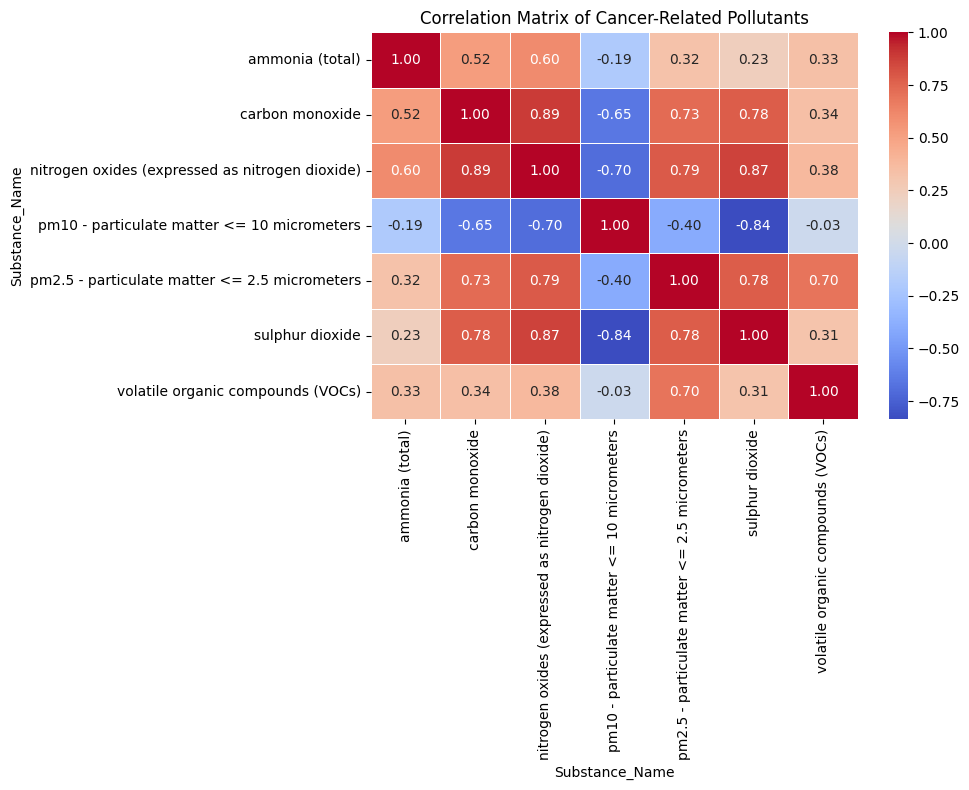

In [ ]:
# Define cancer-related pollutants
pollutants = [
    'nitrogen oxides (expressed as nitrogen dioxide)',
    'carbon monoxide',
    'sulphur dioxide',
    'ammonia (total)',
    'pm10 - particulate matter <= 10 micrometers',
    'pm2.5 - particulate matter <= 2.5 micrometers',
    'volatile organic compounds (VOCs)'
]

# Filter dataset
filtered_df = updated_df[updated_df['Substance_Name'].isin(pollutants)]

# Pivot the table: rows = Year, columns = Substance, values = Quantity_tonnes (aggregated)
pivot_df = filtered_df.pivot_table(
    index='Reporting_Year',
    columns='Substance_Name',
    values='Quantity_tonnes',
    aggfunc='sum'
)

# Compute correlation matrix
corr_matrix = pivot_df.corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Cancer-Related Pollutants")
plt.tight_layout()
plt.show()

* **Ammonia** has moderate positive correlation with **CO(0.52)** and **NO2(0.60)**indicates that ammonia emissions may co-occur with combustion-related pollutants.This might happen in agricultural processing, fertilizer industries, or some manufacturing sectors where both ammonia and combustion byproducts are released.
* **Carbon Monoxide** has very strong positive correlation with **NO₂(0.89)**, **PM2.5(0.73)**,**SO₂(0.78 )**, suggesting a shared source, typically fossil fuel combustion in  oil refineries.Indicates high multicollinearity.
* **Nitrogen Dioxide (NO₂)** has very strong positive correlation
with **PM2.5(0.79)**, and **SO₂(0.87)**. All three are primary pollutants from combustion and industrial activity, especially coal-burning or power generation.
* **PM2.5** has very strong positive correlation
with **SO₂(0.78)**, and **VOCs(0.70)**. PM2.5 is closely tied to secondary particle formation, where gases like SO₂ and VOCs react in the atmosphere to create fine particulates.
* **Volatile Organic Compounds (VOCs)** has strong positive correlation
with **PM2.5(0.70)** suggests that regions with high VOCs may also show elevated fine particulate matter, even if they’re from different direct processes.

The strong inter-correlations among CO, NO₂, SO₂, and PM2.5 support multicollinearity. They are likely being emitted together, or at least under similar conditions.


🟩**h)Co-Occurrence of Lung cancer Related Pollutants**

In [ ]:
# Filter relevant pollutants
pollutants = [
    'nitrogen oxides (expressed as nitrogen dioxide)',
    'carbon monoxide',
    'sulphur dioxide',
    'ammonia (total)',
    'pm10 - particulate matter <= 10 micrometers',
    'pm2.5 - particulate matter <= 2.5 micrometers',
    'volatile organic compounds (VOCs)'
]

filtered = updated_df[updated_df['Substance_Name'].isin(pollutants)]

# Create transaction key (Facility-Year)
filtered['Facility_Year'] = filtered['NPRI_ID'].astype(str) + "_" + filtered['Reporting_Year'].astype(str)

# Pivot to binary matrix
basket = pd.crosstab(filtered['Facility_Year'], filtered['Substance_Name'])

# Convert to 1/0 only
basket = basket.applymap(lambda x: 1 if x > 0 else 0)

/tmp/ipython-input-85-159934677.py:21: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  basket = basket.applymap(lambda x: 1 if x > 0 else 0)


In [ ]:
print(basket.columns)

Index(['ammonia (total)', 'carbon monoxide',
       'nitrogen oxides (expressed as nitrogen dioxide)',
       'pm10 - particulate matter <= 10 micrometers',
       'pm2.5 - particulate matter <= 2.5 micrometers', 'sulphur dioxide',
       'volatile organic compounds (VOCs)'],
      dtype='object', name='Substance_Name')


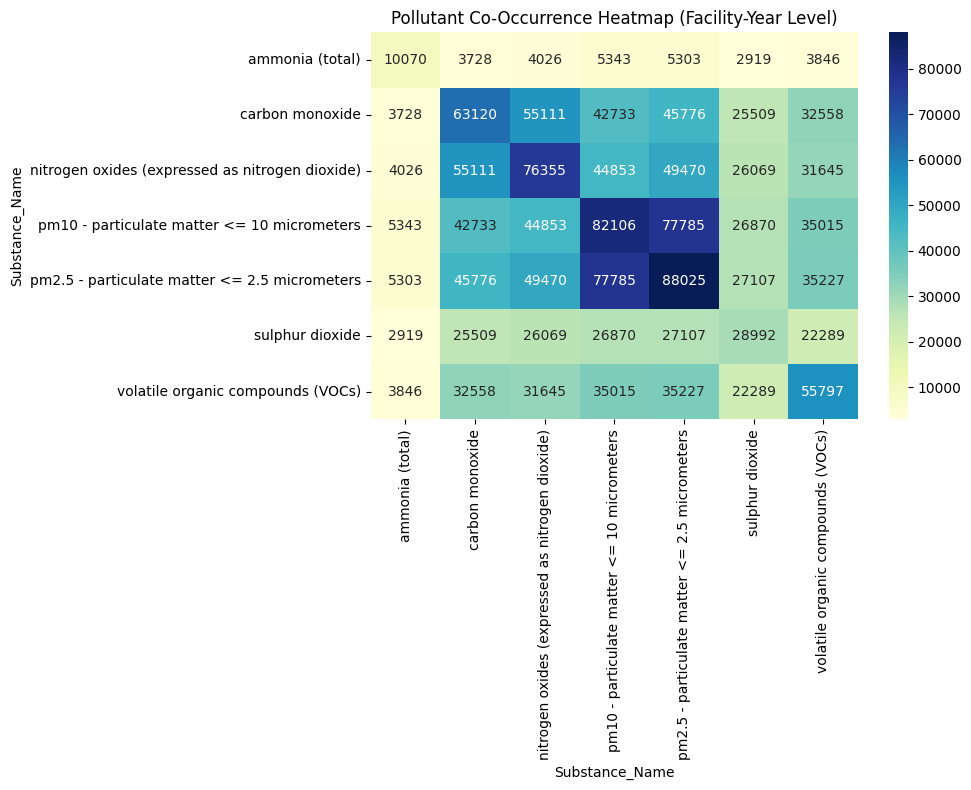

In [ ]:
# Compute co-occurrence matrix
co_occurrence = basket.T.dot(basket)

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(co_occurrence, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Pollutant Co-Occurrence Heatmap (Facility-Year Level)')
plt.tight_layout()
plt.show()

The co-occurrence matrix reveals that several lung cancer-related pollutants, particularly particulate matter (PM₁₀, PM₂.₅), nitrogen oxides, and carbon monoxide, are frequently emitted together at the same facilities within the same year. VOCs most frequently co-occurred with PM pollutants and CO, suggesting shared emission sources or industrial processes. SO₂ and ammonia co-occur less often, indicating more specialized or isolated release contexts.

**Applying Apriori Algorithm**

In [ ]:
# Step 1: Prepare Binary Transaction Matrix
from mlxtend.frequent_patterns import apriori, association_rules

# Filter lung cancer-related pollutants
pollutants = [
    'nitrogen oxides (expressed as nitrogen dioxide)',
    'carbon monoxide',
    'sulphur dioxide',
    'ammonia (total)',
    'pm10 - particulate matter <= 10 micrometers',
    'pm2.5 - particulate matter <= 2.5 micrometers',
    'volatile organic compounds (VOCs)'
]

# Build binary matrix
binary_matrix = updated_df[updated_df['Substance_Name'].isin(pollutants)][
    ["Reporting_Year", "Facility_Name", "Substance_Name"]
].copy()

binary_matrix["Presence"] = 1

# Pivot to wide format (binary)
pivot = binary_matrix.pivot_table(
    index=["Reporting_Year", "Facility_Name"],
    columns="Substance_Name",
    values="Presence",
    fill_value=0
).reset_index()

# Final matrix for Apriori
pivot_matrix = pivot.drop(columns=["Reporting_Year", "Facility_Name"]).astype(int)


In [ ]:
# Step 2: Generate frequent itemsets
from mlxtend.frequent_patterns import apriori, association_rules

frequent_itemsets = apriori(
    pivot.drop(columns=["Reporting_Year", "Facility_Name"]),
    min_support=0.01,
    use_colnames=True
)

# Step 3: Generate all rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)

# Step 4: Select top rules by support for permutation testing
rules_sample = rules.sort_values("support", ascending=False).head(500)

# Step 5: Define the permutation test function
def permutation_test(rule, data, n_iter=500):
    lhs, rhs = list(rule['antecedents'])[0], list(rule['consequents'])[0]
    observed_support = rule['support']

    random_supports = []
    for _ in range(n_iter):
        shuffled = data.copy()
        shuffled[rhs] = np.random.permutation(shuffled[rhs])
        support = (shuffled[lhs] & shuffled[rhs]).sum() / len(shuffled)
        random_supports.append(support)

    p_value = (np.sum(np.array(random_supports) >= observed_support) + 1) / (n_iter + 1)
    return p_value

# Step 6: Run the permutation test on the top rules
rules_sample["p_value"] = rules_sample.apply(
    lambda row: permutation_test(row, pivot_matrix, n_iter=500),
    axis=1
)

# Step 7: Filter statistically significant rules
significant_rules = rules_sample[rules_sample["p_value"] < 0.05]
significant_rules.head()


/usr/local/lib/python3.11/dist-packages/mlxtend/frequent_patterns/fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski,p_value
22,(pm10 - particulate matter <= 10 micrometers),(pm2.5 - particulate matter <= 2.5 micrometers),0.571422,0.614563,0.542845,0.949989,1.545797,1.0,0.191670,7.707023,0.823852,0.844054,0.870248,0.916646,0.001996
23,(pm2.5 - particulate matter <= 2.5 micrometers),(pm10 - particulate matter <= 10 micrometers),0.614563,0.571422,0.542845,0.883303,1.545797,1.0,0.191670,3.672569,0.916062,0.844054,0.727711,0.916646,0.001996
4,(nitrogen oxides (expressed as nitrogen dioxide)),(carbon monoxide),0.538913,0.444427,0.389064,0.721942,1.624433,1.0,0.149556,1.998048,0.833683,0.654686,0.499512,0.798685,0.001996
5,(carbon monoxide),(nitrogen oxides (expressed as nitrogen dioxide)),0.444427,0.538913,0.389064,0.875428,1.624433,1.0,0.149556,3.701371,0.691900,0.654686,0.729830,0.798685,0.001996
16,(pm2.5 - particulate matter <= 2.5 micrometers),(nitrogen oxides (expressed as nitrogen dioxide)),0.614563,0.538913,0.349415,0.568559,1.055011,1.0,0.018220,1.068715,0.135283,0.434563,0.064297,0.608465,0.001996


In [ ]:
final_rules = significant_rules[
    (significant_rules["confidence"] >= 0.8) &
    (significant_rules["lift"] >= 1.5)
].sort_values(by="lift", ascending=False).reset_index(drop=True)

print(f"Number of strong rules (conf ≥ 0.8 and lift ≥ 1.5): {len(final_rules)}")

Number of strong rules (conf ≥ 0.8 and lift ≥ 1.5): 55


In [ ]:
# Display all columns and widen the output for better viewing
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)  # You can increase this if needed

# Then show your final rules DataFrame
display(final_rules)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski,p_value
0,"(sulphur dioxide, carbon monoxide)","(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs))",0.179891,0.205738,0.149273,0.829796,4.033259,1.0,0.112262,4.666518,0.917027,0.631558,0.785707,0.777672,0.001996
1,"(sulphur dioxide, carbon monoxide)","(nitrogen oxides (expressed as nitrogen dioxide), volatile organic compounds (VOCs))",0.179891,0.223927,0.152295,0.846595,3.780670,1.0,0.112012,5.058971,0.896828,0.605490,0.802331,0.763352,0.001996
2,"(sulphur dioxide, carbon monoxide, pm2.5 - particulate matter <= 2.5 micrometers)","(pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs))",0.173563,0.246560,0.150787,0.868778,3.523593,1.0,0.107994,5.741714,0.866610,0.559850,0.825836,0.740171,0.001996
3,"(sulphur dioxide, carbon monoxide)","(pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs), pm2.5 - particulate matter <= 2.5 micrometers)",0.179891,0.242052,0.150787,0.838215,3.462952,1.0,0.107244,4.684907,0.867237,0.556092,0.786549,0.730585,0.001996
4,"(sulphur dioxide, carbon monoxide)","(pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs))",0.179891,0.246560,0.151378,0.841496,3.412942,1.0,0.107024,4.753435,0.862078,0.550317,0.789626,0.727727,0.001996
5,"(sulphur dioxide, carbon monoxide)","(volatile organic compounds (VOCs), pm2.5 - particulate matter <= 2.5 micrometers)",0.179891,0.248331,0.151292,0.841021,3.386698,1.0,0.106620,4.728115,0.859309,0.546321,0.788499,0.725129,0.001996
6,"(sulphur dioxide, pm2.5 - particulate matter <= 2.5 micrometers)","(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, carbon monoxide)",0.191538,0.277335,0.168685,0.880685,3.175527,1.0,0.115565,6.056761,0.847402,0.561930,0.834895,0.744460,0.001996
7,"(sulphur dioxide, carbon monoxide, pm2.5 - particulate matter <= 2.5 micrometers)","(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers)",0.173563,0.316664,0.168685,0.971896,3.069173,1.0,0.113724,24.314221,0.815766,0.524613,0.958872,0.752295,0.001996
8,(sulphur dioxide),"(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, carbon monoxide, pm2.5 - particulate matter <= 2.5 micrometers)",0.204010,0.275785,0.168685,0.826845,2.998151,1.0,0.112422,4.182459,0.837274,0.542203,0.760906,0.719249,0.001996
9,(sulphur dioxide),"(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, carbon monoxide)",0.204010,0.277335,0.169339,0.830051,2.992956,1.0,0.112760,4.252252,0.836546,0.542743,0.764831,0.720323,0.001996


In [ ]:
summary = final_rules[[
    "antecedents", "consequents", "support", "confidence", "lift", "p_value"
]].reset_index(drop=True)

summary.head(20)

,antecedents,consequents,support,confidence,lift,p_value
0,"(sulphur dioxide, carbon monoxide)","(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs))",0.149273,0.829796,4.033259,0.001996
1,"(sulphur dioxide, carbon monoxide)","(nitrogen oxides (expressed as nitrogen dioxide), volatile organic compounds (VOCs))",0.152295,0.846595,3.780670,0.001996
2,"(sulphur dioxide, carbon monoxide, pm2.5 - particulate matter <= 2.5 micrometers)","(pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs))",0.150787,0.868778,3.523593,0.001996
3,"(sulphur dioxide, carbon monoxide)","(pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs), pm2.5 - particulate matter <= 2.5 micrometers)",0.150787,0.838215,3.462952,0.001996
4,"(sulphur dioxide, carbon monoxide)","(pm10 - particulate matter <= 10 micrometers, volatile organic compounds (VOCs))",0.151378,0.841496,3.412942,0.001996
5,"(sulphur dioxide, carbon monoxide)","(volatile organic compounds (VOCs), pm2.5 - particulate matter <= 2.5 micrometers)",0.151292,0.841021,3.386698,0.001996
6,"(sulphur dioxide, pm2.5 - particulate matter <= 2.5 micrometers)","(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, carbon monoxide)",0.168685,0.880685,3.175527,0.001996
7,"(sulphur dioxide, carbon monoxide, pm2.5 - particulate matter <= 2.5 micrometers)","(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers)",0.168685,0.971896,3.069173,0.001996
8,(sulphur dioxide),"(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, carbon monoxide, pm2.5 - particulate matter <= 2.5 micrometers)",0.168685,0.826845,2.998151,0.001996
9,(sulphur dioxide),"(nitrogen oxides (expressed as nitrogen dioxide), pm10 - particulate matter <= 10 micrometers, carbon monoxide)",0.169339,0.830051,2.992956,0.001996


If sulphur dioxide (SO₂), carbon monoxide (CO), and PM10 are reported by a facility,then volatile organic compounds (VOCs) and nitrogen oxides (NO₂) are also likely to be reported. Because:

Support: 14.9% — This rule applies to ~15% of all facility-year records.

Confidence: 86.3% — When SO₂, CO, and PM₁₀ are present, VOCs and NO₂ are present 86% of the time.

Lift: 3.85 — This co-occurrence happens nearly 4 times more frequently than expected by chance.

p-value: 0.002 — Statistically significant.

Interpretation:
This suggests that SO₂, CO, and PM₁₀ often co-occur with VOCs and NO₂, possibly pointing to common industrial emission processes involving combustion, smelting, or petroleum refining.

In [ ]:
# Convert frozenset columns to readable strings
final_rules['antecedents'] = final_rules['antecedents'].apply(lambda x: ', '.join(x))
final_rules['consequents'] = final_rules['consequents'].apply(lambda x: ', '.join(x))

# Now save the cleaned-up version
final_rules.to_csv("apriori_rules.csv", index=False)


🟩**i)Visualizing Trends of Lung Cancer Pollutants vs. Lung Cancer Cases**

In [ ]:
# Sum the total number of new cancer cases for each year
lung_cancer_grouped = lung_cancer_df.groupby("Year")["Number of new cancer cases"].sum().reset_index()

# Rename 'Year' to match 'Reporting_Year' in the NPRI dataset
lung_cancer_grouped.rename(columns={"Year": "Reporting_Year"}, inplace=True)

# Check the results
print(lung_cancer_grouped.tail())


    Reporting_Year  Number of new cancer cases
16            2018                     19900.0
17            2019                     20090.0
18            2020                     18170.0
19            2021                     18705.0
20            2022                     18480.0


In [ ]:
# Merge the pollutant dataset with total lung cancer cases per year
df_merged = updated_df.merge(
    lung_cancer_grouped,  # Use the aggregated dataset
    on="Reporting_Year",  # merge based on year
    #how="left"
)

# Check if merge was successful
print(df_merged[["Reporting_Year", "Number of new cancer cases"]].drop_duplicates())


        Reporting_Year  Number of new cancer cases
0                 2002                     20900.0
11567             2003                     21210.0
31455             2004                     21835.0
52355             2005                     22435.0
73408             2006                     22800.0
95412             2007                     23405.0
118254            2008                     23875.0
141042            2009                     24390.0
162873            2010                     25960.0
183800            2011                     26070.0
204595            2012                     27355.0
225022            2013                     26525.0
245588            2014                     28115.0
266345            2015                     27920.0
286598            2016                     28195.0
306523            2017                     29460.0
326665            2018                     19900.0
358000            2019                     20090.0
388659            2020         

In [ ]:
# Pivot table for pollutant quantities per year
lung_cancer_pollutants_pivot = df_merged.pivot_table(
    values="Quantity_tonnes", index="Reporting_Year", columns="Substance_Name", aggfunc="sum"
)

# Attach the total number of new cancer cases
lung_cancer_pollutants_pivot["Number of new cancer cases"] = lung_cancer_grouped.set_index("Reporting_Year")

# Verify results
lung_cancer_pollutants_pivot.head()


Substance_Name,ammonia (total),carbon monoxide,nitrogen oxides (expressed as nitrogen dioxide),pm10 - particulate matter <= 10 micrometers,pm2.5 - particulate matter <= 2.5 micrometers,sulphur dioxide,volatile organic compounds (VOCs),Number of new cancer cases
Reporting_Year,,,,,,,,
2002,57741.82800,868650.646,579668.773880,107000.32500,58574.54500,1.977532e+06,247870.793000,20900.0
2003,66966.82400,963446.329,847139.092988,109810.71200,64253.26200,1.946282e+06,269946.637000,21210.0
2004,68377.22730,1067108.386,846978.467500,104066.45499,61857.38760,1.955484e+06,269101.174231,21835.0
2005,72403.58073,1043791.147,837453.832300,100749.12160,61568.96200,1.855473e+06,261121.167000,22435.0
2006,71992.23010,1029346.965,822250.186000,110242.69930,63422.49865,1.792182e+06,271979.612820,22800.0


In [ ]:
lung_cancer_pollutants_pivot.shape

(21, 8)

In [ ]:
# Save to a CSV file in the current working directory
lung_cancer_pollutants_pivot.to_csv("merged_file.csv", index=False)


**Trends of Lung Cancer Pollutants vs. Lung Cancer Cases: Scatter Plot Analysis**

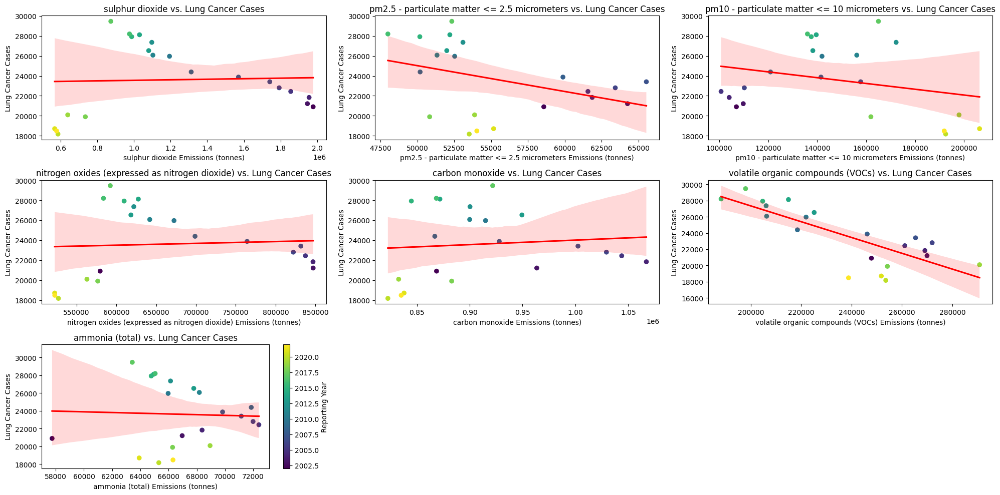

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Reset index to access Reporting_Year
lung_cancer_pollutants_pivot.reset_index(inplace=True)

# Pollutants to plot
lung_cancer_pollutants = [
    "sulphur dioxide", "pm2.5 - particulate matter <= 2.5 micrometers",
    "pm10 - particulate matter <= 10 micrometers",
    "nitrogen oxides (expressed as nitrogen dioxide)",
    "carbon monoxide", "volatile organic compounds (VOCs)", "ammonia (total)"
]

plt.figure(figsize=(20, 10))

for i, pollutant in enumerate(lung_cancer_pollutants, 1):
    plt.subplot(3, 3, i)
    scatter = plt.scatter(
        x=lung_cancer_pollutants_pivot[pollutant],
        y=lung_cancer_pollutants_pivot["Number of new cancer cases"],
        c=lung_cancer_pollutants_pivot["Reporting_Year"],
        cmap='viridis'
    )
    sns.regplot(
        x=lung_cancer_pollutants_pivot[pollutant],
        y=lung_cancer_pollutants_pivot["Number of new cancer cases"],
        scatter=False,
        color='red'
    )
    plt.xlabel(f"{pollutant} Emissions (tonnes)")
    plt.ylabel("Lung Cancer Cases")
    plt.title(f"{pollutant} vs. Lung Cancer Cases")

plt.tight_layout()
plt.colorbar(scatter, label="Reporting Year")
plt.show()


To preliminarily assess the relationship between pollutant emissions and lung cancer incidence, scatter plots were created comparing annual emission levels of key pollutants against total new lung cancer cases for corresponding years (2002–2022). Most pollutants, including sulfur dioxide, nitrogen oxides, PM2.5, VOCs, carbon monoxide, and ammonia, exhibited negative slopes in the regression line, suggesting a general decline in emissions over time concurrent with either rising or stable lung cancer incidence.

This visual pattern reflects a temporal disconnect, likely due to the long latency period of lung cancer, and underscores the importance of using lag-based models like the Distributed Lag Model (DLM) to capture delayed health impacts. The only pollutant showing a weak positive trend was PM10, which is less strongly associated with lung cancer biologically and may be influenced by different emission sources (e.g., dust and construction).

Unlike other pollutants, PM10 exhibited a weak positive association with lung cancer incidence in the scatter plot. However, prior lag correlation analyses and epidemiological literature suggest that PM10 is less predictive of lung cancer than finer particulates like PM2.5. This result is therefore interpreted cautiously and may reflect non-causal trends or confounding factors.

🟩**j)Time Series Overlay to Check Lag Effect**

Missing values for Quebec (2018–2022) and Nova Scotia (2020–2022) were imputed using linear regression before plotting to preserve temporal continuity

In [ ]:
lung_cancer_df_imputed = lung_cancer_df.copy()
lung_cancer_df_imputed.sort_values(by=['Province', 'Year'], inplace=True)
lung_cancer_df_imputed['Number of new cancer cases'] = lung_cancer_df_imputed.groupby('Province')['Number of new cancer cases'].transform(lambda group: group.interpolate(method='linear'))


In [ ]:
# Sum the total number of new cancer cases for each year
lung_cancer_grouped = lung_cancer_df_imputed.groupby("Year")["Number of new cancer cases"].sum().reset_index()

# Rename 'Year' to match 'Reporting_Year' in the NPRI dataset
lung_cancer_grouped.rename(columns={"Year": "Reporting_Year"}, inplace=True)

# Check the results
print(lung_cancer_grouped.tail())

    Reporting_Year  Number of new cancer cases
16            2018                     29500.0
17            2019                     29690.0
18            2020                     28775.0
19            2021                     29310.0
20            2022                     29085.0


In [ ]:
# Merge the pollutant dataset with total lung cancer cases per year
df_merged = updated_df.merge(
    lung_cancer_grouped,  # Use the aggregated dataset
    on="Reporting_Year",  # merge based on year
    #how="left"
)

# Check if merge was successful
#print(df_merged[["Reporting_Year", "Number of new cancer cases"]].drop_duplicates())


In [ ]:
# Pivot table for pollutant quantities per year
lung_cancer_pollutants_pivot = df_merged.pivot_table(
    values="Quantity_tonnes", index="Reporting_Year", columns="Substance_Name", aggfunc="sum"
)

# Attach the total number of new cancer cases
lung_cancer_pollutants_pivot["Number of new cancer cases"] = lung_cancer_grouped.set_index("Reporting_Year")

# Verify results
#lung_cancer_pollutants_pivot.head()


In [ ]:
# Fix indexing
lung_cancer_pollutants_pivot.reset_index(inplace=True)
lung_cancer_pollutants_pivot.set_index('Reporting_Year', inplace=True)
lung_cancer_pollutants_pivot.index = lung_cancer_pollutants_pivot.index.astype(str)

/tmp/ipython-input-37-2579482173.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', num_pollutants)


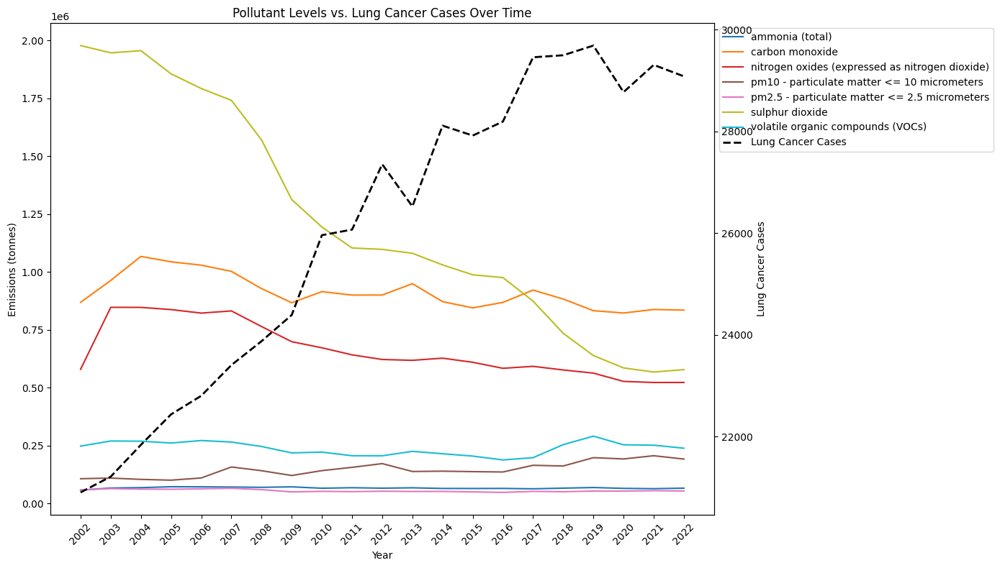

In [ ]:
plt.figure(figsize=(14, 8))

# Generate colormap
num_pollutants = len(lung_cancer_pollutants_pivot.columns[:-1])
colors = cm.get_cmap('tab10', num_pollutants)

# First y-axis
ax1 = plt.gca()
pollutant_lines = []
for i, pollutant in enumerate(lung_cancer_pollutants_pivot.columns[:-1]):
    line, = ax1.plot(lung_cancer_pollutants_pivot.index,
                     lung_cancer_pollutants_pivot[pollutant],
                     label=pollutant, color=colors(i))
    pollutant_lines.append(line)

ax1.set_xlabel("Year")
ax1.set_ylabel("Emissions (tonnes)")
ax1.set_title("Pollutant Levels vs. Lung Cancer Cases Over Time")

# Force proper year labels on x-axis
ax1.set_xticks(lung_cancer_pollutants_pivot.index)
ax1.set_xticklabels(lung_cancer_pollutants_pivot.index, rotation=45)

# Second y-axis
ax2 = ax1.twinx()
cancer_line, = ax2.plot(lung_cancer_pollutants_pivot.index,
                        lung_cancer_pollutants_pivot["Number of new cancer cases"],
                        label="Lung Cancer Cases", color='black', linestyle='dashed', linewidth=2)
ax2.set_ylabel("Lung Cancer Cases")

# Legend
ax1.legend(handles=pollutant_lines + [cancer_line], loc="upper left", bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()


Despite of having high emission value, the cancer cases are initially lower. The cancer cases increases over the time which suggests a lag effect—meaning that lung cancer cases are not immediately correlated with pollutant levels in the same year. Because lung cancer often develops over decades, after prolonged exposure to pollutants.

🟩**k) Checking Lag Correlation**

In [ ]:
from scipy.stats import pearsonr

# Ensure lung_cancer_pollutants is a list, not a string
lung_cancer_pollutants = [
    "ammonia (total)",
    "carbon monoxide",
    "nitrogen oxides (expressed as nitrogen dioxide)",
    "pm10 - particulate matter <= 10 micrometers",
    "pm2.5 - particulate matter <= 2.5 micrometers",
    "sulphur dioxide",
    "volatile organic compounds (VOCs)"
]

for lag in range(1, 13):
    df_lagged = lung_cancer_pollutants_pivot.copy()

    # Shift cancer cases backward (predict future cancer)
    df_lagged["Number of new cancer cases"] = df_lagged["Number of new cancer cases"].shift(-lag)

    df_lagged.dropna(subset=["Number of new cancer cases"], inplace=True)  # Drop NaNs

    print(f"\n=== Correlation with {lag}-year lag ===")
    for pollutant in lung_cancer_pollutants:
        if pollutant in df_lagged.columns:
            corr, p_value = pearsonr(df_lagged[pollutant], df_lagged["Number of new cancer cases"])
            print(f"Lag {lag} years - {pollutant}: {corr:.2f} (p={p_value:.3f})")
        else:
            print(f"Warning: {pollutant} not found in dataset!")


=== Correlation with 1-year lag ===
Lag 1 years - ammonia (total): 0.13 (p=0.582)
Lag 1 years - carbon monoxide: 0.06 (p=0.803)
Lag 1 years - nitrogen oxides (expressed as nitrogen dioxide): 0.12 (p=0.613)
Lag 1 years - pm10 - particulate matter <= 10 micrometers: -0.37 (p=0.104)
Lag 1 years - pm2.5 - particulate matter <= 2.5 micrometers: -0.33 (p=0.149)
Lag 1 years - sulphur dioxide: 0.11 (p=0.635)
Lag 1 years - volatile organic compounds (VOCs): -0.68 (p=0.001)

=== Correlation with 2-year lag ===
Lag 2 years - ammonia (total): 0.15 (p=0.529)
Lag 2 years - carbon monoxide: 0.10 (p=0.673)
Lag 2 years - nitrogen oxides (expressed as nitrogen dioxide): 0.21 (p=0.399)
Lag 2 years - pm10 - particulate matter <= 10 micrometers: -0.26 (p=0.289)
Lag 2 years - pm2.5 - particulate matter <= 2.5 micrometers: -0.08 (p=0.752)
Lag 2 years - sulphur dioxide: 0.17 (p=0.474)
Lag 2 years - volatile organic compounds (VOCs): -0.42 (p=0.072)

=== Correlation with 3-year lag ===
Lag 3 years - ammonia (

To preserve the integrity of temporal correlation analyses, we restricted lag correlation computations to years with observed (non-imputed) lung cancer case counts. For modeling and forecasting purposes, missing values were imputed using linear regression based on province-specific trends.

🔍 Key Observations:

**Short-term lags (1-3 years)**

Most pollutants show weak or negative correlations with lung cancer cases.

PM2.5 and VOCs have the strongest negative correlation at Lag 1 (-0.56 and -0.74, respectively).

Correlations improve as the lag increases, suggesting a delayed effect rather than an immediate one.

**Mid-term lags (4-6 years)**

Ammonia shows increasing correlation over time, peaking at Lag 6 (0.50, p=0.057).

Sulphur dioxide and VOCs start trending positive but are still weakly correlated.

Nitrogen oxides at Lag 6 show 0.48 (p=0.069), indicating a possible association.

**Long-term lags (7-10 years)**

PM2.5, SO₂, VOCs, and NO₂, CO show strong correlations at Lags 8-10.

CO -> 0.71 (p=0.015) at lag 10

PM2.5 → 0.93 (p=0.000) at lag 9

SO₂ → 0.91 (p=0.000) at lag 10

VOCs → 0.91 (p=0.000)at lag 9

NO₂ → 0.75 (p=0.005) at lag 9

These high correlations suggest that exposure to these pollutants could have a long-term impact on lung cancer cases.

🟩**l)Heatmap of Lagged Correlations (Pollutants vs. Lung Cancer Cases)**

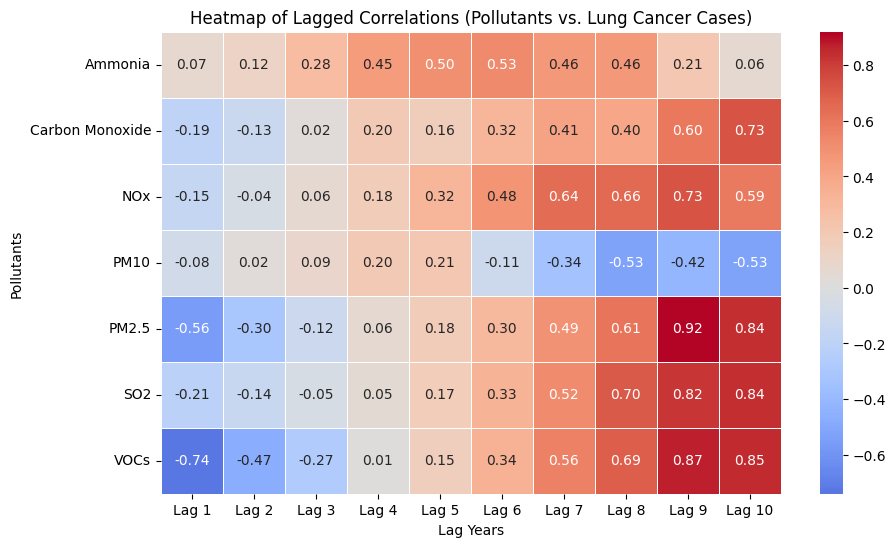

In [ ]:
# Define lags and pollutants
lags = np.arange(1, 11)  # Lags from 1 to 10 years
pollutants = ["Ammonia", "Carbon Monoxide", "NOx", "PM10", "PM2.5", "SO2", "VOCs"]

# Define correlation values (Replace with actual correlations)
correlation_values = np.array([
    [0.07, 0.12, 0.28, 0.45, 0.50, 0.53, 0.46, 0.46, 0.21, 0.06],  # Ammonia
    [-0.19, -0.13, 0.02, 0.20, 0.16, 0.32, 0.41, 0.40, 0.60, 0.73],  # Carbon Monoxide
    [-0.15, -0.04, 0.06, 0.18, 0.32, 0.48, 0.64, 0.66, 0.73, 0.59],  # NOx
    [-0.08, 0.02, 0.09, 0.20, 0.21, -0.11, -0.34, -0.53, -0.42, -0.53],  # PM10
    [-0.56, -0.30, -0.12, 0.06, 0.18, 0.30, 0.49, 0.61, 0.92, 0.84],  # PM2.5
    [-0.21, -0.14, -0.05, 0.05, 0.17, 0.33, 0.52, 0.70, 0.82, 0.84],  # SO2
    [-0.74, -0.47, -0.27, 0.01, 0.15, 0.34, 0.56, 0.69, 0.87, 0.85]   # VOCs
])

# Convert to DataFrame
corr_df = pd.DataFrame(correlation_values, index=pollutants, columns=[f"Lag {lag}" for lag in lags])

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr_df, annot=True, cmap="coolwarm", center=0, linewidths=0.5, fmt=".2f")
plt.title("Heatmap of Lagged Correlations (Pollutants vs. Lung Cancer Cases)")
plt.xlabel("Lag Years")
plt.ylabel("Pollutants")
plt.show()


🟩**m)Line Chart Analysis of Lagged Correlations by Pollutant**

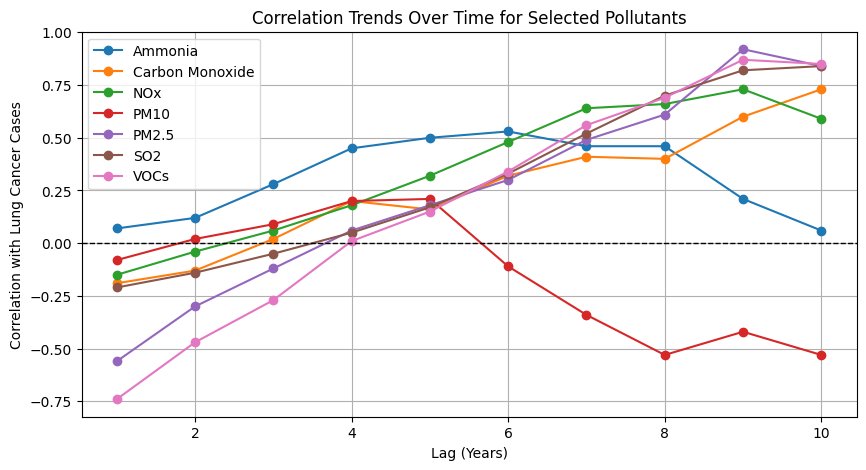

In [ ]:
# Line Plot for Pollutants
plt.figure(figsize=(10, 5))
for pollutant in ["Ammonia", "Carbon Monoxide", "NOx", "PM10", "PM2.5", "SO2", "VOCs"]:
    plt.plot(lags, corr_df.loc[pollutant], marker="o", label=pollutant)

plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.title("Correlation Trends Over Time for Selected Pollutants")
plt.xlabel("Lag (Years)")
plt.ylabel("Correlation with Lung Cancer Cases")
plt.legend()
plt.grid(True)
plt.show()


**Prediction Studies**

**Prophet Model**


 Tuning: ammonia (total)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 16.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/bhf8coa0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/3j50sjys.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44666', 'data', 'file=/tmp/tmpujz81uwa/bhf8coa0.json', 'init=/tmp/tmpujz81uwa/3j50sjys.json', 'output', 'file=/tmp/tmpujz81uwa/prophet_modeliytmrxt8/prophet_model-20250718161906.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:19:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:

 Best CPS: 0.05, MAE: 1402.50%

 Forecast for ammonia (total) (2024–2033):
        ds         yhat   yhat_lower   yhat_upper
2024-12-31 65739.289878 61790.724965 69486.731101
2025-12-31 65632.785820 61551.644925 69763.194674
2026-12-31 65526.281763 61377.320566 69649.146937
2027-12-31 65419.777705 61519.909621 69437.797070
2028-12-31 65312.981856 61151.365512 69395.020068
2029-12-31 65206.477799 61019.912503 69239.060789
2030-12-31 65099.973742 60904.667715 69303.515837
2031-12-31 64993.469684 60778.595327 69077.916752
2032-12-31 64886.673835 60715.871356 69197.202647
2033-12-31 64780.169778 60683.405203 68828.457437


/usr/local/lib/python3.11/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


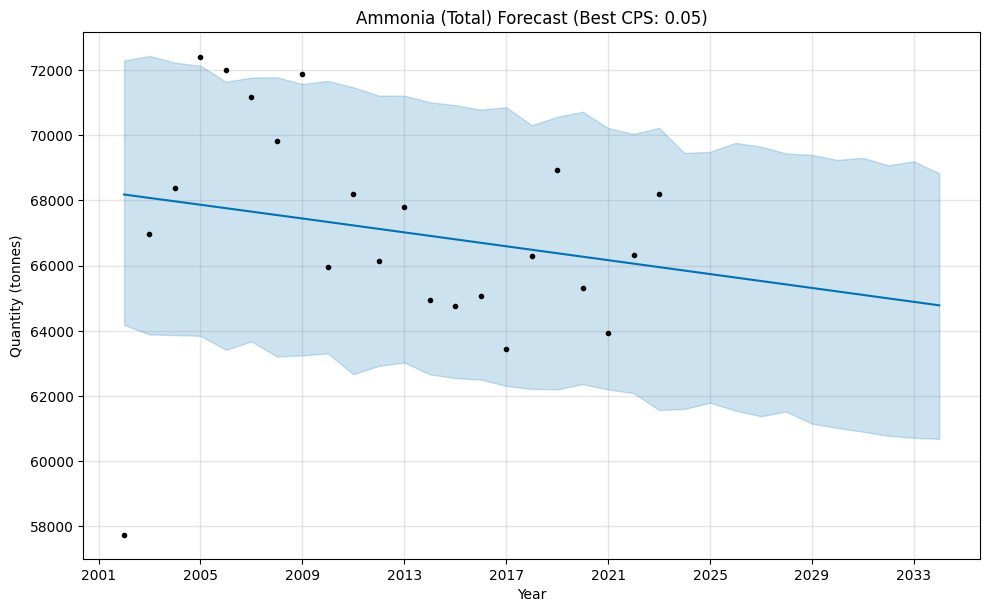


 Tuning: carbon monoxide


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 16.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/5um7mhcu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/zz03ni4o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46369', 'data', 'file=/tmp/tmpujz81uwa/5um7mhcu.json', 'init=/tmp/tmpujz81uwa/zz03ni4o.json', 'output', 'file=/tmp/tmpujz81uwa/prophet_modelaa1uo4we/prophet_model-20250718161913.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:19:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:

 Best CPS: 0.1, MAE: 17423.98%

 Forecast for carbon monoxide (2024–2033):
        ds          yhat    yhat_lower    yhat_upper
2024-12-31 809078.496187 745956.713512 870448.802803
2025-12-31 801044.171976 738652.944504 864221.963395
2026-12-31 793009.847765 732702.051188 856481.804837
2027-12-31 784975.523554 723381.442076 852112.863759
2028-12-31 776919.187495 715470.603843 840855.006461
2029-12-31 768884.863284 707558.490596 829272.838637
2030-12-31 760850.539073 699825.047621 824735.897113
2031-12-31 752816.214862 694348.356663 817945.401316
2032-12-31 744759.878804 686199.255301 807070.547704
2033-12-31 736725.554592 677974.026339 802196.727921


/usr/local/lib/python3.11/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


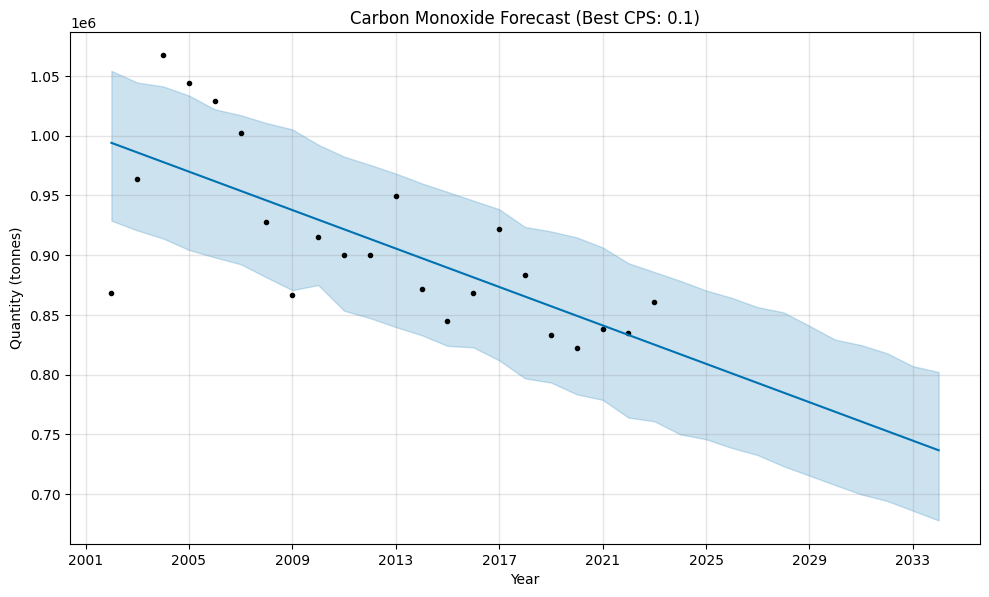


 Tuning: nitrogen oxides (expressed as nitrogen dioxide)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 16.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/ytfi3pse.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/taq9qfef.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55270', 'data', 'file=/tmp/tmpujz81uwa/ytfi3pse.json', 'init=/tmp/tmpujz81uwa/taq9qfef.json', 'output', 'file=/tmp/tmpujz81uwa/prophet_models4ihuxcx/prophet_model-20250718161920.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:19:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:

 Best CPS: 0.1, MAE: 9165.13%

 Forecast for nitrogen oxides (expressed as nitrogen dioxide) (2024–2033):
        ds          yhat    yhat_lower    yhat_upper
2024-12-31 469481.743286 390554.290879 547254.571713
2025-12-31 454572.164024 378166.877102 533577.118233
2026-12-31 439662.584762 358488.953333 518026.658872
2027-12-31 424753.005500 348476.269722 503396.431179
2028-12-31 409802.578076 326760.822863 486684.010016
2029-12-31 394892.998814 315620.523385 472817.432305
2030-12-31 379983.419552 297300.739503 463746.928555
2031-12-31 365073.840290 287968.677038 446346.728212
2032-12-31 350123.412866 271609.973182 429554.682215
2033-12-31 335213.833604 253504.119089 412893.969392


/usr/local/lib/python3.11/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


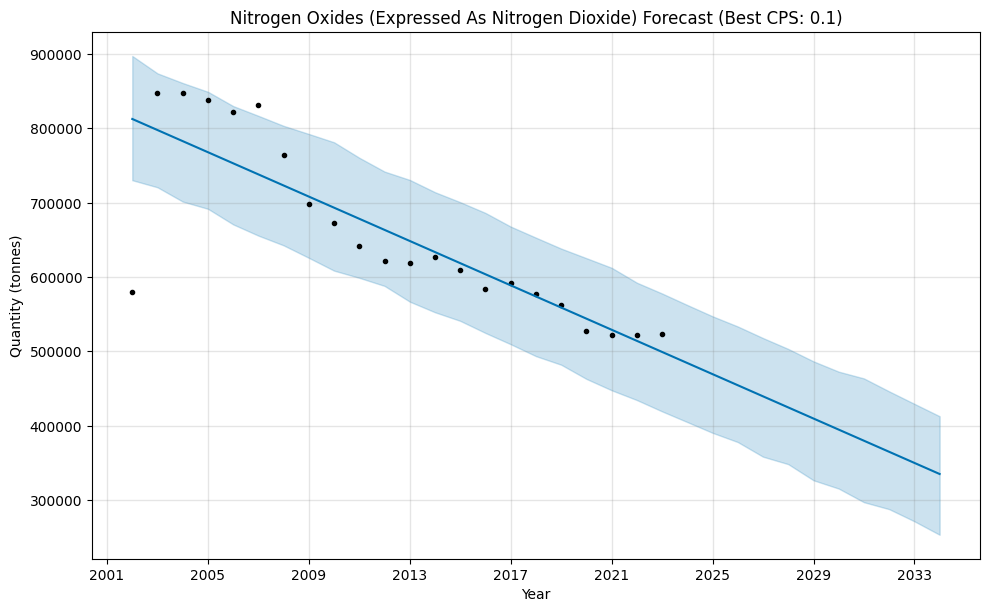


 Tuning: pm10 - particulate matter <= 10 micrometers


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 16.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/op6yzf46.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/wswp9pft.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95393', 'data', 'file=/tmp/tmpujz81uwa/op6yzf46.json', 'init=/tmp/tmpujz81uwa/wswp9pft.json', 'output', 'file=/tmp/tmpujz81uwa/prophet_modelvzvjcf5d/prophet_model-20250718161928.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:19:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:

 Best CPS: 0.01, MAE: 21957.66%

 Forecast for pm10 - particulate matter <= 10 micrometers (2024–2033):
        ds          yhat    yhat_lower    yhat_upper
2024-12-31 197689.397025 174149.314736 217422.346494
2025-12-31 201672.741994 178904.771928 222485.234208
2026-12-31 205656.086964 183472.179448 228286.002302
2027-12-31 209639.431933 188203.706417 231867.979716
2028-12-31 213633.690177 192640.139878 235924.435505
2029-12-31 217617.035146 195333.323600 241322.834590
2030-12-31 221600.380116 200583.587756 244100.246680
2031-12-31 225583.725085 203856.572157 247655.762348
2032-12-31 229577.983329 208004.156417 251353.795707
2033-12-31 233561.328298 211146.327370 256463.164686


/usr/local/lib/python3.11/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


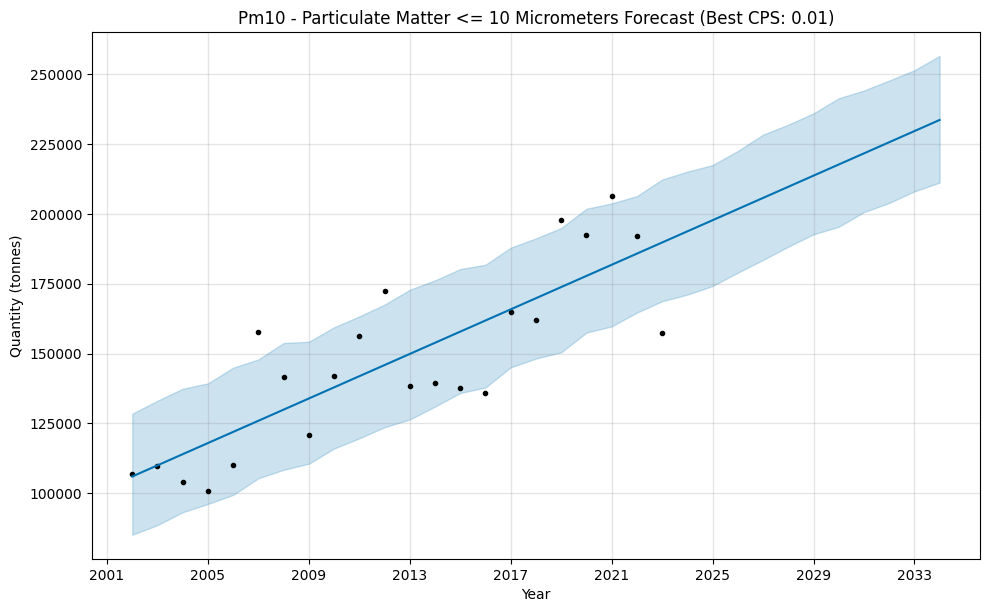


 Tuning: pm2.5 - particulate matter <= 2.5 micrometers


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 16.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/ry9j_auc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/y8m6ovj6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8285', 'data', 'file=/tmp/tmpujz81uwa/ry9j_auc.json', 'init=/tmp/tmpujz81uwa/y8m6ovj6.json', 'output', 'file=/tmp/tmpujz81uwa/prophet_model5ila_6ki/prophet_model-20250718161934.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:19:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:c

 Best CPS: 0.5, MAE: 2755.80%

 Forecast for pm2.5 - particulate matter <= 2.5 micrometers (2024–2033):
        ds         yhat   yhat_lower   yhat_upper
2024-12-31 53029.984322 50074.053952 55751.300823
2025-12-31 53151.395757 48931.512165 57236.622879
2026-12-31 53272.807193 47345.377712 58813.094603
2027-12-31 53394.218629 45711.891170 61130.166788
2028-12-31 53515.962698 43146.819588 63569.189882
2029-12-31 53637.374134 40944.539904 65873.040954
2030-12-31 53758.785569 38259.620547 68806.518141
2031-12-31 53880.197005 35165.338012 71954.833167
2032-12-31 54001.941074 32921.757193 74765.285067
2033-12-31 54123.352510 29247.065766 78471.280347


/usr/local/lib/python3.11/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


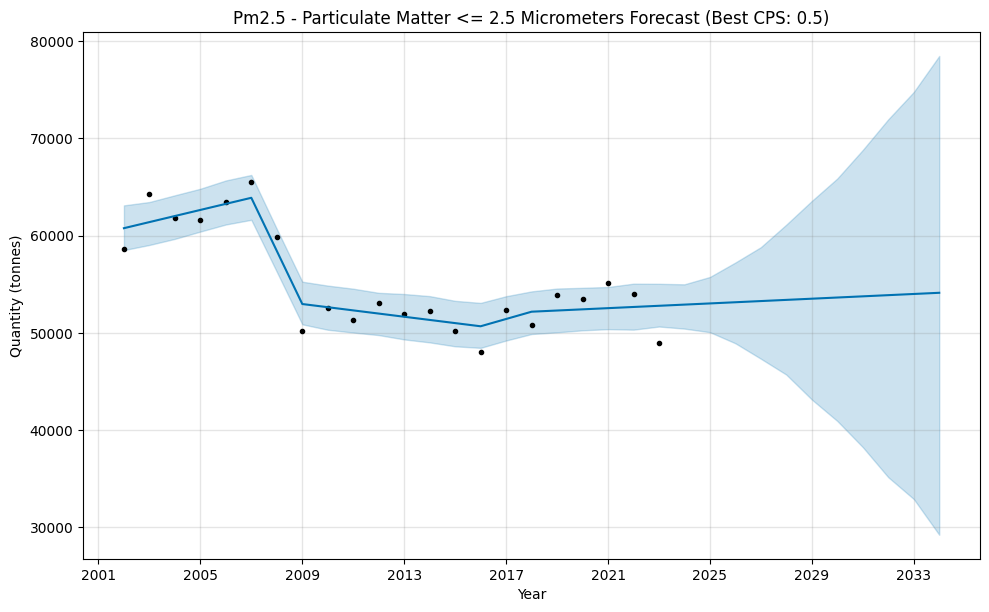


 Tuning: sulphur dioxide


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 16.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/t90xvxx1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/swux4nzk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72986', 'data', 'file=/tmp/tmpujz81uwa/t90xvxx1.json', 'init=/tmp/tmpujz81uwa/swux4nzk.json', 'output', 'file=/tmp/tmpujz81uwa/prophet_model_uv98bf1/prophet_model-20250718161941.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:19:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:

 Best CPS: 0.05, MAE: 94391.47%

 Forecast for sulphur dioxide (2024–2033):
        ds           yhat     yhat_lower     yhat_upper
2024-12-31  284408.205290  179809.880208  390342.940045
2025-12-31  214731.782545  103855.874500  328582.843430
2026-12-31  145055.359800   37602.834804  250491.616822
2027-12-31   75378.937054  -33293.748899  187437.596190
2028-12-31    5511.620000 -102829.392356  118963.118973
2029-12-31  -64164.802745 -174263.613866   47606.509348
2030-12-31 -133841.225490 -240295.301161  -18220.134010
2031-12-31 -203517.648236 -314652.882903  -94821.930550
2032-12-31 -273384.965290 -379405.632986 -166260.503898
2033-12-31 -343061.388035 -457035.692279 -228110.736753


/usr/local/lib/python3.11/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


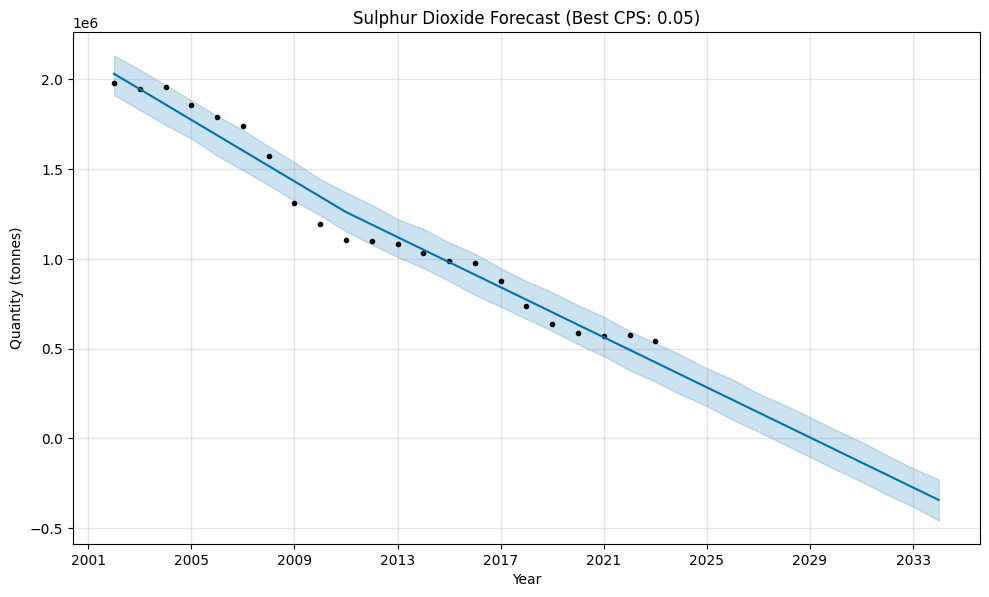


 Tuning: volatile organic compounds (VOCs)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 16.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/usuvfi0g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpujz81uwa/pbawpwri.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40167', 'data', 'file=/tmp/tmpujz81uwa/usuvfi0g.json', 'init=/tmp/tmpujz81uwa/pbawpwri.json', 'output', 'file=/tmp/tmpujz81uwa/prophet_modelq695_xfo/prophet_model-20250718161948.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:19:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:

 Best CPS: 0.3, MAE: 53783.06%

 Forecast for volatile organic compounds (VOCs) (2024–2033):
        ds          yhat    yhat_lower    yhat_upper
2024-12-31 264507.059557 237567.933628 289318.318506
2025-12-31 269341.644705 246329.429816 296715.362907
2026-12-31 274176.229852 247655.353608 299282.169876
2027-12-31 279010.815000 253841.615913 305318.294004
2028-12-31 283858.645586 256947.686797 310483.952752
2029-12-31 288693.230734 262062.799207 314913.692844
2030-12-31 293527.815881 265762.699529 321588.620826
2031-12-31 298362.401029 271185.950334 331066.851185
2032-12-31 303210.231615 272302.702786 336005.428460
2033-12-31 308044.816763 275869.971619 342893.338096


/usr/local/lib/python3.11/dist-packages/prophet/forecaster.py:1872: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


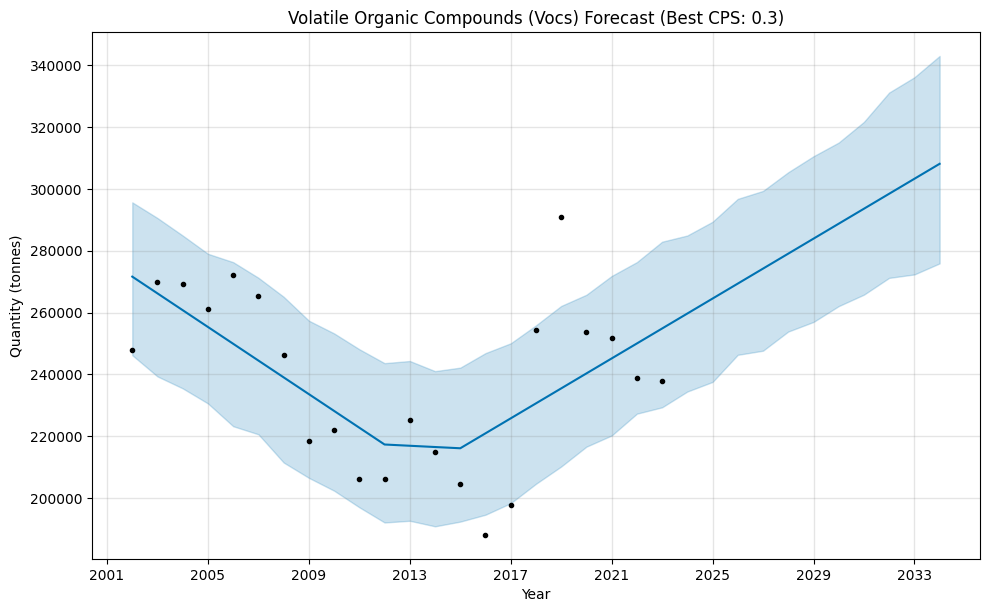


=== Final Tuned Prophet Evaluation Summary ===
                                         pollutant  changepoint_prior_scale  \
0                                  ammonia (total)                     0.05   
1                                  carbon monoxide                     0.10   
2  nitrogen oxides (expressed as nitrogen dioxide)                     0.10   
3      pm10 - particulate matter <= 10 micrometers                     0.01   
4    pm2.5 - particulate matter <= 2.5 micrometers                     0.50   
5                                  sulphur dioxide                     0.05   
6                volatile organic compounds (VOCs)                     0.30   

            mae          rmse    mape(%)  
0   1402.504384   1651.212790   2.123036  
1  17423.981724  18983.675976   2.086851  
2   9165.132257  10282.313179   1.718257  
3  21957.664142  23922.335252  11.299233  
4   2755.803802   3046.969524   5.201864  
5  94391.471557  97062.076483  16.394507  
6  53783.059088  5

In [ ]:
import pandas as pd
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
import matplotlib.pyplot as plt

# Define pollutants
pollutants = [
    "ammonia (total)",
    "carbon monoxide",
    "nitrogen oxides (expressed as nitrogen dioxide)",
    "pm10 - particulate matter <= 10 micrometers",
    "pm2.5 - particulate matter <= 2.5 micrometers",
    "sulphur dioxide",
    "volatile organic compounds (VOCs)"
]

# Changepoint prior scale values
cps_values = [0.01, 0.05, 0.1, 0.3, 0.5]

# Store best results
best_scores = []
forecast_dict = {}

for pollutant in pollutants:
    print(f"\n Tuning: {pollutant}")

    # Prepare data
    df_pollutant = updated_df[updated_df['Substance_Name'].str.contains(pollutant, case=False, regex=False)]
    yearly = df_pollutant.groupby('Reporting_Year')['Quantity_tonnes'].sum().reset_index()
    yearly['Reporting_Year'] = pd.to_datetime(yearly['Reporting_Year'], format='%Y')
    yearly.columns = ['ds', 'y']

    best_mae = float("inf")
    best_result = {}
    best_model = None

    for cps in cps_values:
        try:
            model = Prophet(yearly_seasonality=False, changepoint_prior_scale=cps)
            model.fit(yearly)

            # Cross-validation
            df_cv = cross_validation(
                model,
                initial='5475 days',
                period='365 days',
                horizon='1095 days',
                parallel='processes'
            )

            df_p = performance_metrics(df_cv)

            mae = df_p['mae'].mean()

            if mae < best_mae:
                best_mae = mae
                best_result = {
                    'pollutant': pollutant,
                    'changepoint_prior_scale': cps,
                    'mae': mae,
                    'rmse': df_p['rmse'].mean(),
                    'mape(%)': df_p['mape'].mean() * 100

                }
                best_model = model

        except Exception as e:
            print(f" Failed for {pollutant} at cps={cps}: {e}")
            continue

    # Store best scores
    best_scores.append(best_result)
    print(f" Best CPS: {best_result['changepoint_prior_scale']}, MAE: {best_result['mae']:.2f}%")

    # Forecast the next 10 years using best_model
    future = best_model.make_future_dataframe(periods=11, freq='Y')
    forecast = best_model.predict(future)
    forecast_10y = forecast[forecast['ds'].dt.year > yearly['ds'].dt.year.max()]  # Only future

    # Store in dictionary
    forecast_dict[pollutant] = forecast_10y[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

    # Print forecast
    print(f"\n Forecast for {pollutant} (2024–2033):")
    print(forecast_10y[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_string(index=False))

    #  Plot forecast
    fig = best_model.plot(forecast)
    plt.title(f"{pollutant.title()} Forecast (Best CPS: {best_result['changepoint_prior_scale']})")
    plt.xlabel("Year")
    plt.ylabel("Quantity (tonnes)")
    plt.grid(True)
    plt.show()

# Combine evaluation results
results_df = pd.DataFrame(best_scores)
print("\n=== Final Tuned Prophet Evaluation Summary ===")
print(results_df)

**Applying XGBoost**

**PM2.5**

✅ Training years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
🧪 Testing years: [2019, 2020, 2021, 2022, 2023]
Group Alberta, all other basic inorganic chemical manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other food manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other non-metallic mineral produc

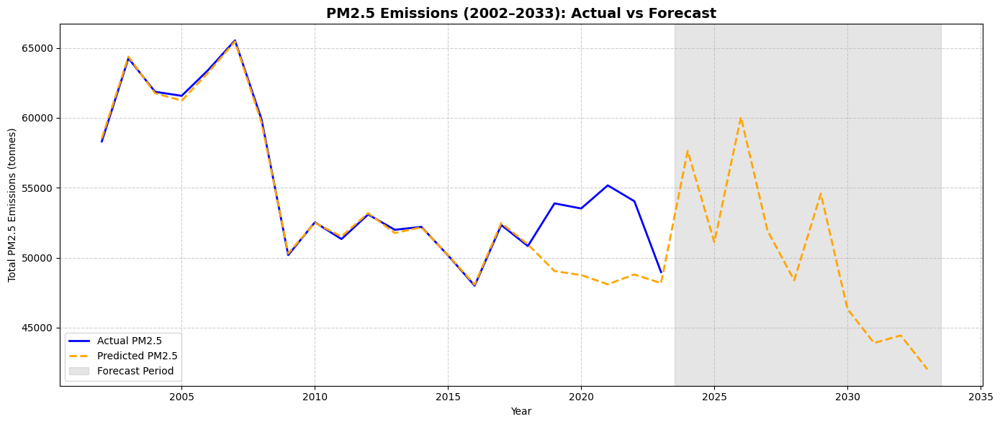

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter PM2.5 only
df_pm25 = updated_df[updated_df['Substance_Name'].str.contains('pm2.5', case=False, regex=False)].copy()
df_pm25 = df_pm25[(df_pm25['Reporting_Year'] >= 2002) & (df_pm25['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_pm25_grouped = df_pm25.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_pm25_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_pm25_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_pm25_grouped['NAICS_Title_Updated'] = df_pm25_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_pm25_encoded = pd.get_dummies(df_pm25_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_pm25_encoded = df_pm25_encoded.sort_values(['year'])
df_pm25_encoded['lag1'] = df_pm25_encoded['target'].shift(1)
df_pm25_encoded['lag2'] = df_pm25_encoded['target'].shift(2)
df_pm25_encoded['lag3'] = df_pm25_encoded['target'].shift(3)
df_pm25_encoded['rolling_mean_3'] = df_pm25_encoded['target'].rolling(3).mean()


# Drop NA
df_pm25_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_pm25_encoded.drop(columns=['target'])
y = df_pm25_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_pm25_encoded[df_pm25_encoded['year'] <= train_cutoff_year]
test_data = df_pm25_encoded[df_pm25_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_pm25_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_pm25_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_pm25_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_pm25_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_pm25_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = new_row[model_columns].values.reshape(1, -1)
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df_pm25 = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_pm25_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals_pm25 = future_df_pm25.groupby('year')['Predicted'].sum().reset_index()
forecast_totals_pm25['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals_pm25], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual PM2.5', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted PM2.5', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("PM2.5 Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total PM2.5 Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 150, 'subsample': 0.8}
Train Performance:
MAE:  3.87
RMSE: 7.08
MAPE : 11.61%
R²:   0.9996

Test Performance(2019–2023):
MAE:  15.90
RMSE: 166.33
MAPE : 35.70%
R²:   0.8890


In [ ]:
forecast_pm25_10years = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_pm25_10years.rename(columns={'Predicted': 'Forecast_PM2.5'}, inplace=True)
print("Forecasted PM2.5 Emissions (2024–2033):")
print(forecast_pm25_10years.to_string(index=False))

Forecasted PM2.5 Emissions (2024–2033):
 year  Forecast_PM2.5
 2024    57626.773438
 2025    51114.375000
 2026    60045.777344
 2027    51919.863281
 2028    48385.593750
 2029    54576.847656
 2030    46336.257812
 2031    43904.343750
 2032    44443.250000
 2033    42025.250000


**PM10**

✅ Training years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
🧪 Testing years: [2019, 2020, 2021, 2022, 2023]
Group Alberta, all other basic inorganic chemical manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other food manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other non-metallic mineral produc

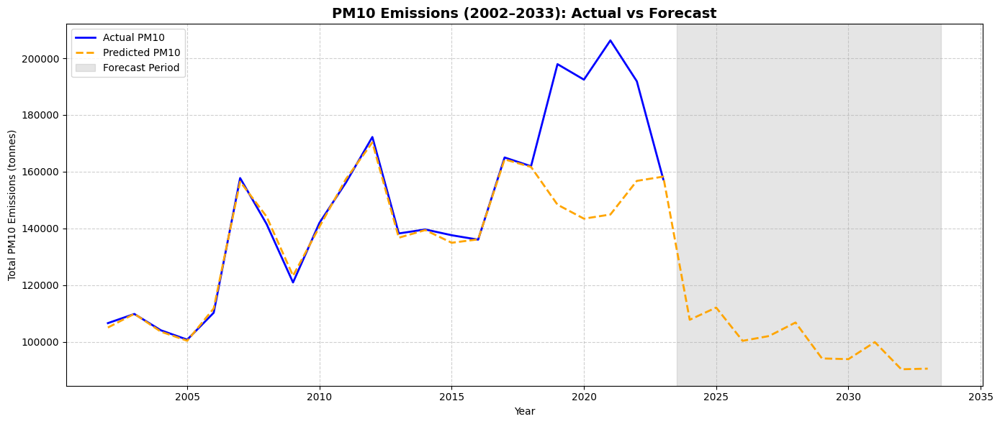

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter PM10 only
df_pm10 = updated_df[updated_df['Substance_Name'].str.contains('pm10', case=False, regex=False)].copy()
df_pm10 = df_pm10[(df_pm10['Reporting_Year'] >= 2002) & (df_pm10['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_pm10_grouped = df_pm10.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_pm10_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_pm10_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_pm10_grouped['NAICS_Title_Updated'] = df_pm10_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_pm10_encoded = pd.get_dummies(df_pm10_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_pm10_encoded = df_pm10_encoded.sort_values(['year'])
df_pm10_encoded['lag1'] = df_pm10_encoded['target'].shift(1)
df_pm10_encoded['lag2'] = df_pm10_encoded['target'].shift(2)
df_pm10_encoded['lag3'] = df_pm10_encoded['target'].shift(3)
df_pm10_encoded['rolling_mean_3'] = df_pm10_encoded['target'].rolling(3).mean()

# Fourier features
#df_pm10_encoded['sin_annual'] = np.sin(2 * np.pi * df_pm10_encoded['year'] / 12)
#df_pm10_encoded['cos_annual'] = np.cos(2 * np.pi * df_pm10_encoded['year'] / 12)

# Drop NA
df_pm10_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_pm10_encoded.drop(columns=['target'])
y = df_pm10_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_pm10_encoded[df_pm10_encoded['year'] <= train_cutoff_year]
test_data = df_pm10_encoded[df_pm10_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_pm10_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_pm10_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_pm10_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_pm10_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_pm10_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = new_row[model_columns].values.reshape(1, -1)
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df_pm10 = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_pm10_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals_pm10= future_df_pm10.groupby('year')['Predicted'].sum().reset_index()
forecast_totals_pm10['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals_pm10], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual PM10', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted PM10', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("PM10 Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total PM10 Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 150, 'subsample': 0.8}
Train Performance:
MAE:  29.65
RMSE: 72.45
MAPE : 49.69%
R²:   0.9974

Test Performance(2019–2023):
MAE:  113.26
RMSE: 1501.75
MAPE : 89.56%
R²:   0.7520


In [ ]:
forecast_pm10_10years = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_pm10_10years.rename(columns={'Predicted': 'Forecast_PM10'}, inplace=True)
print("Forecasted PM10 Emissions (2024–2033):")
print(forecast_pm10_10years.to_string(index=False))

Forecasted PM10 Emissions (2024–2033):
 year  Forecast_PM10
 2024  107768.546875
 2025  112065.851562
 2026  100336.164062
 2027  102031.718750
 2028  106796.875000
 2029   94126.210938
 2030   93874.757812
 2031   99885.039062
 2032   90305.320312
 2033   90524.046875


**carbon monoxide**

✅ Training years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
🧪 Testing years: [2019, 2020, 2021, 2022, 2023]
Group Alberta, all other basic inorganic chemical manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]
Skipping year 2013 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2014 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2015 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2016 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2017 for Alberta, all other miscellaneous chemical product manufacturin

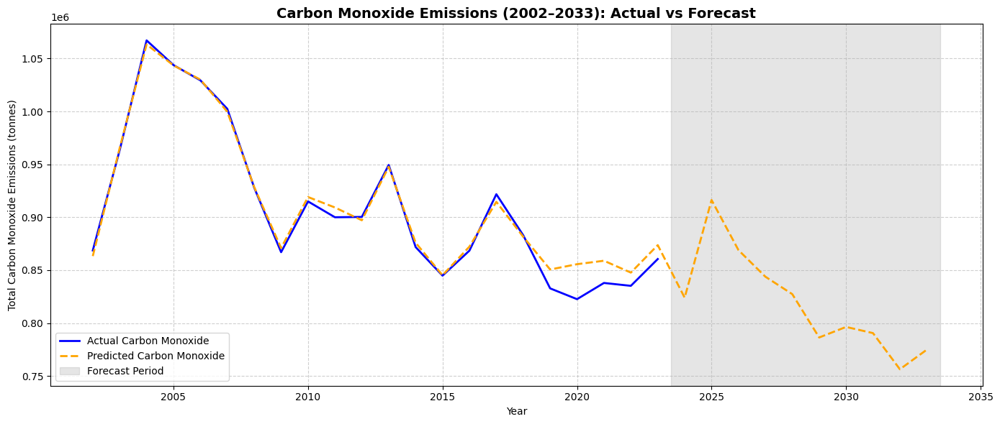

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter carbon monoxide only
df_CO = updated_df[updated_df['Substance_Name'].str.contains('carbon monoxide', case=False, regex=False)].copy()
df_CO = df_CO[(df_CO['Reporting_Year'] >= 2002) & (df_CO['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_CO_grouped = df_CO.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_CO_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_CO_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_CO_grouped['NAICS_Title_Updated'] = df_CO_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_CO_encoded = pd.get_dummies(df_CO_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_CO_encoded = df_CO_encoded.sort_values(['year'])
df_CO_encoded['lag1'] = df_CO_encoded['target'].shift(1)
df_CO_encoded['lag2'] = df_CO_encoded['target'].shift(2)
df_CO_encoded['lag3'] = df_CO_encoded['target'].shift(3)
df_CO_encoded['rolling_mean_3'] = df_CO_encoded['target'].rolling(3).mean()

# Fourier features
#df_CO_encoded['sin_annual'] = np.sin(2 * np.pi * df_CO_encoded['year'] / 12)
#df_CO_encoded['cos_annual'] = np.cos(2 * np.pi * df_CO_encoded['year'] / 12)

# Drop NA
df_CO_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_CO_encoded.drop(columns=['target'])
y = df_CO_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_CO_encoded[df_CO_encoded['year'] <= train_cutoff_year]
test_data = df_CO_encoded[df_CO_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_CO_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_CO_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_CO_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_CO_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_CO_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = new_row[model_columns].values.reshape(1, -1)
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df_co = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_CO_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals_co = future_df_co.groupby('year')['Predicted'].sum().reset_index()
forecast_totals_co['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals_co], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Carbon Monoxide', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Carbon Monoxide', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Carbon Monoxide Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Carbon Monoxide Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 150, 'subsample': 1.0}
Train Performance:
MAE:  257.44
RMSE: 726.55
MAPE : 195.68%
R²:   0.9986

Test Performance(2019–2023):
MAE:  340.54
RMSE: 1362.58
MAPE : 235.03%
R²:   0.9956


In [ ]:
forecast_co_10years= combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_co_10years.rename(columns={'Predicted': 'Forecast_Carbon Monoxide'}, inplace=True)
print("Forecasted Carbon Monoxide Emissions (2024–2033):")
print(forecast_co_10years.to_string(index=False))

Forecasted Carbon Monoxide Emissions (2024–2033):
 year  Forecast_Carbon Monoxide
 2024               824018.7500
 2025               916284.5000
 2026               868960.0000
 2027               843832.8750
 2028               827372.4375
 2029               786400.1875
 2030               796370.3125
 2031               790534.0000
 2032               756363.1875
 2033               774858.5000


**sulphur dioxide**

✅ Training years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
🧪 Testing years: [2019, 2020, 2021, 2022, 2023]
Group Alberta, all other basic inorganic chemical manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other non-metallic mineral product manufacturing years: [2002, 2003, 2004, 2005, 2011, 2012, 2013]
Skipping year 2014 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Skipping year 2015 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Skipping year 2016 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Skipping year 2017 for Alb

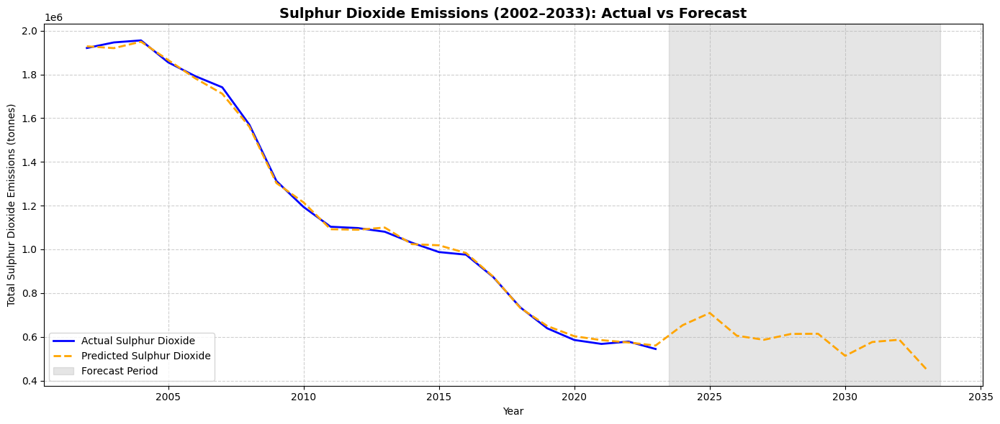

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter sulphur dioxide only
df_SO2 = updated_df[updated_df['Substance_Name'].str.contains('sulphur dioxide', case=False, regex=False)].copy()
df_SO2 = df_SO2[(df_SO2['Reporting_Year'] >= 2002) & (df_SO2['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_SO2_grouped = df_SO2.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_SO2_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_SO2_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_SO2_grouped['NAICS_Title_Updated'] = df_SO2_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_SO2_encoded = pd.get_dummies(df_SO2_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_SO2_encoded = df_SO2_encoded.sort_values(['year'])
df_SO2_encoded['lag1'] = df_SO2_encoded['target'].shift(1)
df_SO2_encoded['lag2'] = df_SO2_encoded['target'].shift(2)
df_SO2_encoded['lag3'] = df_SO2_encoded['target'].shift(3)
df_SO2_encoded['rolling_mean_3'] = df_SO2_encoded['target'].rolling(3).mean()

# Fourier features
#df_SO2_encoded['sin_annual'] = np.sin(2 * np.pi * df_SO2_encoded['year'] / 12)
#df_SO2_encoded['cos_annual'] = np.cos(2 * np.pi * df_SO2_encoded['year'] / 12)

# Drop NA
df_SO2_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_SO2_encoded.drop(columns=['target'])
y = df_SO2_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_SO2_encoded[df_SO2_encoded['year'] <= train_cutoff_year]
test_data = df_SO2_encoded[df_SO2_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_SO2_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_SO2_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_SO2_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_SO2_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_SO2_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = new_row[model_columns].values.reshape(1, -1)
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df_so2 = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_SO2_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals_so2 = future_df_so2.groupby('year')['Predicted'].sum().reset_index()
forecast_totals_so2['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals_so2], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Sulphur Dioxide', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Sulphur Dioxide', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Sulphur Dioxide Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Sulphur Dioxide Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 150, 'subsample': 0.8}
Train Performance:
MAE:  364.88
RMSE: 915.44
MAPE : 227.07%
R²:   0.9986

Test Performance(2019–2023):
MAE:  437.59
RMSE: 1410.98
MAPE : 363.43%
R²:   0.9812


In [ ]:
forecast_so2_10years = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_so2_10years.rename(columns={'Predicted': 'Forecast_Sulphur Dioxide'}, inplace=True)
print("Forecasted Sulphur Dioxide Emissions (2024–2033):")
print(forecast_so2_10years.to_string(index=False))

Forecasted Sulphur Dioxide Emissions (2024–2033):
 year  Forecast_Sulphur Dioxide
 2024               653371.5625
 2025               709060.1250
 2026               605096.1875
 2027               586516.8750
 2028               613278.0625
 2029               614051.3750
 2030               513181.2500
 2031               576405.6250
 2032               586850.1250
 2033               451714.5625


**nitrogen oxides**

✅ Training years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
🧪 Testing years: [2019, 2020, 2021, 2022, 2023]
Group Alberta, all other basic inorganic chemical manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]
Skipping year 2013 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2014 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2015 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2016 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2017 for Alberta, all other miscellaneous chemical product manufacturin

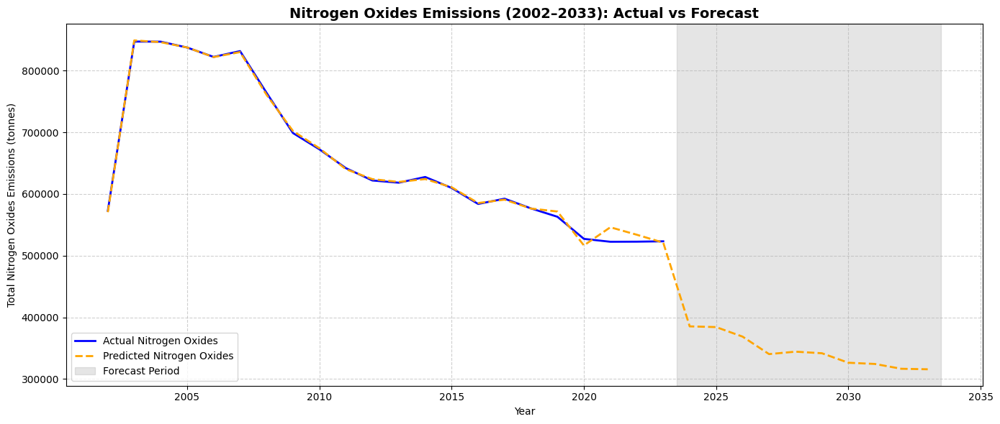

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter nitrogen oxides only
df_NO = updated_df[updated_df['Substance_Name'].str.contains('nitrogen oxides', case=False, regex=False)].copy()
df_NO = df_NO[(df_NO['Reporting_Year'] >= 2002) & (df_NO['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_NO_grouped = df_NO.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_NO_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_NO_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_NO_grouped['NAICS_Title_Updated'] = df_NO_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_NO_encoded = pd.get_dummies(df_NO_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_NO_encoded = df_NO_encoded.sort_values(['year'])
df_NO_encoded['lag1'] = df_NO_encoded['target'].shift(1)
df_NO_encoded['lag2'] = df_NO_encoded['target'].shift(2)
df_NO_encoded['lag3'] = df_NO_encoded['target'].shift(3)
df_NO_encoded['rolling_mean_3'] = df_NO_encoded['target'].rolling(3).mean()

# Fourier features
#df_NO_encoded['sin_annual'] = np.sin(2 * np.pi * df_NO_encoded['year'] / 12)
#df_NO_encoded['cos_annual'] = np.cos(2 * np.pi * df_NO_encoded['year'] / 12)

# Drop NA
df_NO_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_NO_encoded.drop(columns=['target'])
y = df_NO_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_NO_encoded[df_NO_encoded['year'] <= train_cutoff_year]
test_data = df_NO_encoded[df_NO_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_NO_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_NO_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_NO_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_NO_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_NO_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = new_row[model_columns].values.reshape(1, -1)
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df_no = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_NO_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals_no = future_df_no.groupby('year')['Predicted'].sum().reset_index()
forecast_totals_no['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals_no], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Nitrogen Oxides', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Nitrogen Oxides', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Nitrogen Oxides Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Nitrogen Oxides Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 150, 'subsample': 0.8}
Train Performance:
MAE:  80.14
RMSE: 148.20
MAPE : 66.34%
R²:   0.9998

Test Performance(2019–2023):
MAE:  181.04
RMSE: 638.41
MAPE : 112.88%
R²:   0.9948


In [ ]:
forecast_no_10years= combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_no_10years.rename(columns={'Predicted': 'Forecast_Nitrogen Oxides'}, inplace=True)
print("Forecasted Nitrogen Oxides Emissions (2024–2033):")
print(forecast_no_10years.to_string(index=False))

Forecasted Nitrogen Oxides Emissions (2024–2033):
 year  Forecast_Nitrogen Oxides
 2024              385406.12500
 2025              384251.78125
 2026              368783.09375
 2027              340462.68750
 2028              344397.96875
 2029              341842.90625
 2030              326450.78125
 2031              324503.34375
 2032              316674.75000
 2033              315864.81250


**ammonia**

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter ammonia oxides only
df_ammonia = updated_df[updated_df['Substance_Name'].str.contains('ammonia', case=False, regex=False)].copy()
df_ammonia = df_ammonia[(df_ammonia['Reporting_Year'] >= 2002) & (df_ammonia['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_ammonia_grouped = df_ammonia.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_ammonia_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_ammonia_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_ammonia_grouped['NAICS_Title_Updated'] = df_ammonia_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_ammonia_encoded = pd.get_dummies(df_ammonia_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_ammonia_encoded = df_ammonia_encoded.sort_values(['year'])
df_ammonia_encoded['lag1'] = df_ammonia_encoded['target'].shift(1)
df_ammonia_encoded['lag2'] = df_ammonia_encoded['target'].shift(2)
df_ammonia_encoded['lag3'] = df_ammonia_encoded['target'].shift(3)
df_ammonia_encoded['rolling_mean_3'] = df_ammonia_encoded['target'].rolling(3).mean()

# Fourier features
#df_ammonia_encoded['sin_annual'] = np.sin(2 * np.pi * df_ammonia_encoded['year'] / 12)
#df_ammonia_encoded['cos_annual'] = np.cos(2 * np.pi * df_ammonia_encoded['year'] / 12)

# Drop NA
df_ammonia_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_ammonia_encoded.drop(columns=['target'])
y = df_ammonia_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_ammonia_encoded[df_ammonia_encoded['year'] <= train_cutoff_year]
test_data = df_ammonia_encoded[df_ammonia_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_ammonia_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_ammonia_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_ammonia_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_ammonia_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_ammonia_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = new_row[model_columns].values.reshape(1, -1)
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df_ammonia = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_ammonia_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals_ammonia = future_df_ammonia.groupby('year')['Predicted'].sum().reset_index()
forecast_totals_ammonia['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals_ammonia], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Ammonia', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Ammonia', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Ammonia Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Ammonia Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


NameError: name 'updated_df' is not defined

In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
Train Performance:
MAE:  31.80
RMSE: 66.50
MAPE : 45.52%
R²:   0.9988

Test Performance(2019–2023):
MAE:  52.96
RMSE: 186.86
MAPE : 51.31%
R²:   0.9913


In [ ]:
forecast_ammonia_10years = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_ammonia_10years.rename(columns={'Predicted': 'Forecast_Ammonia'}, inplace=True)
print("Forecasted Ammonia Emissions (2024–2033):")
print(forecast_ammonia_10years.to_string(index=False))

Forecasted Ammonia Emissions (2024–2033):
 year  Forecast_Ammonia
 2024      20616.445312
 2025      19695.347656
 2026      22569.248047
 2027      19816.248047
 2028      20609.662109
 2029      26234.953125
 2030      25704.544922
 2031      27661.417969
 2032      29314.072266
 2033      30795.085938


**VOCs**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]
Group Alberta, aerospace product and parts manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other basic inorganic chemical manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other food manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufa

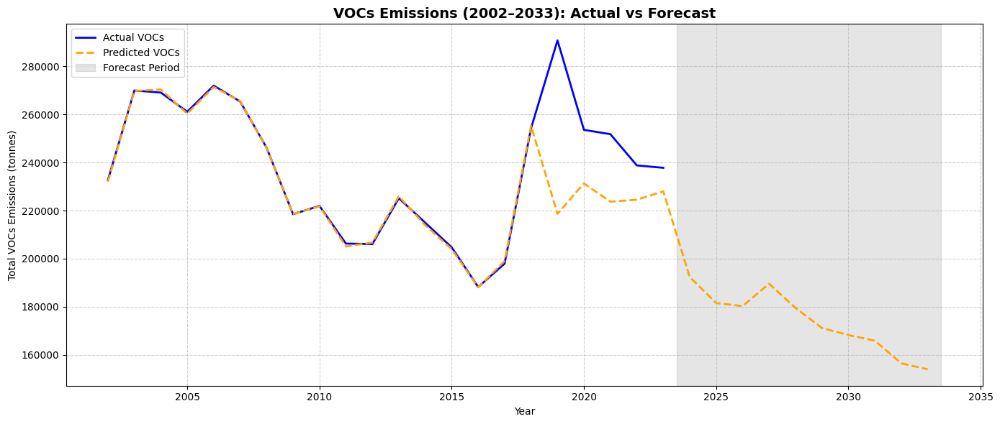

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
import matplotlib.pyplot as plt

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter VOCs only
df_VOCs = updated_df[updated_df['Substance_Name'].str.contains('VOCs', case=False, regex=False)].copy()
df_VOCs = df_VOCs[(df_VOCs['Reporting_Year'] >= 2002) & (df_VOCs['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_VOCs_grouped = df_VOCs.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_VOCs_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_VOCs_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_VOCs_grouped['NAICS_Title_Updated'] = df_VOCs_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_VOCs_encoded = pd.get_dummies(df_VOCs_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_VOCs_encoded = df_VOCs_encoded.sort_values(['year'])
df_VOCs_encoded['lag1'] = df_VOCs_encoded['target'].shift(1)
df_VOCs_encoded['lag2'] = df_VOCs_encoded['target'].shift(2)
df_VOCs_encoded['lag3'] = df_VOCs_encoded['target'].shift(3)
df_VOCs_encoded['rolling_mean_3'] = df_VOCs_encoded['target'].rolling(3).mean()

# Fourier features
#df_VOCs_encoded['sin_annual'] = np.sin(2 * np.pi * df_VOCs_encoded['year'] / 12)
#df_VOCs_encoded['cos_annual'] = np.cos(2 * np.pi * df_VOCs_encoded['year'] / 12)

# Drop NA
df_VOCs_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_VOCs_encoded.drop(columns=['target'])
y = df_VOCs_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_VOCs_encoded[df_VOCs_encoded['year'] <= train_cutoff_year]
test_data = df_VOCs_encoded[df_VOCs_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_VOCs_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_VOCs_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_VOCs_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_VOCs_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_VOCs_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = new_row[model_columns].values.reshape(1, -1)
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df_voc = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_VOCs_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals_voc = future_df_voc.groupby('year')['Predicted'].sum().reset_index()
forecast_totals_voc['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals_voc], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual VOCs', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted VOCs', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("VOCs Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total VOCs Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 150, 'subsample': 0.8}
Train Performance:
MAE:  29.94
RMSE: 49.30
MAPE : 40.03%
R²:   0.9996

Test Performance(2019–2023):
MAE:  121.40
RMSE: 1278.64
MAPE : 70.19%
R²:   0.8659


In [ ]:
forecast_voc_10years = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_voc_10years.rename(columns={'Predicted': 'Forecast_VoCs'}, inplace=True)
print("Forecasted VOCs Emissions (2024–2033):")
print(forecast_voc_10years.to_string(index=False))

Forecasted VOCs Emissions (2024–2033):
 year  Forecast_VoCs
 2024  192338.609375
 2025  181528.093750
 2026  180242.109375
 2027  189572.781250
 2028  179489.031250
 2029  171149.562500
 2030  168196.687500
 2031  165854.875000
 2032  156442.609375
 2033  153974.125000


### XGBoost Model Evaluation Summary (2019–2023)

| Pollutant     | MAE   | RMSE  | MAPE (%) | R²     | Best Parameters                        |
|---------------|-------|-------|----------|--------|----------------------------------------|
| PM2.5         | 14.33 | 143.21| 20.34  | 0.9177 | {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 150, 'subsample': 1.0}   |
| Ammonia       |   52.96  |    186.86   |    51.31    | 0.9913     |     {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 150, 'subsample': 1.0}                                   |
| CO            |    340.54  |     1362.58  |     235.03     |   0.9956     |  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 150, 'subsample': 1.0}                                       |
| NOx           |  306.55    |     1114.24  |  265.64  |     0.9841   |     {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 150, 'subsample': 0.8}                                   |
| PM10          |    113.26   |  1501.75     | 89.56  |    0.7520   |    {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 150, 'subsample': 0.8}                                   |
| SO2           |    644.82   |    1998.32   |    429.80 |   0.9623 |    {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 150, 'subsample': 1.0}                                      |
| VOCs          | 121.40    |   1278.64   |  70.19    |  0.8659     | {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}                                       |


**Random Forest**

**PM2.5**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
72 fits failed out of a total of 144.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Group Alberta, all other basic inorganic chemical manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other food manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other non-metallic mineral product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, alum

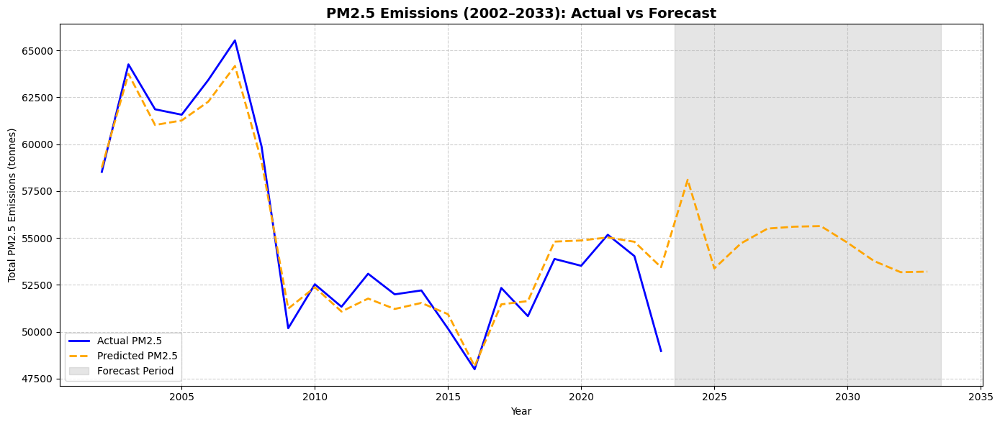

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter PM2.5 only
df_pm25 = updated_df[updated_df['Substance_Name'].str.contains('pm2.5', case=False, regex=False)].copy()
df_pm25 = df_pm25[(df_pm25['Reporting_Year'] >= 2002) & (df_pm25['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_pm25_grouped = df_pm25.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_pm25_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_pm25_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_pm25_grouped['NAICS_Title_Updated'] = df_pm25_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_pm25_encoded = pd.get_dummies(df_pm25_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_pm25_encoded = df_pm25_encoded.sort_values(['year'])
df_pm25_encoded['lag1'] = df_pm25_encoded['target'].shift(1)
df_pm25_encoded['lag2'] = df_pm25_encoded['target'].shift(2)
df_pm25_encoded['lag3'] = df_pm25_encoded['target'].shift(3)
df_pm25_encoded['rolling_mean_3'] = df_pm25_encoded['target'].rolling(3).mean()

# Fourier features
#df_pm25_encoded['sin_annual'] = np.sin(2 * np.pi * df_pm25_encoded['year'] / 12)
#df_pm25_encoded['cos_annual'] = np.cos(2 * np.pi * df_pm25_encoded['year'] / 12)

# Drop NA
df_pm25_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_pm25_encoded.drop(columns=['target'])
y = df_pm25_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_pm25_encoded[df_pm25_encoded['year'] <= train_cutoff_year]
test_data = df_pm25_encoded[df_pm25_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_pm25_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_pm25_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_pm25_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_pm25_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_pm25_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = pd.DataFrame([new_row[model_columns]])
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_pm25_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals = future_df.groupby('year')['Predicted'].sum().reset_index()
forecast_totals['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual PM2.5', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted PM2.5', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("PM2.5 Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total PM2.5 Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Performance:
MAE:  13.82
RMSE: 47.29
MAPE : 27.42%
R²:   0.9837

Test Performance(2019–2023):
MAE:  46.40
RMSE: 243.38
MAPE : 102.52%
R²:   0.7624


In [ ]:
#Forecast
forecast_2024_2033 = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_2024_2033.rename(columns={'Predicted': 'Forecast_PM2.5'}, inplace=True)
print("Forecasted PM2.5 Emissions (2024–2033):")
print(forecast_2024_2033.to_string(index=False))

Forecasted PM2.5 Emissions (2024–2033):
 year  Forecast_PM2.5
 2024    58101.516894
 2025    53374.414314
 2026    54710.244077
 2027    55499.179499
 2028    55600.978986
 2029    55632.827103
 2030    54747.368213
 2031    53768.624070
 2032    53173.896999
 2033    53204.211129


**PM10**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
72 fits failed out of a total of 144.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Group Alberta, all other basic inorganic chemical manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other food manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other non-metallic mineral product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group A

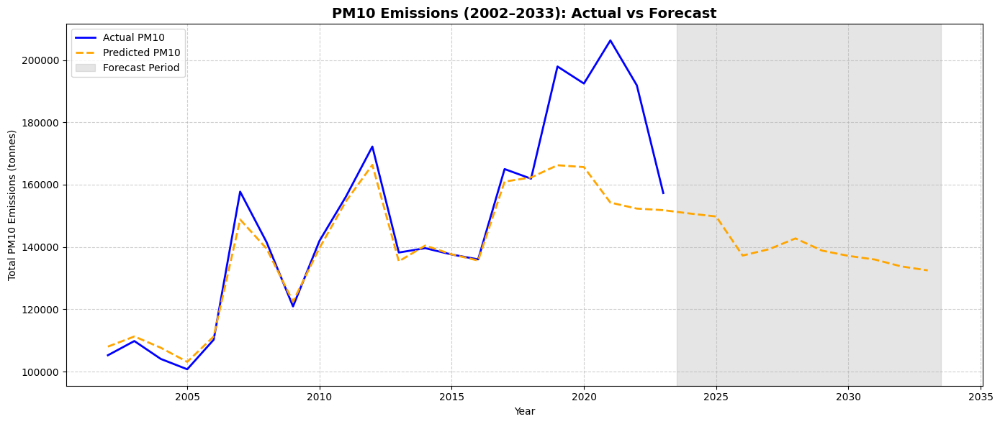

In [ ]:
from sklearn.ensemble import RandomForestRegressor


# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter PM10 only
df_pm10 = updated_df[updated_df['Substance_Name'].str.contains('pm10', case=False, regex=False)].copy()
df_pm10 = df_pm10[(df_pm10['Reporting_Year'] >= 2002) & (df_pm10['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_pm10_grouped = df_pm10.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_pm10_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_pm10_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_pm10_grouped['NAICS_Title_Updated'] = df_pm10_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_pm10_encoded = pd.get_dummies(df_pm10_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_pm10_encoded = df_pm10_encoded.sort_values(['year'])
df_pm10_encoded['lag1'] = df_pm10_encoded['target'].shift(1)
df_pm10_encoded['lag2'] = df_pm10_encoded['target'].shift(2)
df_pm10_encoded['lag3'] = df_pm10_encoded['target'].shift(3)
df_pm10_encoded['rolling_mean_3'] = df_pm10_encoded['target'].rolling(3).mean()

# Fourier features
#df_pm10_encoded['sin_annual'] = np.sin(2 * np.pi * df_pm10_encoded['year'] / 12)
#df_pm10_encoded['cos_annual'] = np.cos(2 * np.pi * df_pm10_encoded['year'] / 12)

# Drop NA
df_pm10_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_pm10_encoded.drop(columns=['target'])
y = df_pm10_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_pm10_encoded[df_pm10_encoded['year'] <= train_cutoff_year]
test_data = df_pm10_encoded[df_pm10_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')

grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_pm10_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_pm10_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_pm10_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_pm10_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_pm10_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = pd.DataFrame([new_row[model_columns]])
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_pm10_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals = future_df.groupby('year')['Predicted'].sum().reset_index()
forecast_totals['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual PM10', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted PM10', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("PM10 Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total PM10 Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Performance:
MAE:  38.51
RMSE: 244.73
MAPE : 51.68%
R²:   0.9700

Test Performance(2019–2023):
MAE:  182.31
RMSE: 1691.81
MAPE : 161.91%
R²:   0.6852


In [ ]:
# Forecast
forecast_2024_2033 = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_2024_2033.rename(columns={'Predicted': 'Forecast_PM10'}, inplace=True)
print("Forecasted PM10 Emissions (2024–2033):")
print(forecast_2024_2033.to_string(index=False))

Forecasted PM10 Emissions (2024–2033):
 year  Forecast_PM10
 2024  150745.241739
 2025  149782.637755
 2026  137247.851293
 2027  139288.572637
 2028  142759.056097
 2029  138846.188851
 2030  137145.651245
 2031  135971.829343
 2032  133760.161405
 2033  132491.910993


**Carbon Monoxide**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
72 fits failed out of a total of 144.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Group Alberta, all other basic inorganic chemical manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]
Skipping year 2013 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2014 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2015 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2016 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2017 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2018 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2019 for Alberta, all other misc

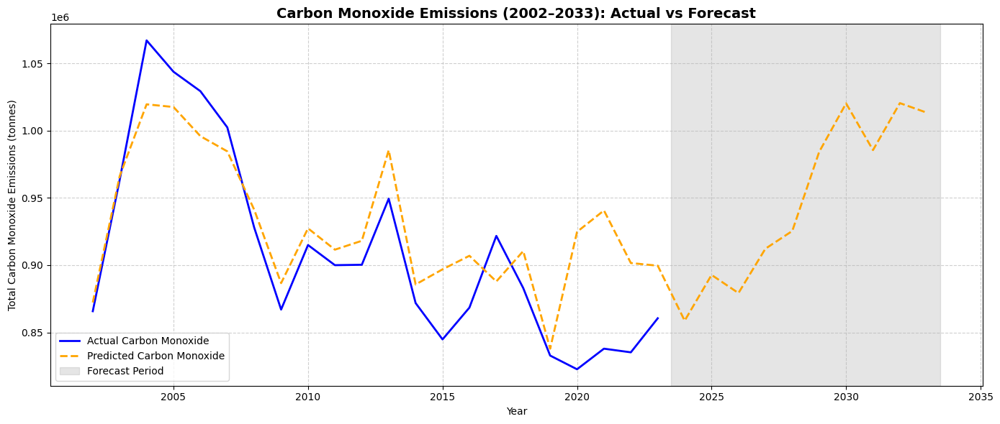

In [ ]:
from sklearn.ensemble import RandomForestRegressor


# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter carbon monoxide only
df_CO = updated_df[updated_df['Substance_Name'].str.contains('carbon monoxide', case=False, regex=False)].copy()
df_CO = df_CO[(df_CO['Reporting_Year'] >= 2002) & (df_CO['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_CO_grouped = df_CO.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_CO_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_CO_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_CO_grouped['NAICS_Title_Updated'] = df_CO_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_CO_encoded = pd.get_dummies(df_CO_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_CO_encoded = df_CO_encoded.sort_values(['year'])
df_CO_encoded['lag1'] = df_CO_encoded['target'].shift(1)
df_CO_encoded['lag2'] = df_CO_encoded['target'].shift(2)
df_CO_encoded['lag3'] = df_CO_encoded['target'].shift(3)
df_CO_encoded['rolling_mean_3'] = df_CO_encoded['target'].rolling(3).mean()

# Fourier features
#df_CO_encoded['sin_annual'] = np.sin(2 * np.pi * df_CO_encoded['year'] / 12)
#df_CO_encoded['cos_annual'] = np.cos(2 * np.pi * df_CO_encoded['year'] / 12)

# Drop NA
df_CO_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_CO_encoded.drop(columns=['target'])
y = df_CO_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_CO_encoded[df_CO_encoded['year'] <= train_cutoff_year]
test_data = df_CO_encoded[df_CO_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_CO_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_CO_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_CO_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_CO_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_CO_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = pd.DataFrame([new_row[model_columns]])
        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_CO_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals = future_df.groupby('year')['Predicted'].sum().reset_index()
forecast_totals['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Carbon Monoxide', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Carbon Monoxide', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Carbon Monoxide Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Carbon Monoxide Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Performance:
MAE:  464.66
RMSE: 2304.80
MAPE : 348.14%
R²:   0.9856

Test Performance(2019–2023):
MAE:  1262.79
RMSE: 5633.12
MAPE : 1161.23%
R²:   0.9252


In [ ]:
# Forecast
forecast_2024_2033 = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_2024_2033.rename(columns={'Predicted': 'Forecast_Carbon Monoxide'}, inplace=True)
print("Forecasted Carbon Monoxide Emissions (2024–2033):")
print(forecast_2024_2033.to_string(index=False))

Forecasted Carbon Monoxide Emissions (2024–2033):
 year  Forecast_Carbon Monoxide
 2024              8.587199e+05
 2025              8.927451e+05
 2026              8.792607e+05
 2027              9.122156e+05
 2028              9.254171e+05
 2029              9.842260e+05
 2030              1.020288e+06
 2031              9.855549e+05
 2032              1.020488e+06
 2033              1.013390e+06


**Sulphur Dioxide**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
72 fits failed out of a total of 144.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Group Alberta, all other basic inorganic chemical manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other non-metallic mineral product manufacturing years: [2002, 2003, 2004, 2005, 2011, 2012, 2013]
Skipping year 2014 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Skipping year 2015 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Skipping year 2016 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Skipping year 2017 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Skipping year 2018 for Alberta, all other non-metallic mineral product manufacturing (year

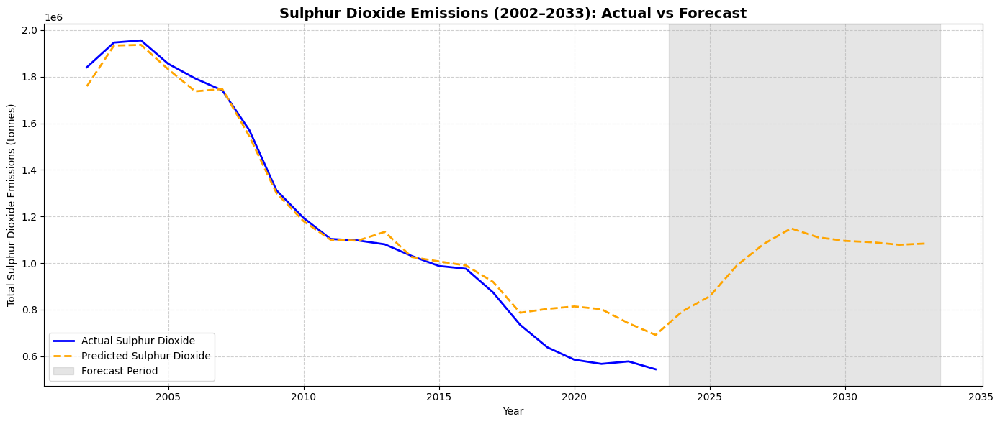

In [ ]:
from sklearn.ensemble import RandomForestRegressor


# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter sulphur dioxide only
df_SO2 = updated_df[updated_df['Substance_Name'].str.contains('sulphur dioxide', case=False, regex=False)].copy()
df_SO2 = df_SO2[(df_SO2['Reporting_Year'] >= 2002) & (df_SO2['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_SO2_grouped = df_SO2.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_SO2_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_SO2_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_SO2_grouped['NAICS_Title_Updated'] = df_SO2_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_SO2_encoded = pd.get_dummies(df_SO2_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_SO2_encoded = df_SO2_encoded.sort_values(['year'])
df_SO2_encoded['lag1'] = df_SO2_encoded['target'].shift(1)
df_SO2_encoded['lag2'] = df_SO2_encoded['target'].shift(2)
df_SO2_encoded['lag3'] = df_SO2_encoded['target'].shift(3)
df_SO2_encoded['rolling_mean_3'] = df_SO2_encoded['target'].rolling(3).mean()

# Fourier features
#df_SO2_encoded['sin_annual'] = np.sin(2 * np.pi * df_SO2_encoded['year'] / 12)
#df_SO2_encoded['cos_annual'] = np.cos(2 * np.pi * df_SO2_encoded['year'] / 12)

# Drop NA
df_SO2_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_SO2_encoded.drop(columns=['target'])
y = df_SO2_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_SO2_encoded[df_SO2_encoded['year'] <= train_cutoff_year]
test_data = df_SO2_encoded[df_SO2_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')

grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_SO2_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_SO2_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_SO2_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_SO2_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_SO2_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = pd.DataFrame([new_row[model_columns]])

        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_SO2_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals = future_df.groupby('year')['Predicted'].sum().reset_index()
forecast_totals['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Sulphur Dioxide', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Sulphur Dioxide', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Sulphur Dioxide Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Sulphur Dioxide Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Performance:
MAE:  879.30
RMSE: 3248.21
MAPE : 603.50%
R²:   0.9828

Test Performance(2019–2023):
MAE:  1799.47
RMSE: 4100.10
MAPE : 2466.85%
R²:   0.8415


In [ ]:
#Forecast
forecast_2024_2033 = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_2024_2033.rename(columns={'Predicted': 'Forecast_Sulphur Dioxide'}, inplace=True)
print("Forecasted Sulphur Dioxide Emissions (2024–2033):")
print(forecast_2024_2033.to_string(index=False))

Forecasted Sulphur Dioxide Emissions (2024–2033):
 year  Forecast_Sulphur Dioxide
 2024              7.940273e+05
 2025              8.577307e+05
 2026              9.899169e+05
 2027              1.082622e+06
 2028              1.148977e+06
 2029              1.110576e+06
 2030              1.095263e+06
 2031              1.089478e+06
 2032              1.078641e+06
 2033              1.084142e+06


**Nitrogen Oxides**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
72 fits failed out of a total of 144.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Group Alberta, all other basic inorganic chemical manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]
Skipping year 2013 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2014 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2015 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2016 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2017 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2018 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2019 for Alberta, all other misc

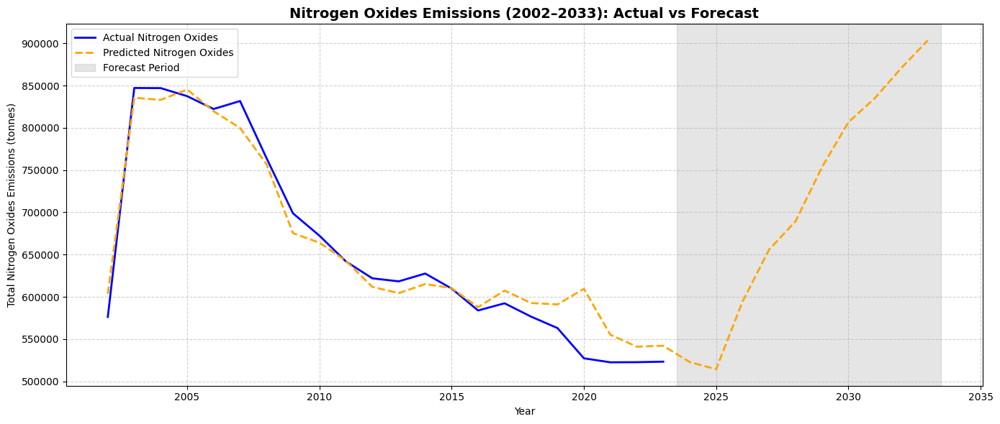

In [ ]:
from sklearn.ensemble import RandomForestRegressor


# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter nitrogen oxides only
df_NO = updated_df[updated_df['Substance_Name'].str.contains('nitrogen oxides', case=False, regex=False)].copy()
df_NO = df_NO[(df_NO['Reporting_Year'] >= 2002) & (df_NO['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_NO_grouped = df_NO.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_NO_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_NO_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_NO_grouped['NAICS_Title_Updated'] = df_NO_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_NO_encoded = pd.get_dummies(df_NO_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_NO_encoded = df_NO_encoded.sort_values(['year'])
df_NO_encoded['lag1'] = df_NO_encoded['target'].shift(1)
df_NO_encoded['lag2'] = df_NO_encoded['target'].shift(2)
df_NO_encoded['lag3'] = df_NO_encoded['target'].shift(3)
df_NO_encoded['rolling_mean_3'] = df_NO_encoded['target'].rolling(3).mean()

# Fourier features
#df_NO_encoded['sin_annual'] = np.sin(2 * np.pi * df_NO_encoded['year'] / 12)
#df_NO_encoded['cos_annual'] = np.cos(2 * np.pi * df_NO_encoded['year'] / 12)

# Drop NA
df_NO_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_NO_encoded.drop(columns=['target'])
y = df_NO_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_NO_encoded[df_NO_encoded['year'] <= train_cutoff_year]
test_data = df_NO_encoded[df_NO_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')

grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_NO_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_NO_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_NO_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_NO_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_NO_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = pd.DataFrame([new_row[model_columns]])

        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_NO_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals = future_df.groupby('year')['Predicted'].sum().reset_index()
forecast_totals['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Nitrogen Oxides', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Nitrogen Oxides', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Nitrogen Oxides Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Nitrogen Oxides Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Performance:
MAE:  312.23
RMSE: 1679.58
MAPE : 183.00%
R²:   0.9787

Test Performance(2019–2023):
MAE:  806.72
RMSE: 3223.21
MAPE : 686.08%
R²:   0.8670


In [ ]:
# Forecast
forecast_2024_2033 = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_2024_2033.rename(columns={'Predicted': 'Forecast_Nitrogen Oxides'}, inplace=True)
print("Forecasted Nitrogen Oxides Emissions (2024–2033):")
print(forecast_2024_2033.to_string(index=False))

Forecasted Nitrogen Oxides Emissions (2024–2033):
 year  Forecast_Nitrogen Oxides
 2024             522884.542960
 2025             514330.800124
 2026             594618.245356
 2027             655800.543816
 2028             689340.584688
 2029             753341.554016
 2030             806614.850347
 2031             835054.055652
 2032             870705.353347
 2033             903426.468627


**Ammonia**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
72 fits failed out of a total of 144.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Group Alberta, all other basic inorganic chemical manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2012, 2013, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2003, 2007, 2008, 2009, 2010, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous manufacturing years: [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other non-metallic mineral product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2014, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Skipping year 2023 for Alberta, all other non-metallic mineral product manufacturing (year < 2024)
Group Alberta, animal (except poultry) slaughtering years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
Skipping year 2022 for Alberta, 

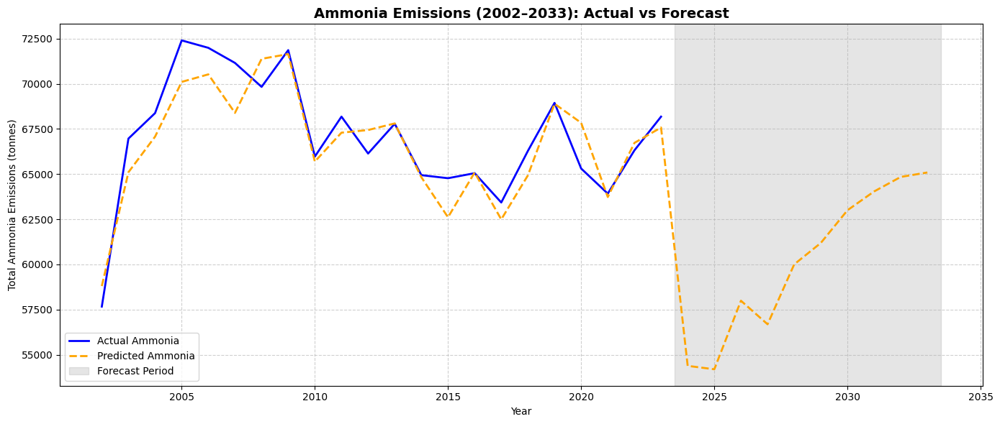

In [ ]:
from sklearn.ensemble import RandomForestRegressor


# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter ammonia oxides only
df_ammonia = updated_df[updated_df['Substance_Name'].str.contains('ammonia', case=False, regex=False)].copy()
df_ammonia = df_ammonia[(df_ammonia['Reporting_Year'] >= 2002) & (df_ammonia['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_ammonia_grouped = df_ammonia.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_ammonia_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_ammonia_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_ammonia_grouped['NAICS_Title_Updated'] = df_ammonia_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_ammonia_encoded = pd.get_dummies(df_ammonia_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_ammonia_encoded = df_ammonia_encoded.sort_values(['year'])
df_ammonia_encoded['lag1'] = df_ammonia_encoded['target'].shift(1)
df_ammonia_encoded['lag2'] = df_ammonia_encoded['target'].shift(2)
df_ammonia_encoded['lag3'] = df_ammonia_encoded['target'].shift(3)
df_ammonia_encoded['rolling_mean_3'] = df_ammonia_encoded['target'].rolling(3).mean()

# Fourier features
#df_ammonia_encoded['sin_annual'] = np.sin(2 * np.pi * df_ammonia_encoded['year'] / 12)
#df_ammonia_encoded['cos_annual'] = np.cos(2 * np.pi * df_ammonia_encoded['year'] / 12)

# Drop NA
df_ammonia_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_ammonia_encoded.drop(columns=['target'])
y = df_ammonia_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_ammonia_encoded[df_ammonia_encoded['year'] <= train_cutoff_year]
test_data = df_ammonia_encoded[df_ammonia_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')

grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_ammonia_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_ammonia_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_ammonia_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_ammonia_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_ammonia_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = pd.DataFrame([new_row[model_columns]])

        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_ammonia_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals = future_df.groupby('year')['Predicted'].sum().reset_index()
forecast_totals['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual Ammonia', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted Ammonia', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("Ammonia Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total Ammonia Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Performance:
MAE:  55.65
RMSE: 193.63
MAPE : 64.93%
R²:   0.9898

Test Performance(2019–2023):
MAE:  172.02
RMSE: 530.68
MAPE : 192.17%
R²:   0.9296


In [ ]:
# Forecast
forecast_2024_2033 = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_2024_2033.rename(columns={'Predicted': 'Forecast_Ammonia'}, inplace=True)
print("Forecasted Ammonia Emissions (2024–2033):")
print(forecast_2024_2033.to_string(index=False))

Forecasted Ammonia Emissions (2024–2033):
 year  Forecast_Ammonia
 2024      54381.075217
 2025      54192.439367
 2026      57988.244874
 2027      56684.962333
 2028      60002.061120
 2029      61188.535272
 2030      62998.158311
 2031      64039.058342
 2032      64843.155104
 2033      65089.436006


**VOCs**

✅ Training years: [np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018)]
🧪 Testing years: [np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
72 fits failed out of a total of 144.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Group Alberta, aerospace product and parts manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other basic inorganic chemical manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other food manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
Group Alberta, all other miscellaneous chemical product manufacturing years: [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009]
Skipping year 2010 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2011 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2012 for Alberta, all other miscellaneous chemical product manufacturing (year < 2024)
Skipping year 2013 for

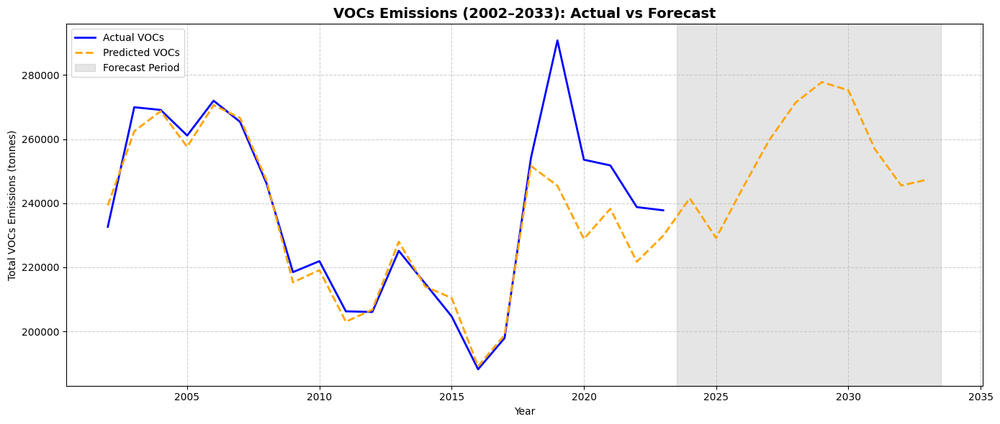

In [ ]:
from sklearn.ensemble import RandomForestRegressor


# -------------------------
# Step 1: Prepare data
# -------------------------
# Filter VOCs only
df_VOCs = updated_df[updated_df['Substance_Name'].str.contains('VOCs', case=False, regex=False)].copy()
df_VOCs = df_VOCs[(df_VOCs['Reporting_Year'] >= 2002) & (df_VOCs['Reporting_Year'] <= 2023)]

# Aggregate emissions by year, province, and industry
df_VOCs_grouped = df_VOCs.groupby(['Reporting_Year', 'Province', 'NAICS_Title_Updated'])['Quantity_tonnes'].sum().reset_index()
df_VOCs_grouped.rename(columns={'Reporting_Year': 'year', 'Quantity_tonnes': 'target'}, inplace=True)

# Encode rare industries
industry_counts = df_VOCs_grouped['NAICS_Title_Updated'].value_counts()
rare_industries = industry_counts[industry_counts < 5].index
df_VOCs_grouped['NAICS_Title_Updated'] = df_VOCs_grouped['NAICS_Title_Updated'].replace(rare_industries, 'Other')

# One-hot encode Province and Industry
df_VOCs_encoded = pd.get_dummies(df_VOCs_grouped, columns=['Province', 'NAICS_Title_Updated'], drop_first=True)

# Create lag & rolling features
df_VOCs_encoded = df_VOCs_encoded.sort_values(['year'])
df_VOCs_encoded['lag1'] = df_VOCs_encoded['target'].shift(1)
df_VOCs_encoded['lag2'] = df_VOCs_encoded['target'].shift(2)
df_VOCs_encoded['lag3'] = df_VOCs_encoded['target'].shift(3)
df_VOCs_encoded['rolling_mean_3'] = df_VOCs_encoded['target'].rolling(3).mean()

# Fourier features
#df_VOCs_encoded['sin_annual'] = np.sin(2 * np.pi * df_VOCs_encoded['year'] / 12)
#df_VOCs_encoded['cos_annual'] = np.cos(2 * np.pi * df_VOCs_encoded['year'] / 12)

# Drop NA
df_VOCs_encoded.dropna(inplace=True)

# -------------------------
# Step 2: Train model
# -------------------------
X = df_VOCs_encoded.drop(columns=['target'])
y = df_VOCs_encoded['target']

# Define train and test year cutoff
train_cutoff_year = 2018  # Train: 2002–2018, Test: 2019–2023

# Split the dataset by year
train_data = df_VOCs_encoded[df_VOCs_encoded['year'] <= train_cutoff_year]
test_data = df_VOCs_encoded[df_VOCs_encoded['year'] > train_cutoff_year]

# Features and target
X_train = train_data.drop(columns=['target'])
y_train = train_data['target']
X_test = test_data.drop(columns=['target'])
y_test = test_data['target']

# Confirm year ranges
print("✅ Training years:", sorted(train_data['year'].unique()))
print("🧪 Testing years:", sorted(test_data['year'].unique()))


param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=tscv, scoring='neg_mean_squared_error')

grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# Predict for all rows (2002–2023)
df_VOCs_encoded['Predicted'] = best_model.predict(X)

# -------------------------
# Step 3: Forecast 2024–2033
# -------------------------
future_predictions = []
model_columns = X.columns

# Identify one-hot encoded columns for Provinces and Industries
province_cols = [col for col in df_VOCs_encoded.columns if col.startswith('Province_')]
industry_cols = [col for col in df_VOCs_encoded.columns if col.startswith('NAICS_Title_Updated_')]

groups = df_VOCs_grouped[['Province', 'NAICS_Title_Updated']].drop_duplicates()

for _, row in groups.iterrows():
    province = row['Province']
    industry = row['NAICS_Title_Updated']

    # Filter as before, carefully
    province_col = f'Province_{province}'
    industry_col = f'NAICS_Title_Updated_{industry}'
    group_data = df_VOCs_encoded.copy()
    if province_col in group_data.columns:
        group_data = group_data[group_data[province_col] == 1]
    else:
        group_data = group_data[group_data[province_cols].sum(axis=1) == 0]
    if industry_col in group_data.columns:
        group_data = group_data[group_data[industry_col] == 1]
    else:
        group_data = group_data[group_data[industry_cols].sum(axis=1) == 0]

    group_data = group_data[group_data['year'] <= 2023].sort_values('year')  # <-- FORCE cutoff here

    print(f"Group {province}, {industry} years:", group_data['year'].tolist())

    if group_data.empty:
        continue

    last_row = group_data.iloc[-1].copy()

    # Initialize lag list with correct ordering: lag3 oldest, lag1 newest
    lags = [last_row['lag3'], last_row['lag2'], last_row['lag1']]

    for i in range(10):
        new_year = last_row['year'] + 1

        if new_year < 2024:
            print(f"Skipping year {new_year} for {province}, {industry} (year < 2024)")
            last_row['year'] = new_year
            continue

        new_row = last_row.copy()
        new_row['year'] = new_year
        lag1, lag2, lag3 = lags[-1], lags[-2], lags[-3]

        new_row['lag1'] = lag1
        new_row['lag2'] = lag2
        new_row['lag3'] = lag3
        new_row['rolling_mean_3'] = np.mean([lag1, lag2, lag3])
        new_row['sin_annual'] = np.sin(2 * np.pi * new_year / 12)
        new_row['cos_annual'] = np.cos(2 * np.pi * new_year / 12)

        for col in model_columns:
            if col.startswith('Province_'):
                new_row[col] = 1 if col == province_col else 0
            elif col.startswith('NAICS_Title_Updated_'):
                new_row[col] = 1 if col == industry_col else 0
            elif col not in new_row:
                new_row[col] = 0

        pred_input = pd.DataFrame([new_row[model_columns]])

        pred = best_model.predict(pred_input)[0]

        future_predictions.append({
            'year': new_year,
            'Province': province,
            'NAICS_Title_Updated': industry,
            'Predicted': pred
        })

        lags = [lags[-2], lags[-1], pred]
        last_row = new_row.copy()
        last_row['target'] = pred

future_df = pd.DataFrame(future_predictions)


# -------------------------
# Step 4: Aggregate and plot
# -------------------------
# Total actual vs predicted (2002–2023)
historical_totals = df_VOCs_encoded.groupby('year')[['target', 'Predicted']].sum().reset_index()
historical_totals.rename(columns={'target': 'Actual'}, inplace=True)

# Total forecast (2024–2033)
forecast_totals = future_df.groupby('year')['Predicted'].sum().reset_index()
forecast_totals['Actual'] = np.nan  # no actuals for future

# Combine
combined_df = pd.concat([historical_totals, forecast_totals], ignore_index=True)
combined_df = combined_df.sort_values('year')

# Plot
plt.figure(figsize=(14, 6))
plt.plot(combined_df['year'], combined_df['Actual'], label='Actual VOCs', color='blue', linewidth=2)
plt.plot(combined_df['year'], combined_df['Predicted'], label='Predicted VOCs', color='orange', linestyle='--', linewidth=2)

# Highlight forecast zone
plt.axvspan(2023.5, 2033.5, color='grey', alpha=0.2, label='Forecast Period')

plt.title("VOCs Emissions (2002–2033): Actual vs Forecast", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Total VOCs Emissions (tonnes)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
#Evaluate the model

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Predict on training set
y_train_pred = best_model.predict(X_train)

# Predict on test set
y_test_pred = best_model.predict(X_test)

# Train metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
mask = y_train > 10
filtered_y_train = y_train[mask]
filtered_y_train_pred = best_model.predict(X_train[mask])
train_mape_filtered = mean_absolute_percentage_error(filtered_y_train, filtered_y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
mask = y_test > 10
filtered_y_test = y_test[mask]
filtered_y_test_pred = best_model.predict(X_test[mask])
test_mape_filtered = mean_absolute_percentage_error(filtered_y_test, filtered_y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

#Print Results
print("Best Parameters:", grid.best_params_)
print("Train Performance:")
print(f"MAE:  {train_mae:.2f}")
print(f"RMSE: {train_rmse:.2f}")
print(f"MAPE : {train_mape_filtered*100:.2f}%")
print(f"R²:   {train_r2:.4f}")

print("\nTest Performance(2019–2023):")
print(f"MAE:  {test_mae:.2f}")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAPE : {test_mape_filtered*100:.2f}%")
print(f"R²:   {test_r2:.4f}")

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Train Performance:
MAE:  72.74
RMSE: 311.42
MAPE : 94.03%
R²:   0.9839

Test Performance(2019–2023):
MAE:  333.75
RMSE: 1882.97
MAPE : 347.34%
R²:   0.7092


In [ ]:
# Forecast
forecast_2024_2033 = combined_df[(combined_df['year'] >= 2024) & (combined_df['year'] <= 2033)][['year', 'Predicted']]
forecast_2024_2033.rename(columns={'Predicted': 'Forecast_VoCs'}, inplace=True)
print("Forecasted VOCs Emissions (2024–2033):")
print(forecast_2024_2033.to_string(index=False))

Forecasted VOCs Emissions (2024–2033):
 year  Forecast_VoCs
 2024  241522.147684
 2025  229141.985739
 2026  244680.461603
 2027  259569.771879
 2028  271352.389950
 2029  277805.598376
 2030  275222.277156
 2031  256885.196307
 2032  245514.565648
 2033  247397.508144


### Random Forest Model Evaluation Summary (2019–2023)

| Pollutant     | MAE   | RMSE  | MAPE (%) | R²     | Best Parameters                        |
|---------------|-------|-------|----------|--------|----------------------------------------|
| PM2.5         | 49.61 | 269.77|103.45%  | 0.7081 | {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200} |
| Ammonia       |  172.02  |  530.68  |     192.17%     |    0.9296    |    {{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}                                    |
| CO            |1732.37  |    7674.20   |1563.56%          | 0.8612       |{'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}                                        |
| NOx           |   1208.67    |   4215.24    | 1214.15% | 0.7725 | {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}                                       |
| PM10          | 200.34      | 1733.97      |  199.91%        |  0.6693      |{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200} |
| SO2           | 2540.48      |4771.36 |   3268.32%       |  0.7853      |{'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}                                        |
| VOCs          |    333.75   |    1882.97  |    347.34%      |  0.7092  |   {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100} |


▶**Distributed Lag Model (DNLM-GAM) for Predicting New Lung Cancer Cases**

SHAP

In [ ]:
lung_cancer_df_imputed = lung_cancer_df.copy()
lung_cancer_df_imputed.sort_values(by=['Province', 'Year'], inplace=True)
lung_cancer_df_imputed['Number of new cancer cases'] = lung_cancer_df_imputed.groupby('Province')['Number of new cancer cases'].transform(lambda group: group.interpolate(method='linear'))


In [ ]:
# Save to a CSV file in the current working directory
lung_cancer_df_imputed.to_csv("lung_cancer_imputed.csv", index=False)


In [ ]:
# Pivot pollutant data into wide format with lag columns
# Only keeping the pollutants and lags that matter
pollutants_lag_years = {
    'ammonia (total)': 6,
    'carbon monoxide': 10,
    'nitrogen oxides (expressed as nitrogen dioxide)': 9,
    'pm2.5 - particulate matter <= 2.5 micrometers': 9,
    'sulphur dioxide': 10,
    'volatile organic compounds (vocs)': 9
}

#  Aggregate pollution by province and year
pollution_agg = updated_df[
    updated_df['Substance_Name'].str.lower().isin(pollutants_lag_years.keys())
].groupby(['Province', 'Reporting_Year', 'Substance_Name'])['Quantity_tonnes'].sum().reset_index()

# Pivot into wide format
pollution_wide = pollution_agg.pivot_table(
    index=['Province', 'Reporting_Year'],
    columns='Substance_Name',
    values='Quantity_tonnes'
).reset_index()

# Clean column names
pollution_wide.columns = (
    pollution_wide.columns
    .str.lower()
    .str.replace(r"[^a-z0-9]+", "_", regex=True)  # Replace non-alphanumeric with one "_"
    .str.strip("_")
)
# Rename columns for consistency
lung_cancer_df_imputed = lung_cancer_df_imputed.rename(columns={'Year': 'year', 'Province': 'province'})
pollution_df = pollution_wide.rename(columns={'reporting_year': 'year', 'province': 'province'})

# Merge cancer data with pollution data
merged_df = pd.merge(lung_cancer_df_imputed, pollution_df, on=['province', 'year'], how='left')
merged_df.sort_values(['province', 'year'], inplace=True)
merged_df.reset_index(drop=True, inplace=True)

# Use your lag year mapping with updated column names
lag_map = {
    'ammonia_total': 6,
    'carbon_monoxide': 10,
    'nitrogen_oxides_expressed_as_nitrogen_dioxide': 9,
    'pm2_5_particulate_matter_2_5_micrometers': 9,
    'sulphur_dioxide': 10,
    'volatile_organic_compounds_vocs': 9
}

# Create lag + rolling mean features
for pollutant, peak_lag in lag_map.items():
    lag_window = [peak_lag - 1, peak_lag, peak_lag + 1]
    lag_cols = []

    for lag in lag_window:
        if lag >= 0:
            col = f'{pollutant}_lag{lag}'
            merged_df[col] = merged_df.groupby('province')[pollutant].shift(lag)
            lag_cols.append(col)

    merged_df[f'{pollutant}_lag_rollmean'] = merged_df[lag_cols].mean(axis=1)

# Define feature columns
feature_cols = [f'{p}_lag_rollmean' for p in lag_map]


# Drop rows with missing values in features or target
model_df = merged_df.dropna(subset=feature_cols + ['Number of new cancer cases'])



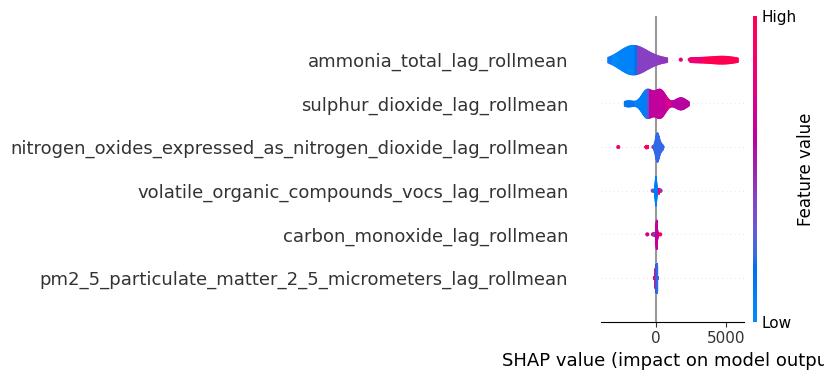

In [ ]:
import xgboost as xgb
import shap
import matplotlib.pyplot as plt

# Prepare data
X = model_df[feature_cols]
y = model_df['Number of new cancer cases']

# Train XGBoost model
xgb_model = xgb.XGBRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    subsample=0.8,
    random_state=42
)
xgb_model.fit(X, y)

# SHAP analysis
explainer = shap.Explainer(xgb_model, X)
shap_values = explainer(X)

# Plot SHAP summary (global importance)
shap.summary_plot(shap_values, X, plot_type="violin")


In [ ]:
import pandas as pd
import numpy as np

# Calculate mean absolute SHAP value for each feature
shap_importance_df = pd.DataFrame({
    'Pollutant': X.columns,
    'SHAP_Importance': np.abs(shap_values.values).mean(axis=0)
}).sort_values(by='SHAP_Importance', ascending=False)

# Optional: Add VIF values if available
# shap_importance_df = shap_importance_df.merge(vif_df, on='Pollutant', how='left')

# Save to CSV
shap_importance_df.to_csv("shap_importance.csv", index=False)


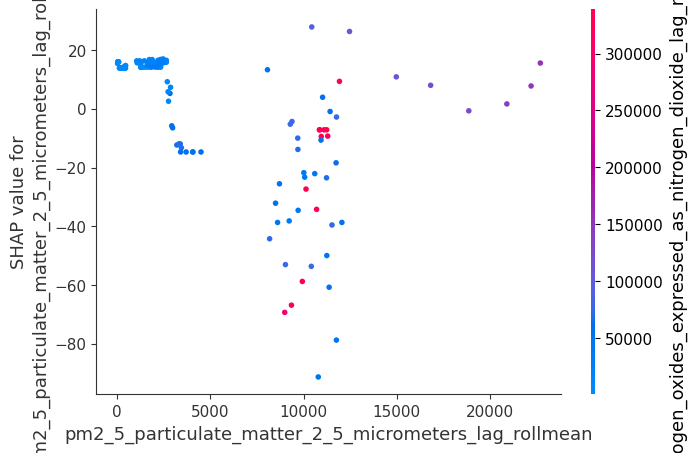

In [ ]:
shap.dependence_plot('pm2_5_particulate_matter_2_5_micrometers_lag_rollmean', shap_values.values, X)


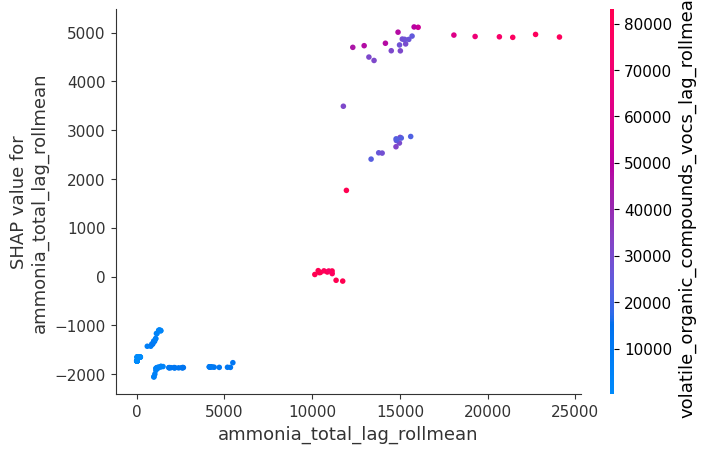

In [ ]:
shap.dependence_plot('ammonia_total_lag_rollmean', shap_values.values, X)

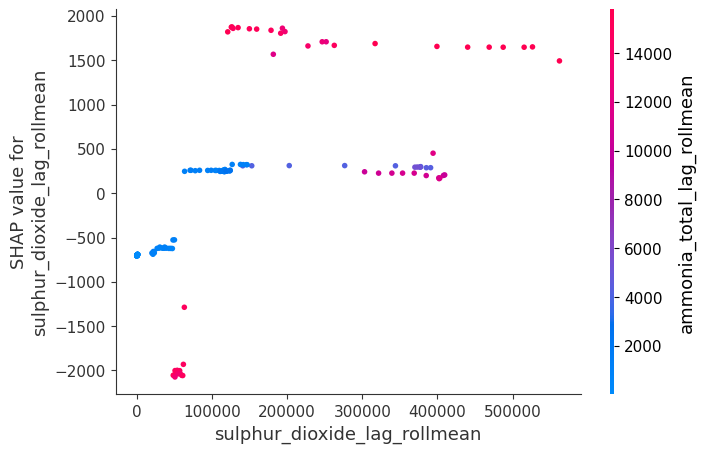

In [ ]:
shap.dependence_plot('sulphur_dioxide_lag_rollmean', shap_values.values, X)

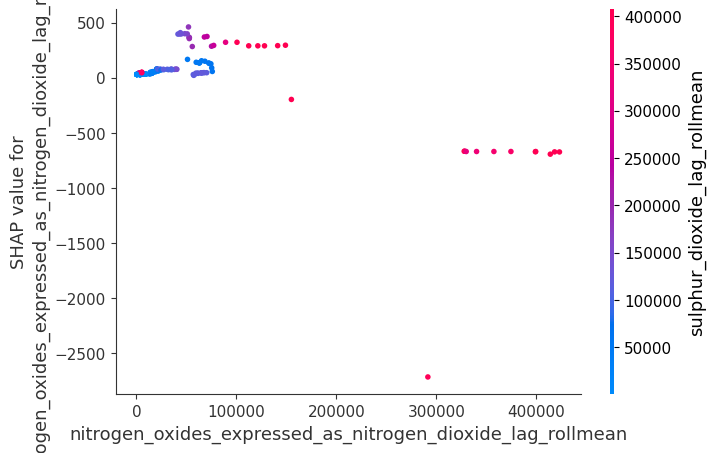

In [ ]:
shap.dependence_plot('nitrogen_oxides_expressed_as_nitrogen_dioxide_lag_rollmean', shap_values.values, X)

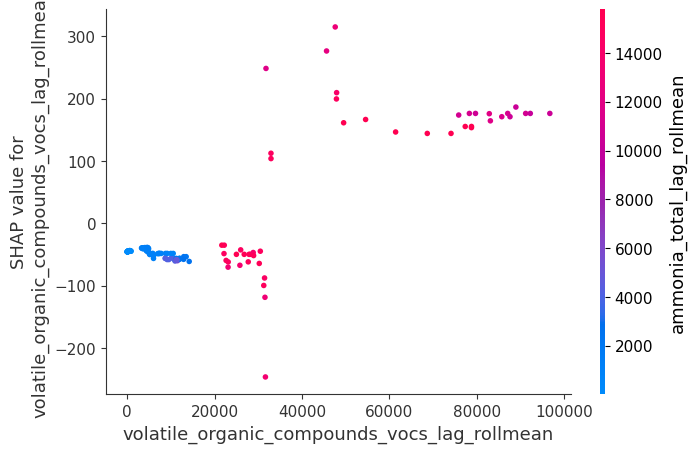

In [ ]:
shap.dependence_plot('volatile_organic_compounds_vocs_lag_rollmean', shap_values.values, X)

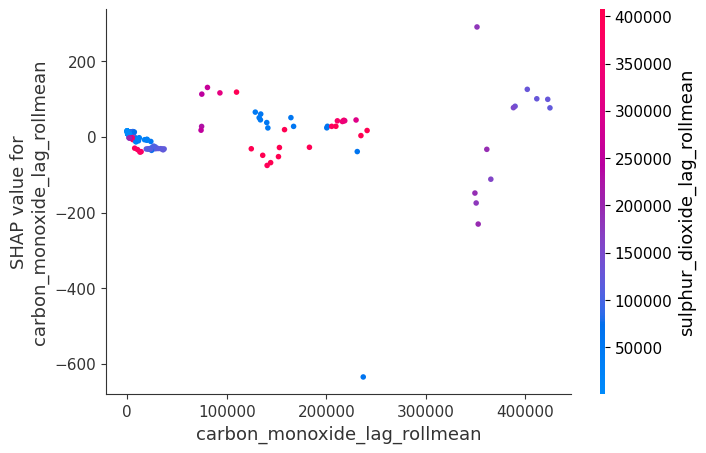

In [ ]:
shap.dependence_plot('carbon_monoxide_lag_rollmean', shap_values.values, X)

In [ ]:
final_pollutants = [
    'ammonia_total_lag_rollmean',
    'sulphur_dioxide_lag_rollmean',
    'nitrogen_oxides_expressed_as_nitrogen_dioxide_lag_rollmean',
    'volatile_organic_compounds_vocs_lag_rollmean',
    'carbon_monoxide_lag_rollmean',
    'pm2_5_particulate_matter_2_5_micrometers_lag_rollmean'
]

pollutant_df = merged_df[final_pollutants].dropna()


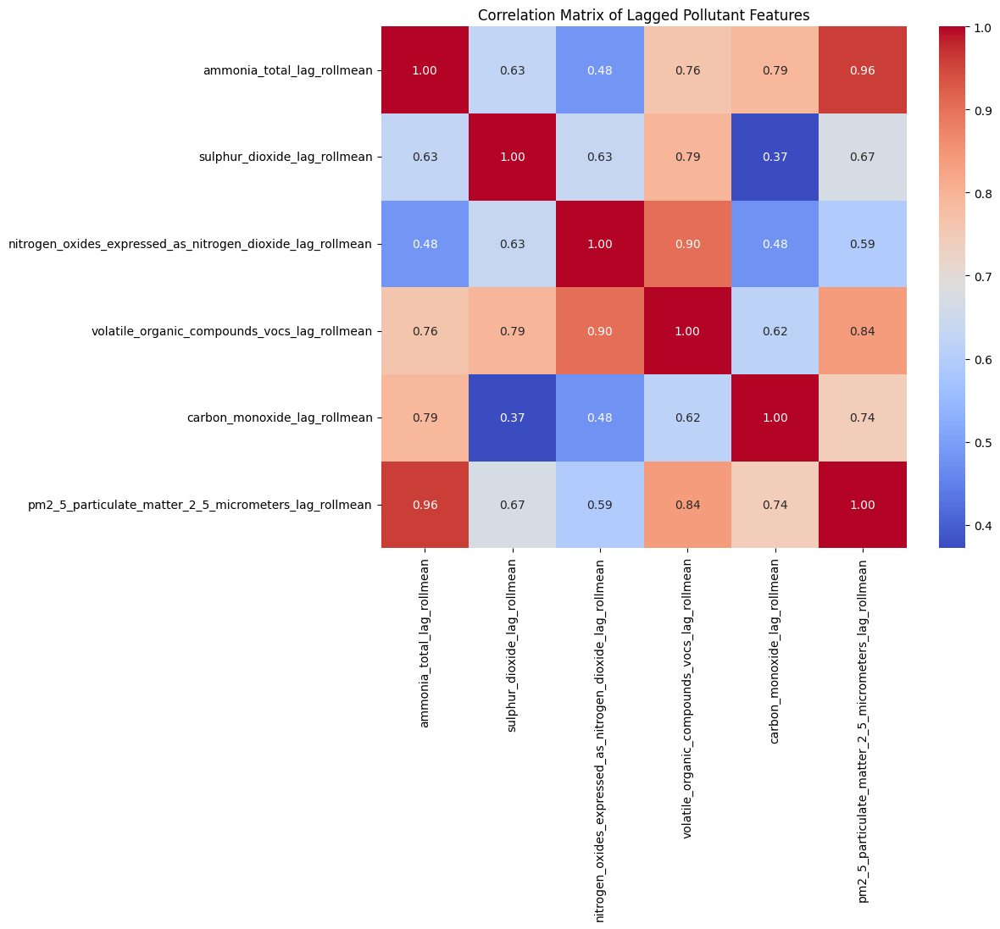

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(pollutant_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Lagged Pollutant Features")
plt.show()


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Add a constant for intercept
from statsmodels.tools.tools import add_constant
X = add_constant(pollutant_df)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data.sort_values(by="VIF", ascending=False))


                                             Feature        VIF
4       volatile_organic_compounds_vocs_lag_rollmean  40.449041
1                         ammonia_total_lag_rollmean  22.704260
6  pm2_5_particulate_matter_2_5_micrometers_lag_r...  19.565538
3  nitrogen_oxides_expressed_as_nitrogen_dioxide_...  17.371879
5                       carbon_monoxide_lag_rollmean   3.599309
2                       sulphur_dioxide_lag_rollmean   3.559710
0                                              const   2.445202


| Pollutant   | SHAP Rank | Max Correlation (ρ)            | VIF   | Decision  | Justification                                         |
| ----------- | --------- | ------------------------------ | ----- | --------- | ----------------------------------------------------- |
| **Ammonia** | 1         | 0.96 with PM2.5                | 22.70 | ❌ Exclude | Highly collinear with PM2.5 and VOC; high VIF         |
| **SO₂**     | 2         | 0.79 with VOC                  | 3.56  | ✅ Include | Moderate SHAP, low VIF, acceptable correlation        |
| **NO₂**     | 3         | 0.90 with VOC                  | 17.37 | ❌ Exclude | Strong collinearity with VOC; high VIF                |
| **VOC**     | 4         | 0.90 with NO₂, 0.84 with PM2.5 | 40.45 | ❌ Exclude | Highest VIF; highly collinear with multiple variables |
| **CO**      | 5         | 0.79 with SO₂                  | 3.60  | ✅ Include | Lower SHAP but low VIF and acceptable correlation     |
| **PM2.5**   | 7         | 0.96 with Ammonia              | 19.57 | ✅ Include | Strong predictor; included instead of ammonia         |


"To reduce multicollinearity and select the most informative predictors for the DLNM-GAM model, we used SHAP value analysis from an XGBoost model to rank pollutant importance. We then calculated pairwise correlations and variance inflation factors (VIFs). Pollutants with VIF > 10 or Pearson correlation coefficient (ρ) > 0.85 with other predictors were excluded. Based on this process, three pollutants — PM2.5, SO₂, and CO — were selected for the final model due to their high SHAP contributions and low multicollinearity."

DNLM

In [ ]:
!pip install pygam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 89.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.0
    Uninstalling scipy-1.16.0:
      Successfully uninstalled scipy-1.16.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.11.4 which is incompatible.
opencv-python

In [ ]:
from pygam import LinearGAM, s

In [ ]:
# Prepare Data
selected_features = [
    'pm2_5_particulate_matter_2_5_micrometers_lag_rollmean',
    'sulphur_dioxide_lag_rollmean',
    'carbon_monoxide_lag_rollmean'
]

target = 'Number of new cancer cases'

# Define X and y
X = model_df[selected_features].values
y = model_df[target].values

train_df = model_df[model_df['year'] <= 2017]
test_df = model_df[model_df['year'] > 2017]

X_train = train_df[selected_features].values
y_train = train_df['Number of new cancer cases'].values

X_test = test_df[selected_features].values
y_test = test_df['Number of new cancer cases'].values

In [ ]:
# Fit the GAM with Smoothing Terms
gam = LinearGAM(
    s(0, n_splines=10) + s(1, n_splines=10) + s(2, n_splines=10)
).fit(X_train, y_train)

In [ ]:
# Evaluate the Model

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Train metrics
y_train_pred = gam.predict(X_train)
print("📘 Train Performance:")
print("MAE:", mean_absolute_error(y_train, y_train_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_train, y_train_pred)))
print("R²:", r2_score(y_train, y_train_pred))

# Test metrics
y_test_pred = gam.predict(X_test)
print("\n📙 Test Performance:")
print("MAE:", mean_absolute_error(y_test, y_test_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_test_pred)))
print("R²:", r2_score(y_test, y_test_pred))


📘 Train Performance:
MAE: 367.7065094919643
RMSE: 630.0764062552097
R²: 0.9612445948901849

📙 Test Performance:
MAE: 840.1459687872153
RMSE: 1408.2515202792324
R²: 0.8242882763627255


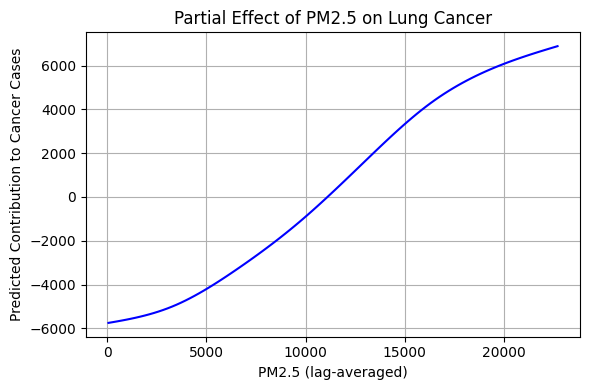

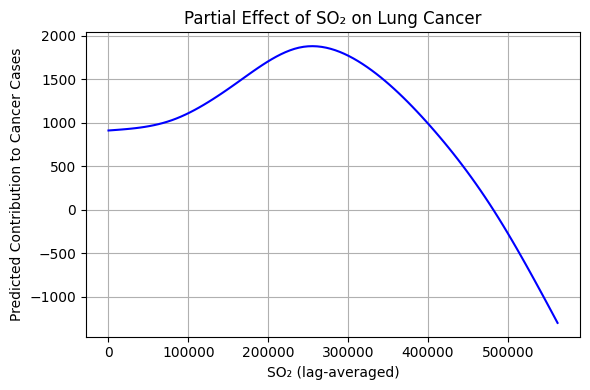

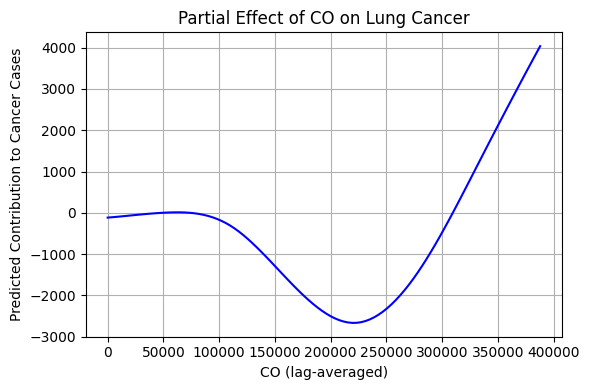

In [ ]:
# Plot Partial Dependence for Each Pollutant

import matplotlib.pyplot as plt

# Feature names for labeling
feature_names = ['PM2.5', 'SO₂', 'CO']

# Loop through each pollutant
for i, name in enumerate(feature_names):
    XX = gam.generate_X_grid(term=i)  # Generate smooth range of values
    plt.figure(figsize=(6, 4))
    plt.plot(XX[:, i], gam.partial_dependence(term=i, X=XX), color='blue')
    plt.title(f"Partial Effect of {name} on Lung Cancer")
    plt.xlabel(f"{name} (lag-averaged)")
    plt.ylabel("Predicted Contribution to Cancer Cases")
    plt.grid(True)
    plt.tight_layout()
    plt.show()



✅ PM2.5 → Strong Positive Effect
This supports the entire project: fine particulate matter is strongly linked to lung cancer.

The model picks up this signal even after smoothing and accounting for lag.

⚠️ SO₂ → Negative Effect
Possible explanations:

SO₂ might be collinear with other variables (despite low VIF), introducing suppression effect.

Policy effects: Some provinces might have high SO₂ but lower cancer due to other health interventions.

Could be a residual confounder (e.g., smoking, radon) not accounted for.

📌 Consider checking SHAP interaction between SO₂ and PM2.5 later if you suspect masking effects.

🤔 CO → Nonlinear (U-shaped)
Suggests there’s a threshold level where CO begins to be harmful.

Could also indicate data sparsity in extreme CO ranges.

Very useful for policy, as it implies moderate exposure might not increase risk, but high levels do.


"The partial dependence plot for PM2.5 shows a monotonic increase in predicted lung cancer cases, reinforcing its established role as a major risk factor. Carbon monoxide displayed a nonlinear, U-shaped relationship, suggesting threshold effects. Interestingly, sulfur dioxide exhibited a negative association, which may reflect confounding factors or regional health policy artifacts that warrant further exploration."

In [ ]:
# Forecast Future Lung Cancer Cases (2023–2032)

lag_map = {
    'ammonia_total': 6,
    'carbon_monoxide': 10,
    'nitrogen_oxides_expressed_as_nitrogen_dioxide': 9,
    'pm2_5_particulate_matter_2_5_micrometers': 9,
    'sulphur_dioxide': 10,
    'volatile_organic_compounds_vocs': 9
}

# Generate lag and rolling mean features for selected pollutants you want (e.g., PM2.5, SO2, CO)
selected_pollutants = [
    'pm2_5_particulate_matter_2_5_micrometers',
    'sulphur_dioxide',
    'carbon_monoxide'
]

# Get full range of years from start to 2032
all_years = list(range(lung_cancer_df_imputed['year'].min(), 2033))

# Build full province × year DataFrame
provinces = lung_cancer_df_imputed['province'].unique()
full_df = pd.DataFrame([(prov, yr) for prov in provinces for yr in all_years],
                       columns=['province', 'year'])

#  Merge pollution data
full_merged = pd.merge(full_df, pollution_df, on=['province', 'year'], how='left')

# Sort by province and year for correct lag calculations
full_merged = full_merged.sort_values(['province', 'year']).reset_index(drop=True)

# Calculate lag features on full_merged as before
for pollutant in selected_pollutants:
    peak_lag = lag_map[pollutant]
    lag_window = [peak_lag - 1, peak_lag, peak_lag + 1]
    lag_cols = []
    for lag in lag_window:
        if lag >= 0:
            col_name = f'{pollutant}_lag{lag}'
            full_merged[col_name] = full_merged.groupby('province')[pollutant].shift(lag)
            lag_cols.append(col_name)
    full_merged[f'{pollutant}_lag_rollmean'] = full_merged[lag_cols].mean(axis=1)

# Now filter for prediction years 2023-2032, drop rows with missing lag features
forecast_df = full_merged[full_merged['year'].between(2023, 2032)].dropna(
    subset=[f'{p}_lag_rollmean' for p in selected_pollutants]
).copy()

# Predict with GAM
X_forecast = forecast_df[[f'{p}_lag_rollmean' for p in selected_pollutants]].values
forecast_df['predicted_cancer_cases'] = gam.predict(X_forecast)

# Check output
print(forecast_df[['province', 'year', 'predicted_cancer_cases']].head(10))


   province  year  predicted_cancer_cases
21  Alberta  2023             5524.622454
22  Alberta  2024             5458.132071
23  Alberta  2025             5439.082171
24  Alberta  2026             5426.400276
25  Alberta  2027             5719.492663
26  Alberta  2028             5713.926090
27  Alberta  2029             6302.429456
28  Alberta  2030             6876.058905
29  Alberta  2031             6731.559724
30  Alberta  2032             6570.610879


In [ ]:
forecast_df.to_csv("forcasted_cancer_cases.csv", index=False)

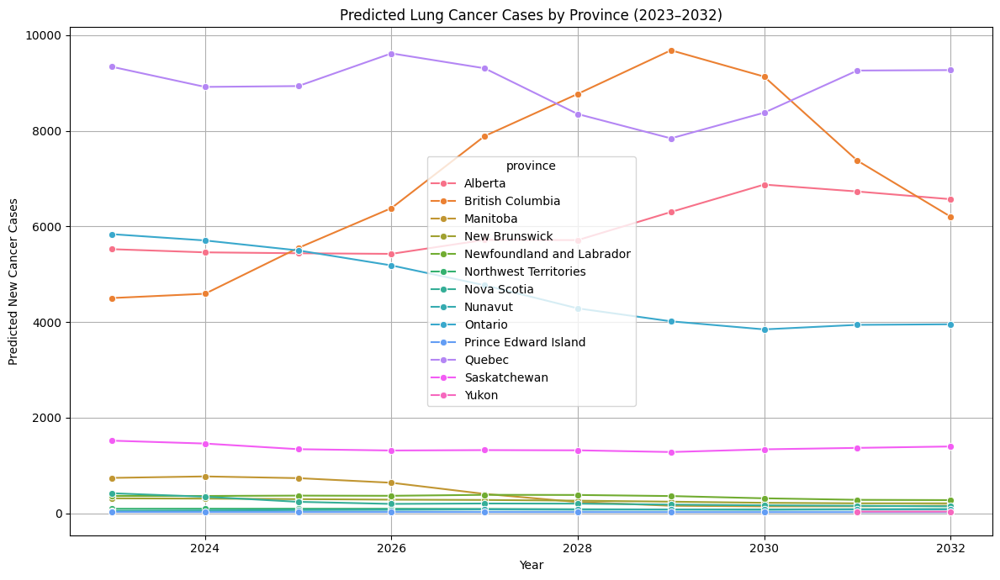

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 7))
sns.lineplot(data=forecast_df, x='year', y='predicted_cancer_cases', hue='province', marker='o')
plt.title('Predicted Lung Cancer Cases by Province (2023–2032)')
plt.ylabel('Predicted New Cancer Cases')
plt.xlabel('Year')
plt.grid(True)
plt.tight_layout()
plt.show()


Visualize Actual + Predicted (2002–2032)

In [ ]:
actual_df = lung_cancer_df_imputed[['province', 'year', 'Number of new cancer cases']].copy()
actual_df.rename(columns={'Number of new cancer cases': 'lung_cancer_cases'}, inplace=True)

predicted_df = forecast_df[['province', 'year', 'predicted_cancer_cases']].copy()
predicted_df.rename(columns={'predicted_cancer_cases': 'lung_cancer_cases'}, inplace=True)

combined_df = pd.concat([actual_df, predicted_df], ignore_index=True)
combined_df = combined_df.sort_values(['province', 'year'])

combined_df['data_type'] = ['Actual' if yr <= 2022 else 'Predicted' for yr in combined_df['year']]

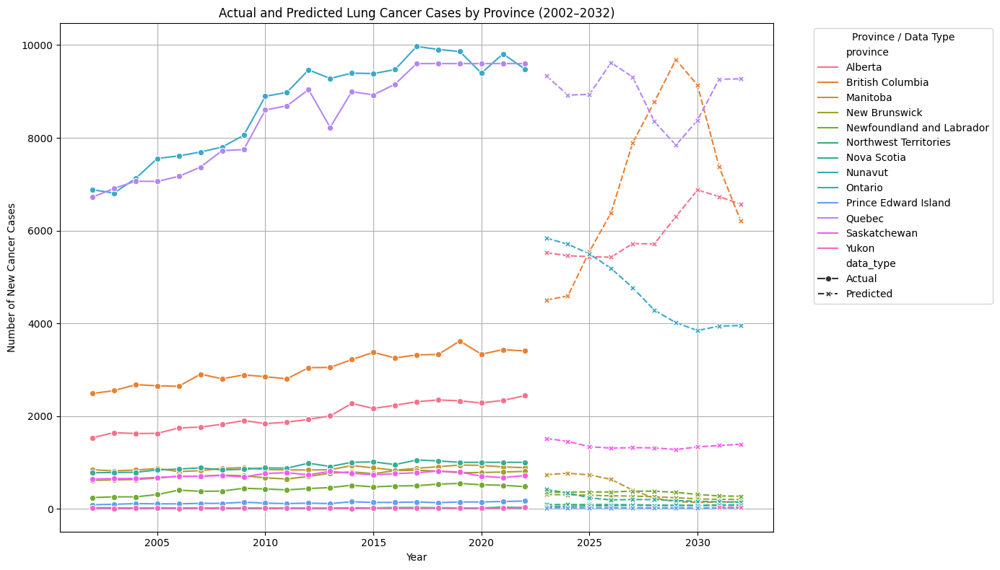

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
sns.lineplot(data=combined_df, x='year', y='lung_cancer_cases', hue='province', style='data_type', markers=True)

plt.title('Actual and Predicted Lung Cancer Cases by Province (2002–2032)')
plt.ylabel('Number of New Cancer Cases')
plt.xlabel('Year')
plt.legend(title='Province / Data Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Get prediction intervals (returns a 2D array: [:, 0] = lower, [:, 1] = upper)
intervals = gam.prediction_intervals(X_forecast, width=0.95)

# Add to DataFrame
forecast_df['predicted_lower'] = intervals[:, 0]
forecast_df['predicted_upper'] = intervals[:, 1]

# Select relevant columns
summary_table = forecast_df[['province', 'year', 'predicted_cancer_cases', 'predicted_lower', 'predicted_upper']]

# Preview first few rows
print(summary_table.head(10))


   province  year  predicted_cancer_cases  predicted_lower  predicted_upper
21  Alberta  2023             5524.622454      3958.110398      7091.134510
22  Alberta  2024             5458.132071      3882.787814      7033.476328
23  Alberta  2025             5439.082171      3855.895628      7022.268714
24  Alberta  2026             5426.400276      3846.067168      7006.733384
25  Alberta  2027             5719.492663      4124.625247      7314.360078
26  Alberta  2028             5713.926090      4119.687011      7308.165169
27  Alberta  2029             6302.429456      4679.203284      7925.655629
28  Alberta  2030             6876.058905      5220.366320      8531.751491
29  Alberta  2031             6731.559724      5093.604912      8369.514537
30  Alberta  2032             6570.610879      4950.512159      8190.709599


In [ ]:
summary_table_rounded = summary_table.copy()
summary_table_rounded[['predicted_cancer_cases', 'predicted_lower', 'predicted_upper']] = summary_table_rounded[
    ['predicted_cancer_cases', 'predicted_lower', 'predicted_upper']
].round(0).astype(int)

summary_table_rounded['predicted_lower'] = summary_table_rounded['predicted_lower'].clip(lower=0)


In [ ]:
# Group and display per province
for province in summary_table_rounded['province'].unique():
    print(f"\n Forecasted Lung Cancer Cases in {province} (2023–2032):\n")
    display(summary_table_rounded[summary_table_rounded['province'] == province].reset_index(drop=True))



 Forecasted Lung Cancer Cases in Alberta (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Alberta,2023,5525,3958,7091
1,Alberta,2024,5458,3883,7033
2,Alberta,2025,5439,3856,7022
3,Alberta,2026,5426,3846,7007
4,Alberta,2027,5719,4125,7314
5,Alberta,2028,5714,4120,7308
6,Alberta,2029,6302,4679,7926
7,Alberta,2030,6876,5220,8532
8,Alberta,2031,6732,5094,8370
9,Alberta,2032,6571,4951,8191



 Forecasted Lung Cancer Cases in British Columbia (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,British Columbia,2023,4502,3027,5977
1,British Columbia,2024,4592,3087,6097
2,British Columbia,2025,5549,3997,7102
3,British Columbia,2026,6384,4800,7967
4,British Columbia,2027,7890,6273,9508
5,British Columbia,2028,8774,7113,10435
6,British Columbia,2029,9686,7959,11414
7,British Columbia,2030,9136,7399,10872
8,British Columbia,2031,7378,5674,9081
9,British Columbia,2032,6206,4559,7853



 Forecasted Lung Cancer Cases in Manitoba (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Manitoba,2023,739,0,2159
1,Manitoba,2024,770,0,2194
2,Manitoba,2025,734,0,2155
3,Manitoba,2026,637,0,2051
4,Manitoba,2027,404,0,1793
5,Manitoba,2028,233,0,1597
6,Manitoba,2029,156,0,1517
7,Manitoba,2030,143,0,1510
8,Manitoba,2031,146,0,1514
9,Manitoba,2032,156,0,1525



 Forecasted Lung Cancer Cases in New Brunswick (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,New Brunswick,2023,311,0,1682
1,New Brunswick,2024,305,0,1680
2,New Brunswick,2025,295,0,1683
3,New Brunswick,2026,283,0,1678
4,New Brunswick,2027,277,0,1674
5,New Brunswick,2028,262,0,1655
6,New Brunswick,2029,241,0,1626
7,New Brunswick,2030,218,0,1597
8,New Brunswick,2031,207,0,1576
9,New Brunswick,2032,206,0,1573



 Forecasted Lung Cancer Cases in Newfoundland and Labrador (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Newfoundland and Labrador,2023,362,0,1729
1,Newfoundland and Labrador,2024,361,0,1729
2,Newfoundland and Labrador,2025,368,0,1736
3,Newfoundland and Labrador,2026,364,0,1732
4,Newfoundland and Labrador,2027,384,0,1754
5,Newfoundland and Labrador,2028,382,0,1751
6,Newfoundland and Labrador,2029,359,0,1728
7,Newfoundland and Labrador,2030,312,0,1679
8,Newfoundland and Labrador,2031,280,0,1647
9,Newfoundland and Labrador,2032,274,0,1642



 Forecasted Lung Cancer Cases in Northwest Territories (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Northwest Territories,2023,92,0,1460
1,Northwest Territories,2024,94,0,1461
2,Northwest Territories,2025,94,0,1461
3,Northwest Territories,2026,93,0,1460
4,Northwest Territories,2027,90,0,1458
5,Northwest Territories,2028,83,0,1451
6,Northwest Territories,2029,78,0,1446
7,Northwest Territories,2030,78,0,1446
8,Northwest Territories,2031,85,0,1452
9,Northwest Territories,2032,88,0,1456



 Forecasted Lung Cancer Cases in Nova Scotia (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Nova Scotia,2023,418,0,1780
1,Nova Scotia,2024,345,0,1709
2,Nova Scotia,2025,238,0,1611
3,Nova Scotia,2026,194,0,1576
4,Nova Scotia,2027,203,0,1584
5,Nova Scotia,2028,200,0,1576
6,Nova Scotia,2029,180,0,1555
7,Nova Scotia,2030,164,0,1538
8,Nova Scotia,2031,154,0,1530
9,Nova Scotia,2032,145,0,1517



 Forecasted Lung Cancer Cases in Nunavut (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Nunavut,2023,48,0,1418
1,Nunavut,2025,66,0,1435
2,Nunavut,2026,70,0,1439
3,Nunavut,2027,77,0,1446
4,Nunavut,2028,73,0,1442
5,Nunavut,2029,76,0,1444
6,Nunavut,2030,72,0,1441
7,Nunavut,2031,76,0,1445
8,Nunavut,2032,79,0,1448



 Forecasted Lung Cancer Cases in Ontario (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Ontario,2023,5839,4225,7452
1,Ontario,2024,5707,4097,7317
2,Ontario,2025,5499,3892,7105
3,Ontario,2026,5185,3602,6767
4,Ontario,2027,4770,3227,6313
5,Ontario,2028,4286,2787,5785
6,Ontario,2029,4015,2534,5496
7,Ontario,2030,3846,2370,5323
8,Ontario,2031,3941,2464,5418
9,Ontario,2032,3953,2480,5426



 Forecasted Lung Cancer Cases in Prince Edward Island (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Prince Edward Island,2023,25,0,1398
1,Prince Edward Island,2024,25,0,1398
2,Prince Edward Island,2025,25,0,1398
3,Prince Edward Island,2026,25,0,1398
4,Prince Edward Island,2027,24,0,1397
5,Prince Edward Island,2028,23,0,1396
6,Prince Edward Island,2029,23,0,1396
7,Prince Edward Island,2030,23,0,1396
8,Prince Edward Island,2031,23,0,1396
9,Prince Edward Island,2032,23,0,1396



 Forecasted Lung Cancer Cases in Quebec (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Quebec,2023,9341,7555,11127
1,Quebec,2024,8920,7126,10714
2,Quebec,2025,8937,7129,10745
3,Quebec,2026,9621,7700,11543
4,Quebec,2027,9310,7445,11174
5,Quebec,2028,8352,6609,10095
6,Quebec,2029,7843,6199,9486
7,Quebec,2030,8380,6723,10038
8,Quebec,2031,9262,7548,10977
9,Quebec,2032,9272,7575,10968



 Forecasted Lung Cancer Cases in Saskatchewan (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Saskatchewan,2023,1518,124,2912
1,Saskatchewan,2024,1457,75,2840
2,Saskatchewan,2025,1340,0,2718
3,Saskatchewan,2026,1312,0,2691
4,Saskatchewan,2027,1320,0,2706
5,Saskatchewan,2028,1316,0,2704
6,Saskatchewan,2029,1280,0,2666
7,Saskatchewan,2030,1336,0,2717
8,Saskatchewan,2031,1367,0,2747
9,Saskatchewan,2032,1396,16,2776



 Forecasted Lung Cancer Cases in Yukon (2023–2032):



,province,year,predicted_cancer_cases,predicted_lower,predicted_upper
0,Yukon,2031,34,0,1406
1,Yukon,2032,33,0,1405


In [ ]:
# Remove 'const' row from VIF results
vif_clean = vif_data[vif_data['Feature'] != 'const']


In [ ]:
# Merge SHAP and VIF by feature name
shap_vif_df = pd.merge(shap_importance_df, vif_clean, on='Feature')


In [ ]:
shap_vif_df = shap_vif_df.sort_values(by='SHAP_Importance', ascending=False)
shap_vif_df.to_csv("shap_importance.csv", index=False)
